# AUGMENTACIJA PODATAKA KOD AUDIO ZAPISA

ESC-50 dataset je označena kolekcija od 2000 audio zapisa iz okoline, koja se koristi za benchmarking zadataka klasifikacije zvuka.

Dataset se sastoji od 5 sekundi dugih snimaka organizovanih u 50 semantičkih klasa (sa po 40 primera po klasi), koje su labavo raspoređene u 5 glavnih kategorija: zvuci životinja, prirodni zvuci i zvuci vode, ljudski zvuci, ne-govorni zvuci, zvuci iz domaćinstva i gradski zvuci.

Klase unutar glavnih kategorija obuhvataju zvukove poput mačjeg mijaukanja, ljudskog smeha, kucanja po tastaturi, zvukova kiše i motornih testera. Dataset možete preuzeti kloniranjem iz sledećeg repozitorijuma!
Link dataseta: https://www.kaggle.com/datasets/mmoreaux/environmental-sound-classification-50

In [1]:
import os
from tqdm import tqdm

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.utils import shuffle
from sklearn.metrics import classification_report, confusion_matrix


import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Dropout, Activation, GlobalAveragePooling2D, TimeDistributed, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import EfficientNetB5
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical


import librosa, librosa.display
import IPython.display as ipd
import csv
import datetime

from autopool.keras import AutoPool1D
from scipy.io.wavfile import write
from audiomentations import Compose, AddGaussianNoise, TimeStretch, PitchShift, Shift, AddBackgroundNoise
     

2024-09-15 03:27:31.580699: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
base_dir = "environmental-sound-classification-50"
augmented_audio_dir = os.path.join(base_dir, "augmented_audio")
meta_file = os.path.join(base_dir, "esc50.csv")
audio_dir = os.path.join(base_dir, "audio/audio/44100/")
bg_noise_dir = os.path.join(base_dir, "bg_noise")
embeddings_dir = os.path.join(base_dir, "embeddings")
saved_models_dir = os.path.join(base_dir, "saved_models")
log_dir = os.path.join(base_dir, "logs")

In [3]:
meta_data = pd.read_csv(meta_file)
meta_data

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A
...,...,...,...,...,...,...,...
1995,5-263831-B-6.wav,5,6,hen,False,263831,B
1996,5-263902-A-36.wav,5,36,vacuum_cleaner,False,263902,A
1997,5-51149-A-25.wav,5,25,footsteps,False,51149,A
1998,5-61635-A-8.wav,5,8,sheep,False,61635,A


In [4]:
data_size = meta_data.shape
print(data_size)

(2000, 7)


In [5]:
class_dict = {}
for i in range(data_size[0]):
    if meta_data.loc[i,"target"] not in class_dict.keys():
        class_dict[meta_data.loc[i,"target"]] = meta_data.loc[i,"category"]
class_pd = pd.DataFrame(list(class_dict.items()), columns=["labels","classes"])
class_pd

,labels,classes
0,0,dog
1,14,chirping_birds
2,36,vacuum_cleaner
3,19,thunderstorm
4,30,door_wood_knock
5,34,can_opening
6,9,crow
7,22,clapping
8,48,fireworks
9,41,chainsaw


### Exploring the Audio Data

Let's first explore a random audio sample of dog bark 1-100032-A-0.wav by printing the values of :

Sample rate (sr) : defines the number of samples per second (or per other unit) taken from a continuous signal to make a discrete or digital signal.

Amplitude (y) : a measure of how high (and low) the wave extends from the x axis

In [6]:
y, sr = librosa.load(audio_dir + "1-100032-A-0.wav")

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# The duration is equal to the number of frames divided by the framerate
print('Duration of the audio file:', np.shape(y)[0]/sr, 'second')

y: [0. 0. 0. ... 0. 0. 0.] 

y shape: (110250,) 

Sample Rate (KHz): 22050 

Duration of the audio file: 5.0 second


In [7]:
ipd.Audio(audio_dir + "1-100032-A-0.wav")

## Visualize Audio : Sound Waves

In [8]:
samples = meta_data.sample(4)[['filename','category']]

In [9]:
# load a wave data
def load_wave_data(idx):
    filename = audio_dir + meta_data['filename'][idx]
    category = meta_data['category'][idx]
    y, sr = librosa.load(filename)
    return y,sr,category

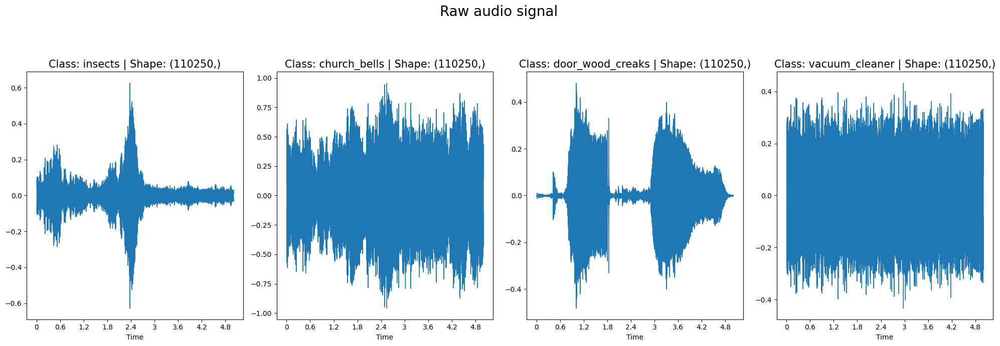

In [10]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category= load_wave_data(idx)
   
    #plot the wave
    librosa.display.waveshow(y,sr=sr,ax=ax[i])
    
    ax[i].set_title(f"Class: {category} | Shape: {y.shape}",fontsize=15)

fig.suptitle('Raw audio signal\n\n',fontsize=20)
fig.tight_layout()

### MFCC

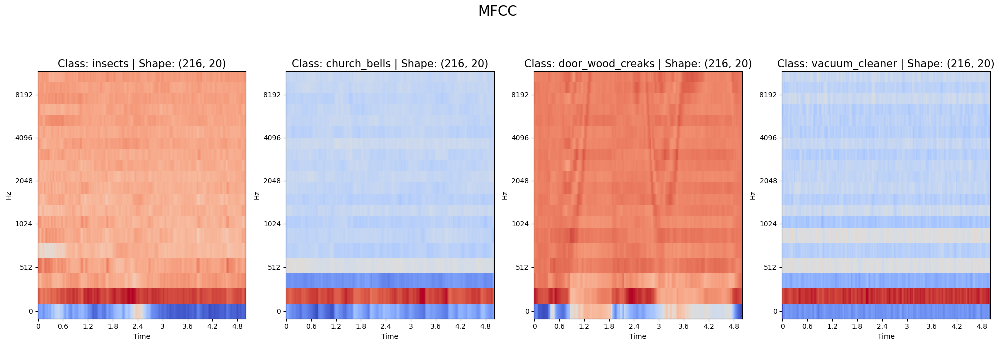

In [11]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category= load_wave_data(idx)
    
    #get the mfccs
    mfcc = librosa.feature.mfcc(y=y,sr=sr,n_fft=2048, hop_length=512, n_mels=128)
    
    #plot the mfcc
    librosa.display.specshow(mfcc, sr=sr, ax=ax[i],y_axis='mel', x_axis='time')
    
    ax[i].set_title(f"Class: {category} | Shape: {mfcc.T.shape}",fontsize=15)

fig.suptitle('MFCC\n\n',fontsize=20)
fig.tight_layout()

### Mel Spec

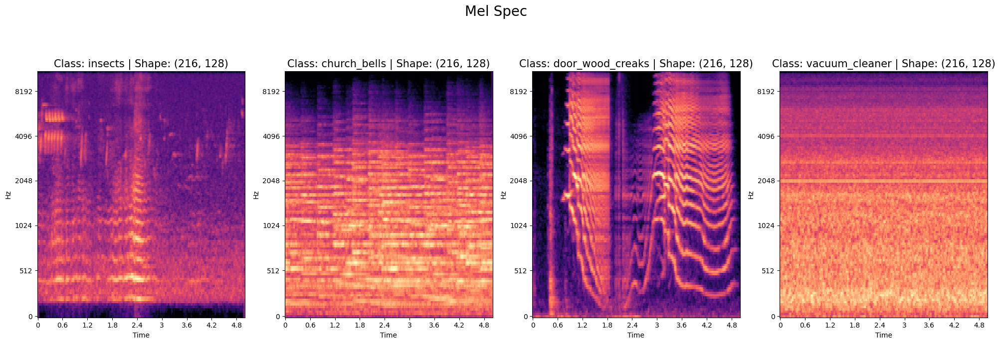

In [12]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category= load_wave_data(idx)


    #get the melspec in db before plotting
    melspec = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512, n_mels=128)
    melspec = librosa.power_to_db(melspec, ref=np.max)
    
    #plot the melspec
    librosa.display.specshow(melspec,sr=sr,ax=ax[i], y_axis='mel', x_axis='time')
    ax[i].set_title(f"Class: {category} | Shape: {melspec.T.shape}",fontsize=15)

fig.suptitle('Mel Spec\n\n',fontsize=20)
fig.tight_layout()

### Tempogram

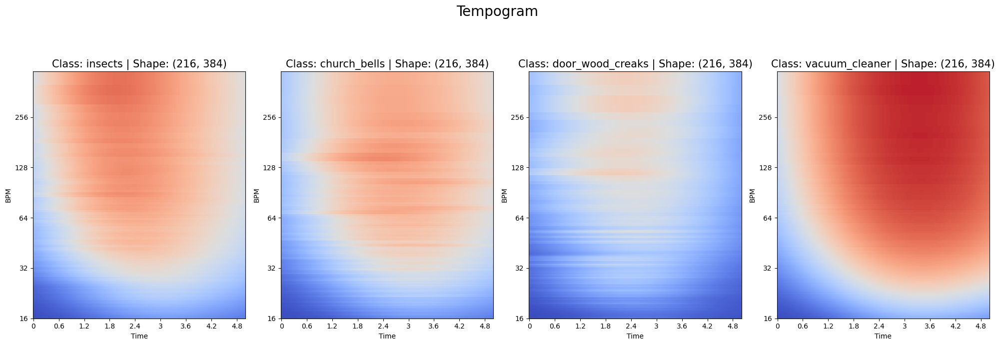

In [13]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category= load_wave_data(idx)
    
    #get the tempogram
    oenv = librosa.onset.onset_strength(y=y, sr=sr, hop_length=512)
    tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr, hop_length= 512, norm=None)
 
    #plot the tempogram
    librosa.display.specshow(tempogram, sr=sr, hop_length=512,x_axis='time', y_axis='tempo',ax=ax[i])
    ax[i].set_title(f"Class: {category} | Shape: {tempogram.T.shape}",fontsize=15)

fig.suptitle('Tempogram\n\n',fontsize=20)
fig.tight_layout()

### Chromogram

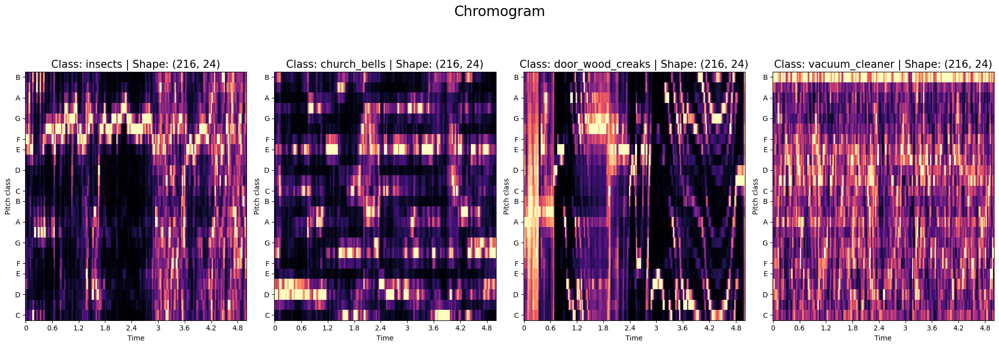

In [14]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category= load_wave_data(idx)


    #get the chromagram
    chromagram = librosa.feature.chroma_stft(y=y,sr=sr,n_fft=2048,hop_length=512, n_chroma=24)
 
    #plot the chromagram
    librosa.display.specshow(chromagram, sr=sr, hop_length=512,x_axis='time', y_axis='chroma',ax=ax[i])
    ax[i].set_title(f"Class: {category} | Shape: {chromagram.T.shape}",fontsize=15)

fig.suptitle('Chromogram\n\n',fontsize=20)
fig.tight_layout()

In [15]:
for i, idx in enumerate(samples.index):
    y, sr, category = load_wave_data(idx)
    print(f"Category: {category}")
    display(ipd.Audio(y, rate=sr)) 

Category: insects


Category: church_bells


Category: door_wood_creaks


Category: vacuum_cleaner


## Augment audio data


### 1. White noise

In [16]:
# data augmentation: add white noise
def add_white_noise(x, rate=0.002):
    return x + rate*np.random.randn(len(x))

Category: insects with noise


Category: church_bells with noise


Category: door_wood_creaks with noise


Category: vacuum_cleaner with noise


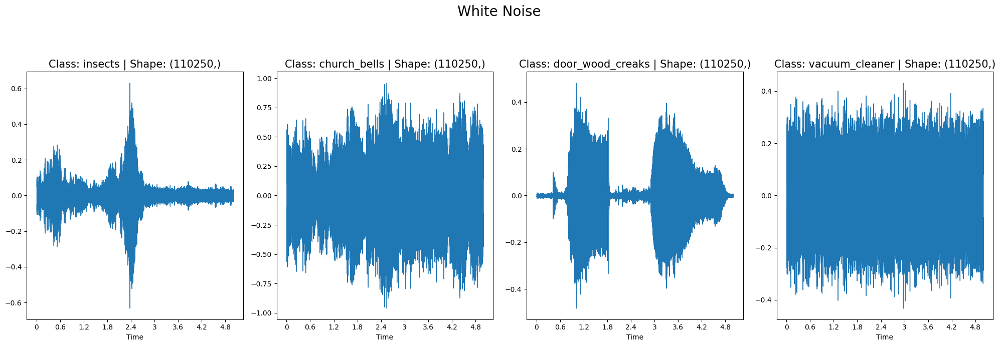

In [17]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category= load_wave_data(idx)
    
    y_wn = add_white_noise(y)
    
    #plot the wave
    librosa.display.waveshow(y_wn,sr=sr,ax=ax[i])
    
    ax[i].set_title(f"Class: {category} | Shape: {y_wn.shape}",fontsize=15)
    print(f"Category: {category} with noise")
    display(ipd.Audio(y_wn, rate=sr)) 

fig.suptitle('White Noise\n\n',fontsize=20)
fig.tight_layout()

### Time stretch

In [18]:
# data augmentation: stretch sound
def stretch_sound(x, rate):
    input_length = len(x)
    x = librosa.effects.time_stretch(x, rate=rate)
    if len(x)>input_length:
        return x[:input_length]
    else:
        return np.pad(x, (0, max(0, input_length - len(x))), "constant")

Category: insects with stretch sound 


Category: church_bells with stretch sound 


Category: door_wood_creaks with stretch sound 


Category: vacuum_cleaner with stretch sound 


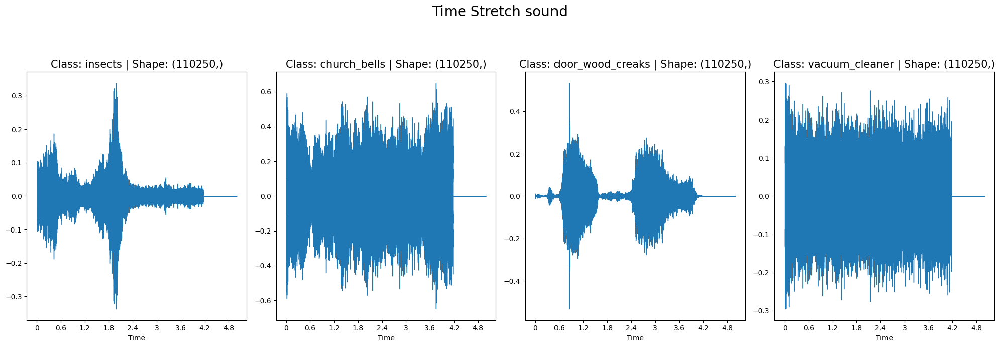

In [19]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category= load_wave_data(idx)
    
    y_st = stretch_sound(y, 1.2)
    
    #plot the wave
    librosa.display.waveshow(y_st,sr=sr,ax=ax[i])
    
    ax[i].set_title(f"Class: {category} | Shape: {y_st.shape}",fontsize=15)
    print(f"Category: {category} with stretch sound ")
    display(ipd.Audio(y_st, rate=sr)) 

fig.suptitle('Time Stretch sound\n\n',fontsize=20)
fig.tight_layout()

### Shift sound

In [20]:
# data augmentation: shift sound in timeframe
def shift_sound(x, rate=2):
    return np.roll(x, int(len(y)//rate))

Category: insects with shift sound 


Category: church_bells with shift sound 


Category: door_wood_creaks with shift sound 


Category: vacuum_cleaner with shift sound 


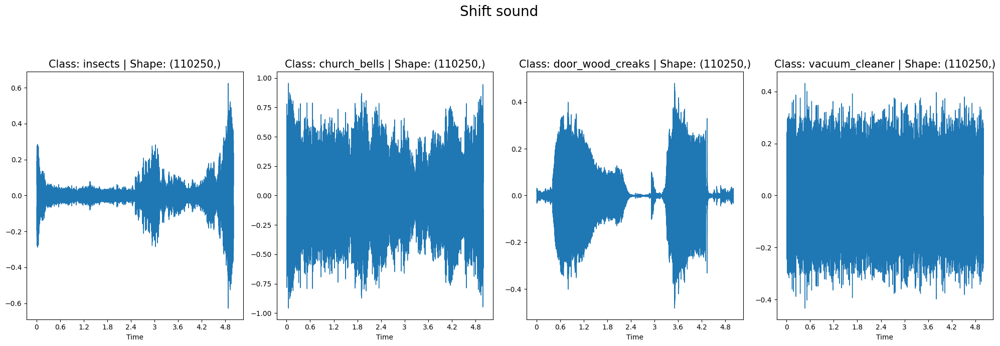

In [21]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category= load_wave_data(idx)
    
    y_ss = shift_sound(y)

    #plot the wave
    librosa.display.waveshow(y_ss,sr=sr,ax=ax[i])
    
    ax[i].set_title(f"Class: {category} | Shape: {y_ss.shape}",fontsize=15)
    print(f"Category: {category} with shift sound ")
    display(ipd.Audio(y_st, rate=sr)) 

fig.suptitle('Shift sound\n\n',fontsize=20)
fig.tight_layout()
    

### Pitch_shift

In [22]:
def pitch_shift(signal, sr, num_semitones):
    return librosa.effects.pitch_shift(signal, sr=sr, n_steps=num_semitones)

Category: insects with shift sound


Category: church_bells with shift sound


Category: door_wood_creaks with shift sound


Category: vacuum_cleaner with shift sound


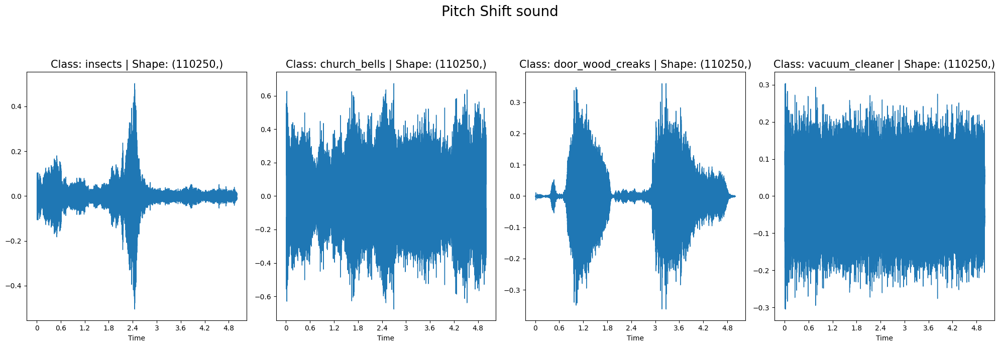

In [23]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category = load_wave_data(idx)
    nm = 2 * 2 * (np.random.uniform())
    y_ps = pitch_shift(y, sr, nm)

    # Plot the wave
    librosa.display.waveshow(y_ps, sr=sr, ax=ax[i])
    
    ax[i].set_title(f"Class: {category} | Shape: {y_ps.shape}", fontsize=15)
    print(f"Category: {category} with shift sound")
    display(ipd.Audio(y_ps, rate=sr))

fig.suptitle('Pitch Shift sound\n\n', fontsize=20)
fig.tight_layout()

### Volume scaling

In [24]:
def volume_scaling(data):
    sr  = 16000
    dyn_change = np.random.uniform(low=1.5,high=2.5)
    data = data * dyn_change
    return data

Category: insects with shift sound


Category: church_bells with shift sound


Category: door_wood_creaks with shift sound


Category: vacuum_cleaner with shift sound


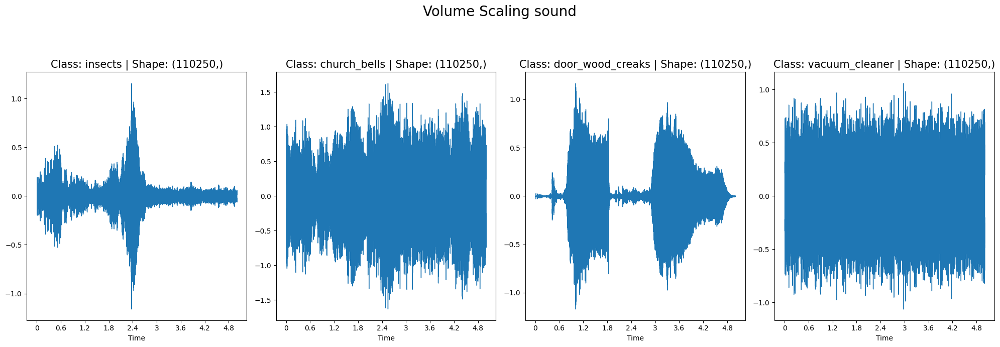

In [25]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category = load_wave_data(idx)
    y_vs = volume_scaling(y)

    # Plot the wave
    librosa.display.waveshow(y_vs, sr=sr, ax=ax[i])
    
    ax[i].set_title(f"Class: {category} | Shape: {y_vs.shape}", fontsize=15)
    print(f"Category: {category} with shift sound")
    display(ipd.Audio(y_vs, rate=sr))

fig.suptitle('Volume Scaling sound\n\n', fontsize=20)
fig.tight_layout()

### Polarity Inversion

Category: insects with shift sound


Category: church_bells with shift sound


Category: door_wood_creaks with shift sound


Category: vacuum_cleaner with shift sound


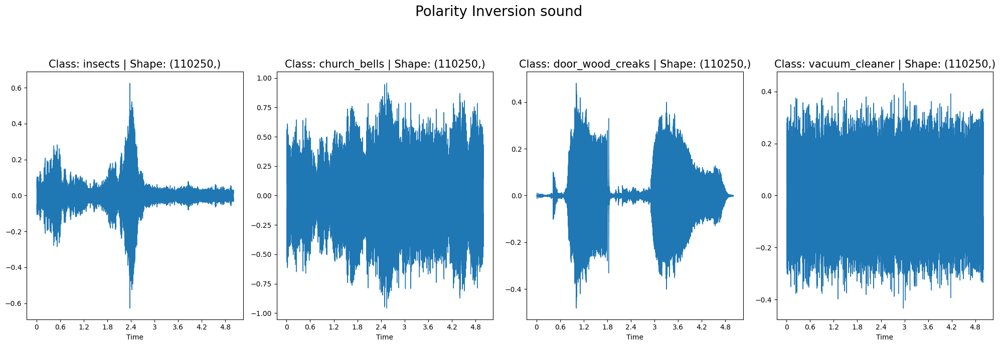

In [26]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,7))

for i, idx in enumerate(samples.index):
    y, sr, category = load_wave_data(idx)
    y_pi = -y

    # Plot the wave
    librosa.display.waveshow(y_pi, sr=sr, ax=ax[i])
    
    ax[i].set_title(f"Class: {category} | Shape: {y_pi.shape}", fontsize=15)
    print(f"Category: {category} with shift sound")
    display(ipd.Audio(y_pi, rate=sr))

fig.suptitle('Polarity Inversion sound\n\n', fontsize=20)
fig.tight_layout()

### Frequency Masking

Original


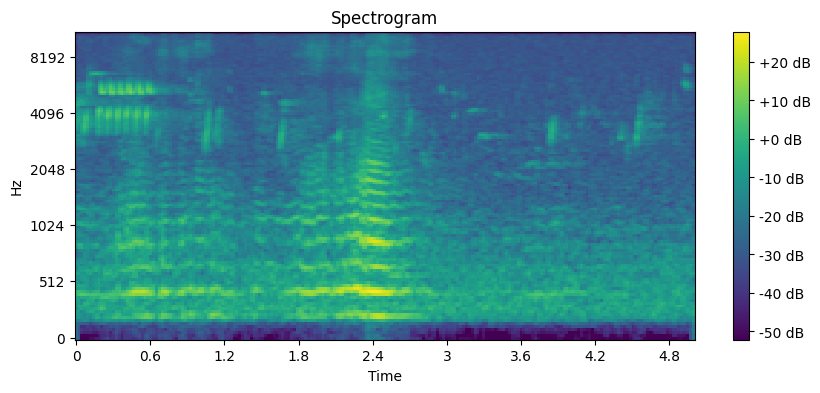

5 masks


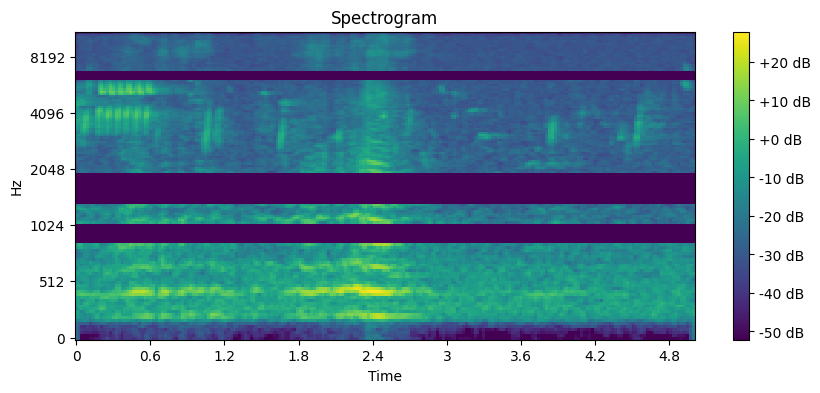

In [60]:
def freq_mask(spec, num_masks=1):
    import random
    spec = spec.copy()
    num_mels = spec.shape[0]
    for _ in range(num_masks):
        f = random.randint(0, num_mels // 4)
        f0 = random.randint(0, num_mels - f)
        f1 = f0 + f
          
        spec[f0:f1, :] = spec.min()
    return spec

def tensor_to_img(tensor):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(tensor, sr=sr, x_axis='time', y_axis='mel', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    plt.show()

def test_freq_mask():
    first_sample = samples.iloc[0]
    y, sr, category = load_wave_data(first_sample.name)
    
    spektro = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512, n_mels=128)
    spektro_db = librosa.power_to_db(spektro)

    print('Original')
    tensor_to_img(spektro_db)
    
    print('5 masks')
    masked_spektro = freq_mask(spektro_db, num_masks=5)
    tensor_to_img(masked_spektro)

test_freq_mask()

### Time Masking

Original


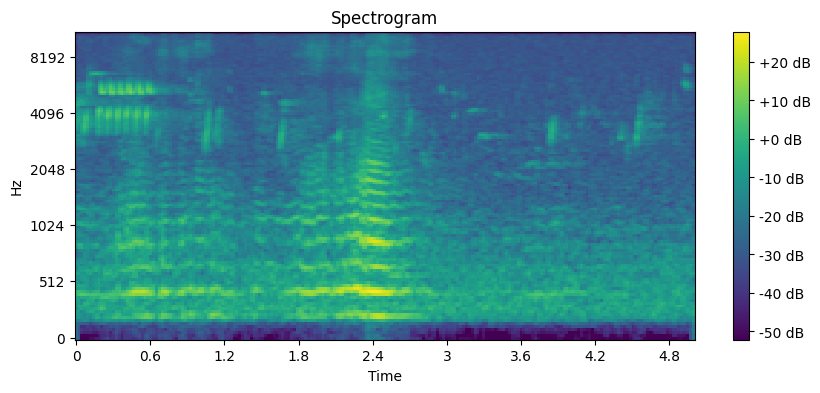

5 masks


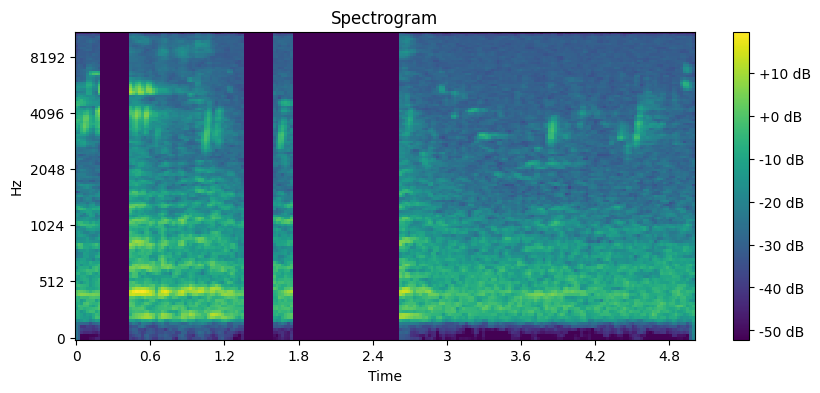

In [69]:
def time_mask(spec, num_masks=1):
    import random

    spec = spec.copy()
    num_frames = spec.shape[1]
    for _ in range(num_masks):
        t = random.randint(0, num_frames // 4)
        t0 = random.randint(0, num_frames - t)
        t1 = t0 + t

        spec[:, t0:t1] = spec.min()
    return spec

def tensor_to_img(tensor):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(tensor, sr=sr, x_axis='time', y_axis='mel', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    plt.show()

def test_time_mask():
    first_sample = samples.iloc[0]
    y, sr, category = load_wave_data(first_sample.name)
    
    spektro = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512, n_mels=128)
    spektro_db = librosa.power_to_db(spektro)  # Convert to dB

    print('Original')
    tensor_to_img(spektro_db)
    
    print('5 masks')
    masked_spektro = time_mask(spektro_db, num_masks=5)
    tensor_to_img(masked_spektro)

test_time_mask()


In [70]:
from audiomentations import Compose, AddGaussianNoise, AddBackgroundNoise

noise = Compose([
  AddGaussianNoise(min_amplitude=0.005, max_amplitude=0.15, p=1),
])
 
bg_noise = Compose([
    AddBackgroundNoise(
        bg_noise_dir, 
        min_snr_db=5, 
        max_snr_db=30, 
        p=1
    )
])

In [71]:
srate = 44100 ###### 22050 --> 1104   32000 --> 800   44100*2206    BEST 44100 1024
n_fft = 1024
win_len = 1024
hop_len = 512

n_mels = 128
mono = True
# resample = 'kaiser_best'
# extraction = True #False

second = 2.5

epochs = 20
batch_size = 32
augmentations_arr = ['ps(-1)','ps(-2)', 'ts(1.2)', 'bg', 'noise'] 

In [72]:
def load_sample_by_index(index):
  sample_wav = metadata.filename[index]
  sample_path = audio_dir
  sample_filename = os.path.join(sample_path, sample_wav) 
  y, sr = librosa.load(sample_filename,sr=srate)
  return y,sr,sample_filename

In [73]:
# If using esc10 
metadata = meta_data.loc[meta_data.esc10 == True]
metadata

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
14,1-110389-A-0.wav,1,0,dog,True,110389,A
24,1-116765-A-41.wav,1,41,chainsaw,True,116765,A
54,1-17150-A-12.wav,1,12,crackling_fire,True,17150,A
55,1-172649-A-40.wav,1,40,helicopter,True,172649,A
...,...,...,...,...,...,...,...
1876,5-233160-A-1.wav,5,1,rooster,True,233160,A
1888,5-234879-A-1.wav,5,1,rooster,True,234879,A
1889,5-234879-B-1.wav,5,1,rooster,True,234879,B
1894,5-235671-A-38.wav,5,38,clock_tick,True,235671,A


In [74]:
metadata['category'].value_counts()

category
dog               40
chainsaw          40
crackling_fire    40
helicopter        40
rain              40
crying_baby       40
clock_tick        40
sneezing          40
rooster           40
sea_waves         40
Name: count, dtype: int64

In [75]:
from scipy.io.wavfile import write
import csv

def augmentation_helper(aug_name,y,sr):
  if aug_name == "noise":
    aug_y = noise(y,sr)

  elif aug_name == "bg":
    aug_y = bg_noise(y,sr)
    
  elif aug_name == "ps(-1)":
    aug_y = pitch_shift(y,sr,-1)

  elif aug_name == "ps(-2)":
    aug_y = pitch_shift(y,sr,-2)
  
  elif aug_name == "ts(1.2)":
    aug_y = stretch_sound(y, 1.2)
  return aug_y


def apply_augmentation():
  count = 0
  for index,row in tqdm(metadata.iterrows()):
      if count%20 == 0:
        print(f"augmenting audio signal number : {count}/{len(metadata)}")
        
      y,sr,p = load_sample_by_index(index)

      #loop over list of augmentations to apply them to all 
      for aug in augmentations_arr :
        aug_y = augmentation_helper(aug_name=aug, y=y, sr=sr)
        path = os.path.join(augmented_audio_dir,aug+"_"+ str(row["filename"]))
        print(aug,path)
        if os.path.exists(path) == False:
          write(path,sr, aug_y)
      count+=1


def get_metadata(meta_dir):
  csv_fields = ['filename', 'fold', 'target', 'category', 'src_file', 'take', 'augmented']
  count = 0
  dict_arr = []
  for index,row in tqdm(metadata.iterrows()):
    for aug in augmentations_arr :
      dict_arr.append({'filename':aug+"_"+row["filename"], 'fold':row["fold"], 'target': row["target"], 'category':row["category"], 'src_file': row["src_file"], 'take': row["take"]})
    dict_arr.append({'filename':row["filename"], 'fold':row["fold"], 'target': row["target"], 'category':row["category"], 'src_file': row["src_file"], 'take': row["take"]})


  with open(meta_dir, 'w') as csvfile:
    writer = csv.DictWriter(csvfile, fieldnames = csv_fields)
    writer.writeheader()
    writer.writerows(dict_arr)

  return (pd.read_csv(meta_dir))

In [76]:
apply_augmentation()

0it [00:00, ?it/s]

augmenting audio signal number : 0/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-100032-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-100032-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-100032-A-0.wav


1it [00:00,  4.18it/s]

bg environmental-sound-classification-50/augmented_audio/bg_1-100032-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-100032-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-110389-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-110389-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-110389-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-110389-A-0.wav


2it [00:00,  4.63it/s]

noise environmental-sound-classification-50/augmented_audio/noise_1-110389-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-116765-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-116765-A-41.wav


3it [00:00,  4.56it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-116765-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-116765-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-116765-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-17150-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-17150-A-12.wav


4it [00:00,  4.45it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-17150-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-17150-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-17150-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-172649-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-172649-A-40.wav


5it [00:01,  4.55it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-172649-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-172649-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-172649-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-172649-B-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-172649-B-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-172649-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-172649-B-40.wav


6it [00:01,  4.70it/s]

noise environmental-sound-classification-50/augmented_audio/noise_1-172649-B-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-172649-C-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-172649-C-40.wav


7it [00:01,  4.43it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-172649-C-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-172649-C-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-172649-C-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-172649-D-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-172649-D-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-172649-D-40.wav


8it [00:01,  4.62it/s]

bg environmental-sound-classification-50/augmented_audio/bg_1-172649-D-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-172649-D-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-172649-E-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-172649-E-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-172649-E-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-172649-E-40.wav


9it [00:01,  4.72it/s]

noise environmental-sound-classification-50/augmented_audio/noise_1-172649-E-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-172649-F-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-172649-F-40.wav


10it [00:02,  4.35it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-172649-F-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-172649-F-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-172649-F-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-17367-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-17367-A-10.wav


11it [00:02,  4.48it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-17367-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-17367-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-17367-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-17565-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-17565-A-12.wav


12it [00:02,  4.56it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-17565-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-17565-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-17565-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-17742-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-17742-A-12.wav


13it [00:02,  4.54it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-17742-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-17742-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-17742-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-17808-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-17808-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-17808-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-17808-A-12.wav


14it [00:03,  4.69it/s]

noise environmental-sound-classification-50/augmented_audio/noise_1-17808-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-17808-B-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-17808-B-12.wav


15it [00:03,  4.51it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-17808-B-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-17808-B-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-17808-B-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-181071-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-181071-A-40.wav


16it [00:03,  4.45it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-181071-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-181071-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-181071-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-181071-B-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-181071-B-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-181071-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-181071-B-40.wav


17it [00:03,  4.64it/s]

noise environmental-sound-classification-50/augmented_audio/noise_1-181071-B-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-187207-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-187207-A-20.wav


18it [00:03,  4.65it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-187207-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-187207-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-187207-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-19898-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-19898-A-41.wav


19it [00:04,  4.65it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-19898-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-19898-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-19898-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-19898-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-19898-B-41.wav


21it [00:04,  4.90it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-19898-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-19898-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-19898-B-41.wav
augmenting audio signal number : 20/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-19898-C-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-19898-C-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-19898-C-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-19898-C-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-19898-C-41.wav


22it [00:04,  4.88it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-211527-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-211527-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-211527-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-211527-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-211527-A-20.wav


23it [00:04,  4.91it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-211527-B-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-211527-B-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-211527-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-211527-B-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-211527-B-20.wav


24it [00:05,  4.79it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-211527-C-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-211527-C-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-211527-C-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-211527-C-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-211527-C-20.wav


25it [00:05,  4.86it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-21189-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-21189-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-21189-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-21189-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-21189-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-21934-A-38.wav


26it [00:05,  4.84it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-21934-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-21934-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-21934-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-21934-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-21935-A-38.wav


27it [00:05,  5.01it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-21935-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-21935-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-21935-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-21935-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-22694-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-22694-A-20.wav


28it [00:05,  5.17it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-22694-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-22694-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-22694-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-22694-B-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-22694-B-20.wav


30it [00:06,  5.21it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-22694-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-22694-B-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-22694-B-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-26143-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-26143-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-26143-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-26143-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-26143-A-21.wav


31it [00:06,  5.30it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-26222-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-26222-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-26222-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-26222-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-26222-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-26806-A-1.wav


32it [00:06,  5.50it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-26806-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-26806-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-26806-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-26806-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-27724-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-27724-A-1.wav


33it [00:06,  5.62it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-27724-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-27724-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-27724-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-28135-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-28135-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-28135-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-28135-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-28135-A-11.wav


35it [00:07,  5.46it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-28135-B-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-28135-B-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-28135-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-28135-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-28135-B-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-29561-A-10.wav


36it [00:07,  5.49it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-29561-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-29561-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-29561-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-29561-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-29680-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-29680-A-21.wav


38it [00:07,  5.52it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-29680-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-29680-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-29680-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-30226-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-30226-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-30226-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-30226-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-30226-A-0.wav


39it [00:07,  5.49it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-30344-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-30344-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-30344-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-30344-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-30344-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-31748-A-21.wav


40it [00:08,  5.64it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-31748-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-31748-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-31748-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-31748-A-21.wav
augmenting audio signal number : 40/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-32318-A-0.wav


41it [00:08,  5.06it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-32318-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-32318-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-32318-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-32318-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-34119-A-1.wav


42it [00:08,  4.88it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-34119-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-34119-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-34119-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-34119-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-34119-B-1.wav


43it [00:08,  4.85it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-34119-B-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-34119-B-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-34119-B-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-34119-B-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-35687-A-38.wav


44it [00:09,  4.70it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-35687-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-35687-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-35687-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-35687-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-39901-A-11.wav


45it [00:09,  4.53it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-39901-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-39901-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-39901-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-39901-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-39901-B-11.wav


46it [00:09,  4.64it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-39901-B-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-39901-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-39901-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-39901-B-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-39923-A-1.wav


47it [00:09,  4.61it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-39923-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-39923-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-39923-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-39923-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-40730-A-1.wav


48it [00:09,  4.77it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-40730-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-40730-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-40730-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-40730-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-4211-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-4211-A-12.wav


49it [00:10,  4.93it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-4211-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-4211-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-4211-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-42139-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-42139-A-38.wav


50it [00:10,  4.58it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-42139-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-42139-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-42139-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-43382-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-43382-A-1.wav


51it [00:10,  4.54it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-43382-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-43382-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-43382-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-43760-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-43760-A-11.wav


53it [00:10,  4.71it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-43760-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-43760-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-43760-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-44831-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-44831-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-44831-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-44831-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-44831-A-1.wav


54it [00:11,  4.83it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-46272-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-46272-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-46272-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-46272-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-46272-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-47250-A-41.wav


55it [00:11,  5.06it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-47250-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-47250-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-47250-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-47250-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-47250-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-47250-B-41.wav


56it [00:11,  5.21it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-47250-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-47250-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-47250-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-47273-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-47273-A-21.wav


58it [00:11,  5.13it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-47273-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-47273-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-47273-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-47274-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-47274-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-47274-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-47274-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-47274-A-21.wav


59it [00:12,  5.32it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-48413-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-48413-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-48413-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-48413-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-48413-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-50060-A-10.wav


60it [00:12,  5.34it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-50060-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-50060-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-50060-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-50060-A-10.wav
augmenting audio signal number : 60/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-54505-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-54505-A-21.wav


62it [00:12,  5.51it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-54505-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-54505-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-54505-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-54958-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-54958-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-54958-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-54958-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-54958-A-10.wav


63it [00:12,  5.62it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-56311-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-56311-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-56311-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-56311-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-56311-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-57163-A-38.wav


64it [00:12,  5.71it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-57163-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-57163-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-57163-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-57163-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-59324-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-59324-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-59324-A-21.wav


66it [00:13,  5.88it/s]

bg environmental-sound-classification-50/augmented_audio/bg_1-59324-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-59324-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-59513-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-59513-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-59513-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-59513-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-59513-A-0.wav


67it [00:13,  5.88it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-60997-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-60997-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-60997-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-60997-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-60997-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-60997-B-20.wav


68it [00:13,  5.80it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-60997-B-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-60997-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-60997-B-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-60997-B-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-61252-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-61252-A-11.wav


69it [00:13,  5.81it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-61252-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-61252-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-61252-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-62849-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-62849-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-62849-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-62849-A-38.wav


71it [00:14,  5.52it/s]

noise environmental-sound-classification-50/augmented_audio/noise_1-62849-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-62850-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-62850-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-62850-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-62850-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-62850-A-38.wav


72it [00:14,  5.53it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-63871-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-63871-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-63871-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-63871-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-63871-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-64398-A-41.wav


73it [00:14,  5.36it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-64398-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-64398-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-64398-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-64398-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-64398-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-64398-B-41.wav


75it [00:14,  5.44it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-64398-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-64398-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-64398-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-7057-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-7057-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-7057-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-7057-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-7057-A-12.wav


76it [00:15,  5.56it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-81883-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-81883-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-81883-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-81883-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-81883-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-85362-A-0.wav


77it [00:15,  5.58it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-85362-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-85362-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-85362-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-85362-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-91359-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-91359-A-11.wav


78it [00:15,  5.40it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-91359-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-91359-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-91359-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-91359-B-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-91359-B-11.wav


79it [00:15,  5.04it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-91359-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-91359-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-91359-B-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_1-97392-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_1-97392-A-0.wav


80it [00:15,  4.91it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_1-97392-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_1-97392-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_1-97392-A-0.wav
augmenting audio signal number : 80/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-100786-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-100786-A-1.wav


81it [00:16,  4.86it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-100786-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-100786-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-100786-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-101676-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-101676-A-10.wav


82it [00:16,  4.68it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-101676-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-101676-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-101676-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-102852-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-102852-A-11.wav


83it [00:16,  4.61it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-102852-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-102852-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-102852-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-107351-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-107351-A-20.wav


84it [00:16,  4.55it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-107351-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-107351-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-107351-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-107351-B-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-107351-B-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-107351-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-107351-B-20.wav


86it [00:17,  5.01it/s]

noise environmental-sound-classification-50/augmented_audio/noise_2-107351-B-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-109505-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-109505-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-109505-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-109505-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-109505-A-21.wav


87it [00:17,  5.23it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-114280-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-114280-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-114280-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-114280-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-114280-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-114587-A-0.wav


88it [00:17,  5.38it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-114587-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-114587-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-114587-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-114587-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-116400-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-116400-A-0.wav


90it [00:17,  5.53it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-116400-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-116400-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-116400-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-117271-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-117271-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-117271-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-117271-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-117271-A-0.wav


91it [00:18,  5.52it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-117625-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-117625-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-117625-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-117625-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-117625-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-118072-A-0.wav


92it [00:18,  5.72it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-118072-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-118072-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-118072-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-118072-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-118104-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-118104-A-21.wav


94it [00:18,  5.77it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-118104-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-118104-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-118104-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-118964-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-118964-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-118964-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-118964-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-118964-A-0.wav


95it [00:18,  5.82it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-119102-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-119102-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-119102-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-119102-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-119102-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-119748-A-38.wav


96it [00:18,  5.75it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-119748-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-119748-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-119748-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-119748-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-122104-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-122104-A-0.wav


98it [00:19,  5.88it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-122104-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-122104-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-122104-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-122104-B-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-122104-B-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-122104-B-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-122104-B-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-122104-B-0.wav


99it [00:19,  5.84it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-124662-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-124662-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-124662-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-124662-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-124662-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-125966-A-11.wav


100it [00:19,  5.83it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-125966-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-125966-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-125966-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-125966-A-11.wav
augmenting audio signal number : 100/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-127108-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-127108-A-38.wav


102it [00:19,  5.91it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-127108-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-127108-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-127108-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-128631-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-128631-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-128631-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-128631-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-128631-A-21.wav


103it [00:20,  6.09it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-130978-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-130978-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-130978-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-130978-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-130978-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-130979-A-21.wav


104it [00:20,  6.11it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-130979-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-130979-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-130979-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-130979-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-131943-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-131943-A-38.wav


105it [00:20,  6.08it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-131943-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-131943-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-131943-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-132157-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-132157-A-11.wav


107it [00:20,  5.35it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-132157-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-132157-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-132157-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-132157-B-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-132157-B-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-132157-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-132157-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-132157-B-11.wav


108it [00:21,  5.33it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-133863-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-133863-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-133863-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-133863-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-133863-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-134700-A-38.wav


109it [00:21,  5.49it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-134700-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-134700-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-134700-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-134700-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-135728-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-135728-A-38.wav


111it [00:21,  5.55it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-135728-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-135728-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-135728-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-137162-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-137162-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-137162-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-137162-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-137162-A-11.wav


112it [00:21,  5.47it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-140147-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-140147-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-140147-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-140147-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-140147-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-141584-A-38.wav


113it [00:21,  5.37it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-141584-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-141584-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-141584-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-141584-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-151079-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-151079-A-20.wav


115it [00:22,  5.51it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-151079-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-151079-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-151079-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-155801-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-155801-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-155801-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-155801-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-155801-A-11.wav


116it [00:22,  5.51it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-18766-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-18766-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-18766-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-18766-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-18766-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-18766-B-12.wav


117it [00:22,  5.52it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-18766-B-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-18766-B-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-18766-B-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-18766-B-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-188822-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-188822-A-40.wav


119it [00:22,  5.78it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-188822-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-188822-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-188822-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-188822-B-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-188822-B-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-188822-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-188822-B-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-188822-B-40.wav


120it [00:23,  5.67it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-188822-C-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-188822-C-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-188822-C-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-188822-C-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-188822-C-40.wav
augmenting audio signal number : 120/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-188822-D-40.wav


121it [00:23,  5.76it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-188822-D-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-188822-D-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-188822-D-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-188822-D-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-28314-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-28314-A-12.wav


123it [00:23,  5.82it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-28314-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-28314-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-28314-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-28314-B-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-28314-B-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-28314-B-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-28314-B-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-28314-B-12.wav


124it [00:23,  5.87it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-30322-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-30322-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-30322-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-30322-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-30322-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-30322-B-12.wav


125it [00:24,  5.93it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-30322-B-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-30322-B-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-30322-B-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-30322-B-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-37806-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-37806-A-40.wav


127it [00:24,  5.86it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-37806-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-37806-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-37806-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-37806-B-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-37806-B-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-37806-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-37806-B-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-37806-B-40.wav


128it [00:24,  5.73it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-37806-C-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-37806-C-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-37806-C-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-37806-C-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-37806-C-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-37806-D-40.wav


129it [00:24,  5.69it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-37806-D-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-37806-D-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-37806-D-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-37806-D-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-50665-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-50665-A-20.wav


131it [00:25,  5.80it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-50665-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-50665-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-50665-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-50666-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-50666-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-50666-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-50666-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-50666-A-20.wav


132it [00:25,  5.71it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-50667-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-50667-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-50667-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-50667-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-50667-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-50667-B-41.wav


133it [00:25,  5.72it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-50667-B-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-50667-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-50667-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-50667-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-50668-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-50668-A-41.wav


135it [00:25,  5.71it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-50668-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-50668-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-50668-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-50668-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-50668-B-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-50668-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-50668-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-50668-B-41.wav


136it [00:25,  5.66it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-61311-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-61311-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-61311-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-61311-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-61311-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-65747-A-12.wav


137it [00:26,  5.63it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-65747-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-65747-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-65747-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-65747-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-65750-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-65750-A-1.wav


139it [00:26,  5.72it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-65750-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-65750-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-65750-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-66637-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-66637-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-66637-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-66637-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-66637-A-20.wav


140it [00:26,  5.58it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-66637-B-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-66637-B-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-66637-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-66637-B-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-66637-B-20.wav
augmenting audio signal number : 140/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-68391-A-41.wav


141it [00:26,  5.60it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-68391-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-68391-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-68391-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-68391-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-68391-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-68391-B-41.wav


143it [00:27,  5.78it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-68391-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-68391-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-68391-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-71162-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-71162-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-71162-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-71162-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-71162-A-1.wav


144it [00:27,  5.85it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-72970-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-72970-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-72970-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-72970-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-72970-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-73027-A-10.wav


145it [00:27,  5.74it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-73027-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-73027-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-73027-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-73027-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-73260-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-73260-A-10.wav


147it [00:27,  5.75it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-73260-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-73260-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-73260-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-77945-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-77945-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-77945-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-77945-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-77945-A-41.wav


148it [00:28,  5.81it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-77945-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-77945-B-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-77945-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-77945-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-77945-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-80482-A-20.wav


149it [00:28,  5.79it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-80482-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-80482-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-80482-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-80482-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-81270-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-81270-A-1.wav


151it [00:28,  5.68it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-81270-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-81270-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-81270-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-81731-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-81731-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-81731-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-81731-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-81731-A-10.wav


152it [00:28,  5.71it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-82367-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-82367-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-82367-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-82367-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-82367-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-82538-A-21.wav


153it [00:28,  5.77it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-82538-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-82538-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-82538-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-82538-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-87781-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-87781-A-10.wav


154it [00:29,  5.59it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-87781-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-87781-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-87781-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-88724-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-88724-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-88724-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-88724-A-38.wav


156it [00:29,  5.67it/s]

noise environmental-sound-classification-50/augmented_audio/noise_2-88724-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-93030-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-93030-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-93030-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-93030-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-93030-A-21.wav


157it [00:29,  5.82it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-95035-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-95035-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-95035-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-95035-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-95035-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-95258-A-1.wav


158it [00:29,  5.88it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-95258-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-95258-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-95258-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-95258-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-95258-B-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-95258-B-1.wav


160it [00:30,  6.00it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-95258-B-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-95258-B-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-95258-B-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_2-96460-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_2-96460-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_2-96460-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_2-96460-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_2-96460-A-1.wav
augmenting audio signal number : 160/400


161it [00:30,  5.99it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-104632-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-104632-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-104632-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-104632-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-104632-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-104958-A-12.wav


162it [00:30,  6.05it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-104958-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-104958-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-104958-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-104958-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-107219-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-107219-A-1.wav


164it [00:30,  6.06it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-107219-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-107219-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-107219-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-116135-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-116135-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-116135-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-116135-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-116135-A-1.wav


165it [00:30,  6.03it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-118656-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-118656-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-118656-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-118656-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-118656-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-118657-A-41.wav


166it [00:31,  5.99it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-118657-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-118657-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-118657-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-118657-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-118657-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-118657-B-41.wav


168it [00:31,  6.04it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-118657-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-118657-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-118657-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-118658-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-118658-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-118658-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-118658-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-118658-A-41.wav


169it [00:31,  6.03it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-118658-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-118658-B-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-118658-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-118658-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-118658-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-118972-A-41.wav


170it [00:31,  5.99it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-118972-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-118972-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-118972-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-118972-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-118972-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-118972-B-41.wav


172it [00:32,  5.92it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-118972-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-118972-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-118972-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-120644-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-120644-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-120644-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-120644-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-120644-A-12.wav


173it [00:32,  5.85it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-132852-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-132852-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-132852-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-132852-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-132852-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-134049-A-1.wav


174it [00:32,  5.90it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-134049-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-134049-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-134049-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-134049-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-136288-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-136288-A-0.wav


176it [00:32,  6.01it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-136288-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-136288-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-136288-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-137152-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-137152-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-137152-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-137152-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-137152-A-1.wav


177it [00:32,  5.94it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-140774-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-140774-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-140774-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-140774-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-140774-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-141684-A-21.wav


178it [00:33,  5.95it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-141684-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-141684-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-141684-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-141684-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-142005-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-142005-A-10.wav


180it [00:33,  5.97it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-142005-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-142005-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-142005-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-142006-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-142006-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-142006-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-142006-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-142006-A-10.wav
augmenting audio signal number : 180/400


181it [00:33,  5.98it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-142593-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-142593-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-142593-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-142593-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-142593-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-142601-A-21.wav


182it [00:33,  6.06it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-142601-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-142601-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-142601-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-142601-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-142605-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-142605-A-21.wav


184it [00:34,  6.03it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-142605-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-142605-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-142605-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-143119-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-143119-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-143119-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-143119-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-143119-A-21.wav


185it [00:34,  5.96it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-143929-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-143929-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-143929-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-143929-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-143929-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-143933-A-38.wav


186it [00:34,  5.91it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-143933-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-143933-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-143933-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-143933-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-144028-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-144028-A-0.wav


188it [00:34,  5.82it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-144028-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-144028-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-144028-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-144692-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-144692-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-144692-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-144692-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-144692-A-21.wav


189it [00:35,  5.50it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-144827-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-144827-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-144827-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-144827-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-144827-A-11.wav


190it [00:35,  5.61it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-144827-B-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-144827-B-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-144827-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-144827-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-144827-B-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-145382-A-1.wav


191it [00:35,  5.79it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-145382-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-145382-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-145382-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-145382-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-145774-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-145774-A-12.wav


193it [00:35,  5.78it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-145774-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-145774-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-145774-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-147965-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-147965-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-147965-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-147965-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-147965-A-12.wav


194it [00:35,  5.89it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-148330-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-148330-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-148330-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-148330-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-148330-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-149189-A-1.wav


195it [00:36,  5.91it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-149189-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-149189-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-149189-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-149189-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-150231-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-150231-A-21.wav


197it [00:36,  5.79it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-150231-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-150231-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-150231-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-150363-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-150363-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-150363-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-150363-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-150363-A-38.wav


198it [00:36,  5.55it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-150979-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-150979-A-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-150979-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-150979-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-150979-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-150979-B-40.wav


199it [00:36,  5.60it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-150979-B-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-150979-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-150979-B-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-150979-B-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-150979-C-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-150979-C-40.wav


201it [00:37,  5.70it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-150979-C-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-150979-C-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-150979-C-40.wav
augmenting audio signal number : 200/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-151080-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-151080-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-151080-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-151080-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-151080-A-20.wav


202it [00:37,  5.73it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-151081-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-151081-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-151081-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-151081-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-151081-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-151081-B-20.wav


203it [00:37,  5.72it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-151081-B-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-151081-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-151081-B-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-151081-B-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-152007-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-152007-A-20.wav


205it [00:37,  5.82it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-152007-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-152007-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-152007-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-152007-B-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-152007-B-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-152007-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-152007-B-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-152007-B-20.wav


206it [00:37,  5.85it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-152007-C-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-152007-C-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-152007-C-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-152007-C-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-152007-C-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-152007-D-20.wav


207it [00:38,  5.89it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-152007-D-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-152007-D-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-152007-D-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-152007-D-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-152007-E-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-152007-E-20.wav


209it [00:38,  6.00it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-152007-E-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-152007-E-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-152007-E-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-154926-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-154926-A-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-154926-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-154926-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-154926-A-40.wav


210it [00:38,  5.93it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-154926-B-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-154926-B-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-154926-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-154926-B-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-154926-B-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-154957-A-1.wav


211it [00:38,  5.83it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-154957-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-154957-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-154957-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-154957-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-155312-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-155312-A-0.wav


213it [00:39,  5.88it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-155312-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-155312-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-155312-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-155642-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-155642-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-155642-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-155642-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-155642-A-11.wav


214it [00:39,  5.78it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-155642-B-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-155642-B-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-155642-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-155642-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-155642-B-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-156558-A-21.wav


215it [00:39,  5.98it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-156558-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-156558-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-156558-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-156558-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-157149-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-157149-A-10.wav


217it [00:39,  6.10it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-157149-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-157149-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-157149-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-157187-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-157187-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-157187-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-157187-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-157187-A-12.wav


218it [00:39,  6.07it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-157487-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-157487-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-157487-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-157487-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-157487-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-157615-A-10.wav


219it [00:40,  5.85it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-157615-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-157615-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-157615-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-157615-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-157695-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-157695-A-0.wav


221it [00:40,  5.87it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-157695-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-157695-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-157695-A-0.wav
augmenting audio signal number : 220/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-158476-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-158476-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-158476-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-158476-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-158476-A-12.wav


222it [00:40,  5.90it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-163288-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-163288-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-163288-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-163288-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-163288-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-163459-A-0.wav


223it [00:40,  5.98it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-163459-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-163459-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-163459-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-163459-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-164120-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-164120-A-11.wav


225it [00:41,  5.91it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-164120-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-164120-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-164120-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-164630-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-164630-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-164630-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-164630-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-164630-A-11.wav


226it [00:41,  5.86it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-164688-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-164688-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-164688-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-164688-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-164688-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-165856-A-41.wav


227it [00:41,  5.90it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-165856-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-165856-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-165856-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-165856-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-166422-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-166422-A-11.wav


229it [00:41,  5.86it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-166422-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-166422-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-166422-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-170015-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-170015-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-170015-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-170015-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-170015-A-0.wav


230it [00:42,  5.79it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-170377-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-170377-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-170377-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-170377-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-170377-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-170383-A-38.wav


231it [00:42,  5.76it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-170383-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-170383-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-170383-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-170383-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-171012-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-171012-A-38.wav


233it [00:42,  5.68it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-171012-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-171012-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-171012-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-171041-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-171041-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-171041-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-171041-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-171041-A-38.wav


234it [00:42,  5.76it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-180256-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-180256-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-180256-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-180256-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-180256-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-180977-A-0.wav


235it [00:42,  5.81it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-180977-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-180977-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-180977-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-180977-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-187710-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-187710-A-11.wav


237it [00:43,  5.90it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-187710-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-187710-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-187710-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-65748-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-65748-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-65748-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-65748-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-65748-A-12.wav


238it [00:43,  5.90it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-68630-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-68630-A-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-68630-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-68630-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-68630-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-68630-B-40.wav


239it [00:43,  5.89it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-68630-B-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-68630-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-68630-B-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-68630-B-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_3-68630-C-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_3-68630-C-40.wav


241it [00:43,  5.82it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_3-68630-C-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_3-68630-C-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_3-68630-C-40.wav
augmenting audio signal number : 240/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-125929-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-125929-A-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-125929-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-125929-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-125929-A-40.wav


242it [00:44,  5.80it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-149294-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-149294-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-149294-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-149294-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-149294-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-149294-B-41.wav


243it [00:44,  5.80it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-149294-B-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-149294-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-149294-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-149294-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-156843-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-156843-A-21.wav


245it [00:44,  5.89it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-156843-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-156843-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-156843-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-156844-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-156844-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-156844-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-156844-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-156844-A-21.wav


246it [00:44,  5.89it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-157297-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-157297-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-157297-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-157297-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-157297-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-157611-A-41.wav


247it [00:44,  5.84it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-157611-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-157611-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-157611-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-157611-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-157611-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-157611-B-41.wav


249it [00:45,  5.93it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-157611-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-157611-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-157611-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-160999-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-160999-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-160999-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-160999-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-160999-A-10.wav


250it [00:45,  5.76it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-161127-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-161127-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-161127-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-161127-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-161127-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-161579-A-40.wav


251it [00:45,  5.97it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-161579-A-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-161579-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-161579-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-161579-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-161579-B-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-161579-B-40.wav


253it [00:45,  5.86it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-161579-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-161579-B-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-161579-B-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-163264-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-163264-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-163264-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-163264-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-163264-A-10.wav


254it [00:46,  5.83it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-164021-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-164021-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-164021-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-164021-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-164021-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-164064-A-1.wav


255it [00:46,  5.90it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-164064-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-164064-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-164064-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-164064-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-164064-B-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-164064-B-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-164064-B-1.wav


257it [00:46,  6.06it/s]

bg environmental-sound-classification-50/augmented_audio/bg_4-164064-B-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-164064-B-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-164064-C-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-164064-C-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-164064-C-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-164064-C-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-164064-C-1.wav


258it [00:46,  6.05it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-164206-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-164206-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-164206-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-164206-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-164206-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-164661-A-12.wav


259it [00:46,  5.92it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-164661-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-164661-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-164661-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-164661-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-164661-B-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-164661-B-12.wav


261it [00:47,  6.01it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-164661-B-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-164661-B-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-164661-B-12.wav
augmenting audio signal number : 260/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-164859-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-164859-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-164859-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-164859-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-164859-A-1.wav


262it [00:47,  5.87it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-165823-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-165823-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-165823-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-165823-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-165823-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-165823-B-41.wav


263it [00:47,  5.92it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-165823-B-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-165823-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-165823-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-165823-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-166661-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-166661-A-10.wav


265it [00:47,  5.77it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-166661-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-166661-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-166661-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-167063-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-167063-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-167063-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-167063-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-167063-A-11.wav


266it [00:48,  5.62it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-167063-B-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-167063-B-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-167063-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-167063-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-167063-B-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-167063-C-11.wav


267it [00:48,  5.62it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-167063-C-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-167063-C-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-167063-C-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-167063-C-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-167077-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-167077-A-20.wav


269it [00:48,  5.50it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-167077-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-167077-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-167077-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-167077-B-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-167077-B-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-167077-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-167077-B-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-167077-B-20.wav


270it [00:48,  5.58it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-167077-C-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-167077-C-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-167077-C-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-167077-C-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-167077-C-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-167642-A-21.wav


271it [00:49,  5.68it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-167642-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-167642-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-167642-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-167642-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-169127-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-169127-A-41.wav


273it [00:49,  5.83it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-169127-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-169127-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-169127-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-169127-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-169127-B-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-169127-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-169127-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-169127-B-41.wav


274it [00:49,  5.86it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-170078-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-170078-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-170078-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-170078-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-170078-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-170247-A-12.wav


275it [00:49,  5.85it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-170247-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-170247-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-170247-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-170247-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-170247-B-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-170247-B-12.wav


277it [00:50,  5.74it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-170247-B-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-170247-B-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-170247-B-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-171207-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-171207-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-171207-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-171207-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-171207-A-12.wav


278it [00:50,  5.91it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-171519-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-171519-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-171519-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-171519-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-171519-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-175000-A-40.wav


279it [00:50,  5.91it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-175000-A-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-175000-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-175000-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-175000-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-175000-B-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-175000-B-40.wav


280it [00:50,  5.01it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-175000-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-175000-B-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-175000-B-40.wav
augmenting audio signal number : 280/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-175000-C-40.wav


281it [00:50,  4.89it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-175000-C-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-175000-C-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-175000-C-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-175000-C-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-175945-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-175945-A-38.wav


283it [00:51,  5.23it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-175945-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-175945-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-175945-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-177250-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-177250-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-177250-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-177250-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-177250-A-10.wav


284it [00:51,  5.37it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-179984-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-179984-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-179984-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-179984-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-179984-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-180380-A-10.wav


285it [00:51,  5.38it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-180380-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-180380-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-180380-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-180380-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-181035-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-181035-A-38.wav


286it [00:51,  5.33it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-181035-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-181035-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-181035-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-181286-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-181286-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-181286-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-181286-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-181286-A-10.wav


288it [00:52,  5.50it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-181563-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-181563-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-181563-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-181563-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-181563-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-181865-A-38.wav


289it [00:52,  5.61it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-181865-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-181865-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-181865-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-181865-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-182368-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-182368-A-12.wav


291it [00:52,  5.56it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-182368-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-182368-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-182368-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-182369-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-182369-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-182369-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-182369-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-182369-A-12.wav


292it [00:52,  5.78it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-182395-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-182395-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-182395-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-182395-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-182395-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-182613-A-11.wav


293it [00:53,  5.72it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-182613-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-182613-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-182613-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-182613-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-182613-B-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-182613-B-11.wav


295it [00:53,  5.82it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-182613-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-182613-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-182613-B-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-183487-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-183487-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-183487-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-183487-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-183487-A-1.wav


296it [00:53,  5.74it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-183992-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-183992-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-183992-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-183992-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-183992-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-184434-A-21.wav


297it [00:53,  5.77it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-184434-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-184434-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-184434-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-184434-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-184575-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-184575-A-0.wav


299it [00:54,  5.94it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-184575-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-184575-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-184575-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-185415-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-185415-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-185415-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-185415-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-185415-A-21.wav


300it [00:54,  5.89it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-185575-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-185575-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-185575-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-185575-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-185575-A-20.wav
augmenting audio signal number : 300/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-185575-B-20.wav


301it [00:54,  5.90it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-185575-B-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-185575-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-185575-B-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-185575-B-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-185575-C-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-185575-C-20.wav


303it [00:54,  5.84it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-185575-C-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-185575-C-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-185575-C-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-185619-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-185619-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-185619-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-185619-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-185619-A-21.wav


304it [00:54,  5.92it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-188033-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-188033-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-188033-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-188033-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-188033-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-191327-A-38.wav


305it [00:55,  5.87it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-191327-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-191327-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-191327-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-191327-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-191687-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-191687-A-0.wav


307it [00:55,  5.90it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-191687-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-191687-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-191687-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-192236-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-192236-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-192236-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-192236-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-192236-A-0.wav


308it [00:55,  5.89it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-193480-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-193480-A-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-193480-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-193480-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-193480-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-193480-B-40.wav


309it [00:55,  5.93it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-193480-B-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-193480-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-193480-B-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-193480-B-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-194711-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-194711-A-38.wav


311it [00:56,  5.90it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-194711-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-194711-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-194711-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-194754-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-194754-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-194754-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-194754-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-194754-A-0.wav


312it [00:56,  5.93it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-195497-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-195497-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-195497-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-195497-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-195497-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-195497-B-11.wav


313it [00:56,  5.96it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-195497-B-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-195497-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-195497-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-195497-B-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-198965-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-198965-A-38.wav


315it [00:56,  5.85it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-198965-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-198965-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-198965-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-199261-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-199261-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-199261-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-199261-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-199261-A-0.wav


316it [00:56,  5.86it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-204618-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-204618-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-204618-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-204618-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-204618-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-207124-A-0.wav


317it [00:57,  5.88it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-207124-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-207124-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-207124-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-207124-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-208021-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-208021-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-208021-A-1.wav


319it [00:57,  5.95it/s]

bg environmental-sound-classification-50/augmented_audio/bg_4-208021-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-208021-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-59579-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-59579-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-59579-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-59579-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-59579-A-20.wav


320it [00:57,  5.99it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_4-59579-B-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_4-59579-B-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_4-59579-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_4-59579-B-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_4-59579-B-20.wav
augmenting audio signal number : 320/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-151085-A-20.wav


321it [00:57,  5.89it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-151085-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-151085-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-151085-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-151085-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-170338-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-170338-A-41.wav


323it [00:58,  5.75it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-170338-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-170338-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-170338-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-170338-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-170338-B-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-170338-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-170338-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-170338-B-41.wav


324it [00:58,  5.83it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-171653-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-171653-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-171653-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-171653-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-171653-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-177957-A-40.wav


325it [00:58,  5.85it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-177957-A-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-177957-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-177957-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-177957-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-177957-B-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-177957-B-40.wav


327it [00:58,  5.80it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-177957-B-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-177957-B-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-177957-B-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-177957-C-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-177957-C-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-177957-C-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-177957-C-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-177957-C-40.wav


328it [00:58,  5.76it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-177957-D-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-177957-D-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-177957-D-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-177957-D-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-177957-D-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-177957-E-40.wav


329it [00:59,  5.74it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-177957-E-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-177957-E-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-177957-E-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-177957-E-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-181766-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-181766-A-10.wav


331it [00:59,  5.74it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-181766-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-181766-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-181766-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-185579-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-185579-A-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-185579-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-185579-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-185579-A-41.wav


332it [00:59,  5.82it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-185579-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-185579-B-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-185579-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-185579-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-185579-B-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-186924-A-12.wav


333it [00:59,  5.88it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-186924-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-186924-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-186924-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-186924-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-187979-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-187979-A-21.wav


335it [01:00,  5.97it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-187979-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-187979-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-187979-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-188655-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-188655-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-188655-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-188655-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-188655-A-10.wav


336it [01:00,  5.97it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-189212-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-189212-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-189212-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-189212-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-189212-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-189237-A-12.wav


337it [01:00,  5.88it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-189237-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-189237-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-189237-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-189237-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-191131-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-191131-A-40.wav


339it [01:00,  5.82it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-191131-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-191131-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-191131-A-40.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-193339-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-193339-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-193339-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-193339-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-193339-A-10.wav


340it [01:01,  5.85it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-193473-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-193473-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-193473-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-193473-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-193473-A-12.wav
augmenting audio signal number : 340/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-193473-B-12.wav


341it [01:01,  5.86it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-193473-B-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-193473-B-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-193473-B-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-193473-B-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-194533-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-194533-A-21.wav


343it [01:01,  5.96it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-194533-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-194533-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-194533-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-194892-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-194892-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-194892-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-194892-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-194892-A-10.wav


344it [01:01,  5.88it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-194930-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-194930-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-194930-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-194930-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-194930-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-194930-B-1.wav


345it [01:01,  5.81it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-194930-B-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-194930-B-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-194930-B-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-194930-B-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-195710-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-195710-A-10.wav


347it [01:02,  5.82it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-195710-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-195710-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-195710-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-198321-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-198321-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-198321-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-198321-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-198321-A-10.wav


348it [01:02,  5.89it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-198411-A-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-198411-A-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-198411-A-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-198411-A-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-198411-A-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-198411-B-20.wav


349it [01:02,  5.86it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-198411-B-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-198411-B-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-198411-B-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-198411-B-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-198411-C-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-198411-C-20.wav


351it [01:02,  5.85it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-198411-C-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-198411-C-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-198411-C-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-198411-D-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-198411-D-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-198411-D-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-198411-D-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-198411-D-20.wav


352it [01:03,  5.90it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-198411-E-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-198411-E-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-198411-E-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-198411-E-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-198411-E-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-198411-F-20.wav


353it [01:03,  5.85it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-198411-F-20.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-198411-F-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-198411-F-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-198411-F-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-198411-G-20.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-198411-G-20.wav


355it [01:03,  5.96it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-198411-G-20.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-198411-G-20.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-198411-G-20.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-200334-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-200334-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-200334-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-200334-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-200334-A-1.wav


356it [01:03,  5.96it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-200334-B-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-200334-B-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-200334-B-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-200334-B-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-200334-B-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-200339-A-1.wav


357it [01:03,  5.95it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-200339-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-200339-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-200339-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-200339-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-200461-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-200461-A-11.wav


359it [01:04,  5.88it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-200461-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-200461-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-200461-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-200461-B-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-200461-B-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-200461-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-200461-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-200461-B-11.wav


360it [01:04,  5.88it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-201194-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-201194-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-201194-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-201194-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-201194-A-38.wav
augmenting audio signal number : 360/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-201274-A-21.wav


361it [01:04,  5.89it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-201274-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-201274-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-201274-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-201274-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-202220-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-202220-A-21.wav


363it [01:04,  5.87it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-202220-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-202220-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-202220-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-202898-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-202898-A-10.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-202898-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-202898-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-202898-A-10.wav


364it [01:05,  5.90it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-203128-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-203128-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-203128-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-203128-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-203128-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-203128-B-0.wav


365it [01:05,  5.89it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-203128-B-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-203128-B-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-203128-B-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-203128-B-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-203739-A-10.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-203739-A-10.wav


367it [01:05,  5.92it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-203739-A-10.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-203739-A-10.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-203739-A-10.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-205898-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-205898-A-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-205898-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-205898-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-205898-A-40.wav


368it [01:05,  5.84it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-208030-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-208030-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-208030-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-208030-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-208030-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-208624-A-38.wav


369it [01:05,  5.87it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-208624-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-208624-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-208624-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-208624-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-208810-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-208810-A-11.wav


371it [01:06,  5.87it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-208810-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-208810-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-208810-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-208810-B-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-208810-B-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-208810-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-208810-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-208810-B-11.wav


372it [01:06,  5.84it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-209698-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-209698-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-209698-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-209698-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-209698-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-209833-A-38.wav


373it [01:06,  5.84it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-209833-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-209833-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-209833-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-209833-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-210571-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-210571-A-38.wav


375it [01:06,  5.81it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-210571-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-210571-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-210571-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-212181-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-212181-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-212181-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-212181-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-212181-A-38.wav


376it [01:07,  5.85it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-212454-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-212454-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-212454-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-212454-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-212454-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-213077-A-11.wav


377it [01:07,  5.90it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-213077-A-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-213077-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-213077-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-213077-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-213802-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-213802-A-12.wav


379it [01:07,  5.95it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-213802-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-213802-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-213802-A-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-213855-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-213855-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-213855-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-213855-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-213855-A-0.wav


380it [01:07,  5.90it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-215658-A-12.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-215658-A-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-215658-A-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-215658-A-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-215658-A-12.wav
augmenting audio signal number : 380/400
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-215658-B-12.wav


381it [01:08,  5.90it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-215658-B-12.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-215658-B-12.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-215658-B-12.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-215658-B-12.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-216370-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-216370-A-41.wav


383it [01:08,  5.92it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-216370-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-216370-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-216370-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-216370-B-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-216370-B-41.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-216370-B-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-216370-B-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-216370-B-41.wav


384it [01:08,  5.91it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-217158-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-217158-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-217158-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-217158-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-217158-A-0.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-219342-A-38.wav


385it [01:08,  5.78it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-219342-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-219342-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-219342-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-219342-A-38.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-219379-A-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-219379-A-11.wav


387it [01:09,  5.73it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-219379-A-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-219379-A-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-219379-A-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-219379-B-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-219379-B-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-219379-B-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-219379-B-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-219379-B-11.wav


388it [01:09,  5.62it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-219379-C-11.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-219379-C-11.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-219379-C-11.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-219379-C-11.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-219379-C-11.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-220026-A-21.wav


389it [01:09,  5.70it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-220026-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-220026-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-220026-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-220026-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-220027-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-220027-A-21.wav


391it [01:09,  5.96it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-220027-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-220027-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-220027-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-220955-A-40.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-220955-A-40.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-220955-A-40.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-220955-A-40.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-220955-A-40.wav


392it [01:09,  5.97it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-221518-A-21.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-221518-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-221518-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-221518-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-221518-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-221593-A-21.wav


393it [01:10,  6.08it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-221593-A-21.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-221593-A-21.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-221593-A-21.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-221593-A-21.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-222524-A-41.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-222524-A-41.wav


395it [01:10,  6.10it/s]

ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-222524-A-41.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-222524-A-41.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-222524-A-41.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-231762-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-231762-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-231762-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-231762-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-231762-A-0.wav


396it [01:10,  6.10it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-233160-A-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-233160-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-233160-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-233160-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-233160-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-234879-A-1.wav


397it [01:10,  6.06it/s]

ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-234879-A-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-234879-A-1.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-234879-A-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-234879-A-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-234879-B-1.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-234879-B-1.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-234879-B-1.wav


399it [01:11,  6.05it/s]

bg environmental-sound-classification-50/augmented_audio/bg_5-234879-B-1.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-234879-B-1.wav
ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-235671-A-38.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-235671-A-38.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-235671-A-38.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-235671-A-38.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-235671-A-38.wav


400it [01:11,  5.62it/s]

ps(-1) environmental-sound-classification-50/augmented_audio/ps(-1)_5-9032-A-0.wav
ps(-2) environmental-sound-classification-50/augmented_audio/ps(-2)_5-9032-A-0.wav
ts(1.2) environmental-sound-classification-50/augmented_audio/ts(1.2)_5-9032-A-0.wav
bg environmental-sound-classification-50/augmented_audio/bg_5-9032-A-0.wav
noise environmental-sound-classification-50/augmented_audio/noise_5-9032-A-0.wav


In [77]:
# Get Augmented Metadata
metadata_aug = get_metadata("aug.csv") 
len(metadata_aug)     

400it [00:00, 7820.74it/s]


2400

### Feature Extraction

In [78]:
def feature_extractor(filename, srate=srate):

    if filename[0].isdigit() == True :
        file_name = os.path.join(audio_dir, filename)
    else :
        file_name = os.path.join(augmented_audio_dir, filename) 
  
    try:
        y, sr = librosa.load(file_name, sr=srate, mono=mono)
    except:
        raise IOError('Give me an audio  file which I can read!!')

    feature_data = []

    for i in range(2):
      i = i*int(srate*second)

      if i+ int(srate*second)>srate*10:
        break
    
      split_y = y[i : i + int(srate*second)]
      inpt = librosa.power_to_db(librosa.feature.melspectrogram(y=split_y, sr=srate, n_fft=n_fft, hop_length=hop_len, win_length=win_len, n_mels=n_mels))
      
      inpt = np.array(inpt)
      stack_inpt = np.stack(([inpt], [inpt], [inpt]), axis=3)
      feature = np.reshape(stack_inpt, (stack_inpt.shape[1], stack_inpt.shape[2], stack_inpt.shape[3]))
      feature_data.append(feature)
      
    feature_data = np.asarray(feature_data)
    return feature_data

In [79]:
for index, row in tqdm(metadata_aug.iterrows()):
  
    filename = row["filename"]
    path = os.path.join(embeddings_dir,filename+".npy")
   
    if os.path.exists(path) == False:
      feature = feature_extractor(filename)
      x = np.array(feature)
      np.save(os.path.join(embeddings_dir,filename),x)
      print(f"extraction file: {filename} in index: {index}/{len(metadata)}")
    else:
      print(f'already extracted features for sample in index: {index}')

15it [00:00, 70.84it/s]

extraction file: ps(-1)_1-100032-A-0.wav in index: 0/400
extraction file: ps(-2)_1-100032-A-0.wav in index: 1/400
extraction file: ts(1.2)_1-100032-A-0.wav in index: 2/400
extraction file: bg_1-100032-A-0.wav in index: 3/400
extraction file: noise_1-100032-A-0.wav in index: 4/400
extraction file: 1-100032-A-0.wav in index: 5/400
extraction file: ps(-1)_1-110389-A-0.wav in index: 6/400
extraction file: ps(-2)_1-110389-A-0.wav in index: 7/400
extraction file: ts(1.2)_1-110389-A-0.wav in index: 8/400
extraction file: bg_1-110389-A-0.wav in index: 9/400
extraction file: noise_1-110389-A-0.wav in index: 10/400
extraction file: 1-110389-A-0.wav in index: 11/400
extraction file: ps(-1)_1-116765-A-41.wav in index: 12/400
extraction file: ps(-2)_1-116765-A-41.wav in index: 13/400
extraction file: ts(1.2)_1-116765-A-41.wav in index: 14/400


31it [00:00, 75.36it/s]

extraction file: bg_1-116765-A-41.wav in index: 15/400
extraction file: noise_1-116765-A-41.wav in index: 16/400
extraction file: 1-116765-A-41.wav in index: 17/400
extraction file: ps(-1)_1-17150-A-12.wav in index: 18/400
extraction file: ps(-2)_1-17150-A-12.wav in index: 19/400
extraction file: ts(1.2)_1-17150-A-12.wav in index: 20/400
extraction file: bg_1-17150-A-12.wav in index: 21/400
extraction file: noise_1-17150-A-12.wav in index: 22/400
extraction file: 1-17150-A-12.wav in index: 23/400
extraction file: ps(-1)_1-172649-A-40.wav in index: 24/400
extraction file: ps(-2)_1-172649-A-40.wav in index: 25/400
extraction file: ts(1.2)_1-172649-A-40.wav in index: 26/400
extraction file: bg_1-172649-A-40.wav in index: 27/400
extraction file: noise_1-172649-A-40.wav in index: 28/400
extraction file: 1-172649-A-40.wav in index: 29/400
extraction file: ps(-1)_1-172649-B-40.wav in index: 30/400


48it [00:00, 77.91it/s]

extraction file: ps(-2)_1-172649-B-40.wav in index: 31/400
extraction file: ts(1.2)_1-172649-B-40.wav in index: 32/400
extraction file: bg_1-172649-B-40.wav in index: 33/400
extraction file: noise_1-172649-B-40.wav in index: 34/400
extraction file: 1-172649-B-40.wav in index: 35/400
extraction file: ps(-1)_1-172649-C-40.wav in index: 36/400
extraction file: ps(-2)_1-172649-C-40.wav in index: 37/400
extraction file: ts(1.2)_1-172649-C-40.wav in index: 38/400
extraction file: bg_1-172649-C-40.wav in index: 39/400
extraction file: noise_1-172649-C-40.wav in index: 40/400
extraction file: 1-172649-C-40.wav in index: 41/400
extraction file: ps(-1)_1-172649-D-40.wav in index: 42/400
extraction file: ps(-2)_1-172649-D-40.wav in index: 43/400
extraction file: ts(1.2)_1-172649-D-40.wav in index: 44/400
extraction file: bg_1-172649-D-40.wav in index: 45/400
extraction file: noise_1-172649-D-40.wav in index: 46/400
extraction file: 1-172649-D-40.wav in index: 47/400


65it [00:00, 78.82it/s]

extraction file: ps(-1)_1-172649-E-40.wav in index: 48/400
extraction file: ps(-2)_1-172649-E-40.wav in index: 49/400
extraction file: ts(1.2)_1-172649-E-40.wav in index: 50/400
extraction file: bg_1-172649-E-40.wav in index: 51/400
extraction file: noise_1-172649-E-40.wav in index: 52/400
extraction file: 1-172649-E-40.wav in index: 53/400
extraction file: ps(-1)_1-172649-F-40.wav in index: 54/400
extraction file: ps(-2)_1-172649-F-40.wav in index: 55/400
extraction file: ts(1.2)_1-172649-F-40.wav in index: 56/400
extraction file: bg_1-172649-F-40.wav in index: 57/400
extraction file: noise_1-172649-F-40.wav in index: 58/400
extraction file: 1-172649-F-40.wav in index: 59/400
extraction file: ps(-1)_1-17367-A-10.wav in index: 60/400
extraction file: ps(-2)_1-17367-A-10.wav in index: 61/400
extraction file: ts(1.2)_1-17367-A-10.wav in index: 62/400
extraction file: bg_1-17367-A-10.wav in index: 63/400
extraction file: noise_1-17367-A-10.wav in index: 64/400


73it [00:00, 72.18it/s]

extraction file: 1-17367-A-10.wav in index: 65/400
extraction file: ps(-1)_1-17565-A-12.wav in index: 66/400
extraction file: ps(-2)_1-17565-A-12.wav in index: 67/400
extraction file: ts(1.2)_1-17565-A-12.wav in index: 68/400
extraction file: bg_1-17565-A-12.wav in index: 69/400
extraction file: noise_1-17565-A-12.wav in index: 70/400
extraction file: 1-17565-A-12.wav in index: 71/400
extraction file: ps(-1)_1-17742-A-12.wav in index: 72/400
extraction file: ps(-2)_1-17742-A-12.wav in index: 73/400
extraction file: ts(1.2)_1-17742-A-12.wav in index: 74/400
extraction file: bg_1-17742-A-12.wav in index: 75/400
extraction file: noise_1-17742-A-12.wav in index: 76/400
extraction file: 1-17742-A-12.wav in index: 77/400


89it [00:01, 66.04it/s]

extraction file: ps(-1)_1-17808-A-12.wav in index: 78/400
extraction file: ps(-2)_1-17808-A-12.wav in index: 79/400
extraction file: ts(1.2)_1-17808-A-12.wav in index: 80/400
extraction file: bg_1-17808-A-12.wav in index: 81/400
extraction file: noise_1-17808-A-12.wav in index: 82/400
extraction file: 1-17808-A-12.wav in index: 83/400
extraction file: ps(-1)_1-17808-B-12.wav in index: 84/400
extraction file: ps(-2)_1-17808-B-12.wav in index: 85/400
extraction file: ts(1.2)_1-17808-B-12.wav in index: 86/400
extraction file: bg_1-17808-B-12.wav in index: 87/400
extraction file: noise_1-17808-B-12.wav in index: 88/400
extraction file: 1-17808-B-12.wav in index: 89/400


105it [00:01, 70.15it/s]

extraction file: ps(-1)_1-181071-A-40.wav in index: 90/400
extraction file: ps(-2)_1-181071-A-40.wav in index: 91/400
extraction file: ts(1.2)_1-181071-A-40.wav in index: 92/400
extraction file: bg_1-181071-A-40.wav in index: 93/400
extraction file: noise_1-181071-A-40.wav in index: 94/400
extraction file: 1-181071-A-40.wav in index: 95/400
extraction file: ps(-1)_1-181071-B-40.wav in index: 96/400
extraction file: ps(-2)_1-181071-B-40.wav in index: 97/400
extraction file: ts(1.2)_1-181071-B-40.wav in index: 98/400
extraction file: bg_1-181071-B-40.wav in index: 99/400
extraction file: noise_1-181071-B-40.wav in index: 100/400
extraction file: 1-181071-B-40.wav in index: 101/400
extraction file: ps(-1)_1-187207-A-20.wav in index: 102/400
extraction file: ps(-2)_1-187207-A-20.wav in index: 103/400
extraction file: ts(1.2)_1-187207-A-20.wav in index: 104/400
extraction file: bg_1-187207-A-20.wav in index: 105/400


121it [00:01, 70.71it/s]

extraction file: noise_1-187207-A-20.wav in index: 106/400
extraction file: 1-187207-A-20.wav in index: 107/400
extraction file: ps(-1)_1-19898-A-41.wav in index: 108/400
extraction file: ps(-2)_1-19898-A-41.wav in index: 109/400
extraction file: ts(1.2)_1-19898-A-41.wav in index: 110/400
extraction file: bg_1-19898-A-41.wav in index: 111/400
extraction file: noise_1-19898-A-41.wav in index: 112/400
extraction file: 1-19898-A-41.wav in index: 113/400
extraction file: ps(-1)_1-19898-B-41.wav in index: 114/400
extraction file: ps(-2)_1-19898-B-41.wav in index: 115/400
extraction file: ts(1.2)_1-19898-B-41.wav in index: 116/400
extraction file: bg_1-19898-B-41.wav in index: 117/400
extraction file: noise_1-19898-B-41.wav in index: 118/400
extraction file: 1-19898-B-41.wav in index: 119/400
extraction file: ps(-1)_1-19898-C-41.wav in index: 120/400


129it [00:01, 67.90it/s]

extraction file: ps(-2)_1-19898-C-41.wav in index: 121/400
extraction file: ts(1.2)_1-19898-C-41.wav in index: 122/400
extraction file: bg_1-19898-C-41.wav in index: 123/400
extraction file: noise_1-19898-C-41.wav in index: 124/400
extraction file: 1-19898-C-41.wav in index: 125/400
extraction file: ps(-1)_1-211527-A-20.wav in index: 126/400
extraction file: ps(-2)_1-211527-A-20.wav in index: 127/400
extraction file: ts(1.2)_1-211527-A-20.wav in index: 128/400
extraction file: bg_1-211527-A-20.wav in index: 129/400
extraction file: noise_1-211527-A-20.wav in index: 130/400
extraction file: 1-211527-A-20.wav in index: 131/400
extraction file: ps(-1)_1-211527-B-20.wav in index: 132/400
extraction file: ps(-2)_1-211527-B-20.wav in index: 133/400
extraction file: ts(1.2)_1-211527-B-20.wav in index: 134/400


145it [00:02, 72.26it/s]

extraction file: bg_1-211527-B-20.wav in index: 135/400
extraction file: noise_1-211527-B-20.wav in index: 136/400
extraction file: 1-211527-B-20.wav in index: 137/400
extraction file: ps(-1)_1-211527-C-20.wav in index: 138/400
extraction file: ps(-2)_1-211527-C-20.wav in index: 139/400
extraction file: ts(1.2)_1-211527-C-20.wav in index: 140/400
extraction file: bg_1-211527-C-20.wav in index: 141/400
extraction file: noise_1-211527-C-20.wav in index: 142/400
extraction file: 1-211527-C-20.wav in index: 143/400
extraction file: ps(-1)_1-21189-A-10.wav in index: 144/400
extraction file: ps(-2)_1-21189-A-10.wav in index: 145/400
extraction file: ts(1.2)_1-21189-A-10.wav in index: 146/400
extraction file: bg_1-21189-A-10.wav in index: 147/400
extraction file: noise_1-21189-A-10.wav in index: 148/400
extraction file: 1-21189-A-10.wav in index: 149/400


162it [00:02, 74.37it/s]

extraction file: ps(-1)_1-21934-A-38.wav in index: 150/400
extraction file: ps(-2)_1-21934-A-38.wav in index: 151/400
extraction file: ts(1.2)_1-21934-A-38.wav in index: 152/400
extraction file: bg_1-21934-A-38.wav in index: 153/400
extraction file: noise_1-21934-A-38.wav in index: 154/400
extraction file: 1-21934-A-38.wav in index: 155/400
extraction file: ps(-1)_1-21935-A-38.wav in index: 156/400
extraction file: ps(-2)_1-21935-A-38.wav in index: 157/400
extraction file: ts(1.2)_1-21935-A-38.wav in index: 158/400
extraction file: bg_1-21935-A-38.wav in index: 159/400
extraction file: noise_1-21935-A-38.wav in index: 160/400
extraction file: 1-21935-A-38.wav in index: 161/400
extraction file: ps(-1)_1-22694-A-20.wav in index: 162/400
extraction file: ps(-2)_1-22694-A-20.wav in index: 163/400
extraction file: ts(1.2)_1-22694-A-20.wav in index: 164/400
extraction file: bg_1-22694-A-20.wav in index: 165/400


178it [00:02, 71.09it/s]

extraction file: noise_1-22694-A-20.wav in index: 166/400
extraction file: 1-22694-A-20.wav in index: 167/400
extraction file: ps(-1)_1-22694-B-20.wav in index: 168/400
extraction file: ps(-2)_1-22694-B-20.wav in index: 169/400
extraction file: ts(1.2)_1-22694-B-20.wav in index: 170/400
extraction file: bg_1-22694-B-20.wav in index: 171/400
extraction file: noise_1-22694-B-20.wav in index: 172/400
extraction file: 1-22694-B-20.wav in index: 173/400
extraction file: ps(-1)_1-26143-A-21.wav in index: 174/400
extraction file: ps(-2)_1-26143-A-21.wav in index: 175/400
extraction file: ts(1.2)_1-26143-A-21.wav in index: 176/400
extraction file: bg_1-26143-A-21.wav in index: 177/400
extraction file: noise_1-26143-A-21.wav in index: 178/400
extraction file: 1-26143-A-21.wav in index: 179/400


194it [00:02, 68.81it/s]

extraction file: ps(-1)_1-26222-A-10.wav in index: 180/400
extraction file: ps(-2)_1-26222-A-10.wav in index: 181/400
extraction file: ts(1.2)_1-26222-A-10.wav in index: 182/400
extraction file: bg_1-26222-A-10.wav in index: 183/400
extraction file: noise_1-26222-A-10.wav in index: 184/400
extraction file: 1-26222-A-10.wav in index: 185/400
extraction file: ps(-1)_1-26806-A-1.wav in index: 186/400
extraction file: ps(-2)_1-26806-A-1.wav in index: 187/400
extraction file: ts(1.2)_1-26806-A-1.wav in index: 188/400
extraction file: bg_1-26806-A-1.wav in index: 189/400
extraction file: noise_1-26806-A-1.wav in index: 190/400
extraction file: 1-26806-A-1.wav in index: 191/400
extraction file: ps(-1)_1-27724-A-1.wav in index: 192/400
extraction file: ps(-2)_1-27724-A-1.wav in index: 193/400


209it [00:02, 69.78it/s]

extraction file: ts(1.2)_1-27724-A-1.wav in index: 194/400
extraction file: bg_1-27724-A-1.wav in index: 195/400
extraction file: noise_1-27724-A-1.wav in index: 196/400
extraction file: 1-27724-A-1.wav in index: 197/400
extraction file: ps(-1)_1-28135-A-11.wav in index: 198/400
extraction file: ps(-2)_1-28135-A-11.wav in index: 199/400
extraction file: ts(1.2)_1-28135-A-11.wav in index: 200/400
extraction file: bg_1-28135-A-11.wav in index: 201/400
extraction file: noise_1-28135-A-11.wav in index: 202/400
extraction file: 1-28135-A-11.wav in index: 203/400
extraction file: ps(-1)_1-28135-B-11.wav in index: 204/400
extraction file: ps(-2)_1-28135-B-11.wav in index: 205/400
extraction file: ts(1.2)_1-28135-B-11.wav in index: 206/400
extraction file: bg_1-28135-B-11.wav in index: 207/400
extraction file: noise_1-28135-B-11.wav in index: 208/400


217it [00:03, 70.82it/s]

extraction file: 1-28135-B-11.wav in index: 209/400
extraction file: ps(-1)_1-29561-A-10.wav in index: 210/400
extraction file: ps(-2)_1-29561-A-10.wav in index: 211/400
extraction file: ts(1.2)_1-29561-A-10.wav in index: 212/400
extraction file: bg_1-29561-A-10.wav in index: 213/400
extraction file: noise_1-29561-A-10.wav in index: 214/400
extraction file: 1-29561-A-10.wav in index: 215/400
extraction file: ps(-1)_1-29680-A-21.wav in index: 216/400
extraction file: ps(-2)_1-29680-A-21.wav in index: 217/400
extraction file: ts(1.2)_1-29680-A-21.wav in index: 218/400
extraction file: bg_1-29680-A-21.wav in index: 219/400
extraction file: noise_1-29680-A-21.wav in index: 220/400
extraction file: 1-29680-A-21.wav in index: 221/400
extraction file: ps(-1)_1-30226-A-0.wav in index: 222/400
extraction file: ps(-2)_1-30226-A-0.wav in index: 223/400


234it [00:03, 74.18it/s]

extraction file: ts(1.2)_1-30226-A-0.wav in index: 224/400
extraction file: bg_1-30226-A-0.wav in index: 225/400
extraction file: noise_1-30226-A-0.wav in index: 226/400
extraction file: 1-30226-A-0.wav in index: 227/400
extraction file: ps(-1)_1-30344-A-0.wav in index: 228/400
extraction file: ps(-2)_1-30344-A-0.wav in index: 229/400
extraction file: ts(1.2)_1-30344-A-0.wav in index: 230/400
extraction file: bg_1-30344-A-0.wav in index: 231/400
extraction file: noise_1-30344-A-0.wav in index: 232/400
extraction file: 1-30344-A-0.wav in index: 233/400
extraction file: ps(-1)_1-31748-A-21.wav in index: 234/400
extraction file: ps(-2)_1-31748-A-21.wav in index: 235/400
extraction file: ts(1.2)_1-31748-A-21.wav in index: 236/400
extraction file: bg_1-31748-A-21.wav in index: 237/400
extraction file: noise_1-31748-A-21.wav in index: 238/400
extraction file: 1-31748-A-21.wav in index: 239/400


251it [00:03, 77.12it/s]

extraction file: ps(-1)_1-32318-A-0.wav in index: 240/400
extraction file: ps(-2)_1-32318-A-0.wav in index: 241/400
extraction file: ts(1.2)_1-32318-A-0.wav in index: 242/400
extraction file: bg_1-32318-A-0.wav in index: 243/400
extraction file: noise_1-32318-A-0.wav in index: 244/400
extraction file: 1-32318-A-0.wav in index: 245/400
extraction file: ps(-1)_1-34119-A-1.wav in index: 246/400
extraction file: ps(-2)_1-34119-A-1.wav in index: 247/400
extraction file: ts(1.2)_1-34119-A-1.wav in index: 248/400
extraction file: bg_1-34119-A-1.wav in index: 249/400
extraction file: noise_1-34119-A-1.wav in index: 250/400
extraction file: 1-34119-A-1.wav in index: 251/400
extraction file: ps(-1)_1-34119-B-1.wav in index: 252/400
extraction file: ps(-2)_1-34119-B-1.wav in index: 253/400
extraction file: ts(1.2)_1-34119-B-1.wav in index: 254/400
extraction file: bg_1-34119-B-1.wav in index: 255/400
extraction file: noise_1-34119-B-1.wav in index: 256/400


269it [00:03, 80.48it/s]

extraction file: 1-34119-B-1.wav in index: 257/400
extraction file: ps(-1)_1-35687-A-38.wav in index: 258/400
extraction file: ps(-2)_1-35687-A-38.wav in index: 259/400
extraction file: ts(1.2)_1-35687-A-38.wav in index: 260/400
extraction file: bg_1-35687-A-38.wav in index: 261/400
extraction file: noise_1-35687-A-38.wav in index: 262/400
extraction file: 1-35687-A-38.wav in index: 263/400
extraction file: ps(-1)_1-39901-A-11.wav in index: 264/400
extraction file: ps(-2)_1-39901-A-11.wav in index: 265/400
extraction file: ts(1.2)_1-39901-A-11.wav in index: 266/400
extraction file: bg_1-39901-A-11.wav in index: 267/400
extraction file: noise_1-39901-A-11.wav in index: 268/400
extraction file: 1-39901-A-11.wav in index: 269/400
extraction file: ps(-1)_1-39901-B-11.wav in index: 270/400
extraction file: ps(-2)_1-39901-B-11.wav in index: 271/400
extraction file: ts(1.2)_1-39901-B-11.wav in index: 272/400
extraction file: bg_1-39901-B-11.wav in index: 273/400


287it [00:03, 82.09it/s]

extraction file: noise_1-39901-B-11.wav in index: 274/400
extraction file: 1-39901-B-11.wav in index: 275/400
extraction file: ps(-1)_1-39923-A-1.wav in index: 276/400
extraction file: ps(-2)_1-39923-A-1.wav in index: 277/400
extraction file: ts(1.2)_1-39923-A-1.wav in index: 278/400
extraction file: bg_1-39923-A-1.wav in index: 279/400
extraction file: noise_1-39923-A-1.wav in index: 280/400
extraction file: 1-39923-A-1.wav in index: 281/400
extraction file: ps(-1)_1-40730-A-1.wav in index: 282/400
extraction file: ps(-2)_1-40730-A-1.wav in index: 283/400
extraction file: ts(1.2)_1-40730-A-1.wav in index: 284/400
extraction file: bg_1-40730-A-1.wav in index: 285/400
extraction file: noise_1-40730-A-1.wav in index: 286/400
extraction file: 1-40730-A-1.wav in index: 287/400
extraction file: ps(-1)_1-4211-A-12.wav in index: 288/400
extraction file: ps(-2)_1-4211-A-12.wav in index: 289/400
extraction file: ts(1.2)_1-4211-A-12.wav in index: 290/400


305it [00:04, 82.30it/s]

extraction file: bg_1-4211-A-12.wav in index: 291/400
extraction file: noise_1-4211-A-12.wav in index: 292/400
extraction file: 1-4211-A-12.wav in index: 293/400
extraction file: ps(-1)_1-42139-A-38.wav in index: 294/400
extraction file: ps(-2)_1-42139-A-38.wav in index: 295/400
extraction file: ts(1.2)_1-42139-A-38.wav in index: 296/400
extraction file: bg_1-42139-A-38.wav in index: 297/400
extraction file: noise_1-42139-A-38.wav in index: 298/400
extraction file: 1-42139-A-38.wav in index: 299/400
extraction file: ps(-1)_1-43382-A-1.wav in index: 300/400
extraction file: ps(-2)_1-43382-A-1.wav in index: 301/400
extraction file: ts(1.2)_1-43382-A-1.wav in index: 302/400
extraction file: bg_1-43382-A-1.wav in index: 303/400
extraction file: noise_1-43382-A-1.wav in index: 304/400
extraction file: 1-43382-A-1.wav in index: 305/400
extraction file: ps(-1)_1-43760-A-11.wav in index: 306/400
extraction file: ps(-2)_1-43760-A-11.wav in index: 307/400


323it [00:04, 83.03it/s]

extraction file: ts(1.2)_1-43760-A-11.wav in index: 308/400
extraction file: bg_1-43760-A-11.wav in index: 309/400
extraction file: noise_1-43760-A-11.wav in index: 310/400
extraction file: 1-43760-A-11.wav in index: 311/400
extraction file: ps(-1)_1-44831-A-1.wav in index: 312/400
extraction file: ps(-2)_1-44831-A-1.wav in index: 313/400
extraction file: ts(1.2)_1-44831-A-1.wav in index: 314/400
extraction file: bg_1-44831-A-1.wav in index: 315/400
extraction file: noise_1-44831-A-1.wav in index: 316/400
extraction file: 1-44831-A-1.wav in index: 317/400
extraction file: ps(-1)_1-46272-A-12.wav in index: 318/400
extraction file: ps(-2)_1-46272-A-12.wav in index: 319/400
extraction file: ts(1.2)_1-46272-A-12.wav in index: 320/400
extraction file: bg_1-46272-A-12.wav in index: 321/400
extraction file: noise_1-46272-A-12.wav in index: 322/400
extraction file: 1-46272-A-12.wav in index: 323/400
extraction file: ps(-1)_1-47250-A-41.wav in index: 324/400


341it [00:04, 82.44it/s]

extraction file: ps(-2)_1-47250-A-41.wav in index: 325/400
extraction file: ts(1.2)_1-47250-A-41.wav in index: 326/400
extraction file: bg_1-47250-A-41.wav in index: 327/400
extraction file: noise_1-47250-A-41.wav in index: 328/400
extraction file: 1-47250-A-41.wav in index: 329/400
extraction file: ps(-1)_1-47250-B-41.wav in index: 330/400
extraction file: ps(-2)_1-47250-B-41.wav in index: 331/400
extraction file: ts(1.2)_1-47250-B-41.wav in index: 332/400
extraction file: bg_1-47250-B-41.wav in index: 333/400
extraction file: noise_1-47250-B-41.wav in index: 334/400
extraction file: 1-47250-B-41.wav in index: 335/400
extraction file: ps(-1)_1-47273-A-21.wav in index: 336/400
extraction file: ps(-2)_1-47273-A-21.wav in index: 337/400
extraction file: ts(1.2)_1-47273-A-21.wav in index: 338/400
extraction file: bg_1-47273-A-21.wav in index: 339/400
extraction file: noise_1-47273-A-21.wav in index: 340/400
extraction file: 1-47273-A-21.wav in index: 341/400


359it [00:04, 80.75it/s]

extraction file: ps(-1)_1-47274-A-21.wav in index: 342/400
extraction file: ps(-2)_1-47274-A-21.wav in index: 343/400
extraction file: ts(1.2)_1-47274-A-21.wav in index: 344/400
extraction file: bg_1-47274-A-21.wav in index: 345/400
extraction file: noise_1-47274-A-21.wav in index: 346/400
extraction file: 1-47274-A-21.wav in index: 347/400
extraction file: ps(-1)_1-48413-A-38.wav in index: 348/400
extraction file: ps(-2)_1-48413-A-38.wav in index: 349/400
extraction file: ts(1.2)_1-48413-A-38.wav in index: 350/400
extraction file: bg_1-48413-A-38.wav in index: 351/400
extraction file: noise_1-48413-A-38.wav in index: 352/400
extraction file: 1-48413-A-38.wav in index: 353/400
extraction file: ps(-1)_1-50060-A-10.wav in index: 354/400
extraction file: ps(-2)_1-50060-A-10.wav in index: 355/400
extraction file: ts(1.2)_1-50060-A-10.wav in index: 356/400
extraction file: bg_1-50060-A-10.wav in index: 357/400
extraction file: noise_1-50060-A-10.wav in index: 358/400


368it [00:04, 80.92it/s]

extraction file: 1-50060-A-10.wav in index: 359/400
extraction file: ps(-1)_1-54505-A-21.wav in index: 360/400
extraction file: ps(-2)_1-54505-A-21.wav in index: 361/400
extraction file: ts(1.2)_1-54505-A-21.wav in index: 362/400
extraction file: bg_1-54505-A-21.wav in index: 363/400
extraction file: noise_1-54505-A-21.wav in index: 364/400
extraction file: 1-54505-A-21.wav in index: 365/400
extraction file: ps(-1)_1-54958-A-10.wav in index: 366/400
extraction file: ps(-2)_1-54958-A-10.wav in index: 367/400
extraction file: ts(1.2)_1-54958-A-10.wav in index: 368/400
extraction file: bg_1-54958-A-10.wav in index: 369/400
extraction file: noise_1-54958-A-10.wav in index: 370/400
extraction file: 1-54958-A-10.wav in index: 371/400
extraction file: ps(-1)_1-56311-A-10.wav in index: 372/400
extraction file: ps(-2)_1-56311-A-10.wav in index: 373/400
extraction file: ts(1.2)_1-56311-A-10.wav in index: 374/400
extraction file: bg_1-56311-A-10.wav in index: 375/400


386it [00:05, 80.19it/s]

extraction file: noise_1-56311-A-10.wav in index: 376/400
extraction file: 1-56311-A-10.wav in index: 377/400
extraction file: ps(-1)_1-57163-A-38.wav in index: 378/400
extraction file: ps(-2)_1-57163-A-38.wav in index: 379/400
extraction file: ts(1.2)_1-57163-A-38.wav in index: 380/400
extraction file: bg_1-57163-A-38.wav in index: 381/400
extraction file: noise_1-57163-A-38.wav in index: 382/400
extraction file: 1-57163-A-38.wav in index: 383/400
extraction file: ps(-1)_1-59324-A-21.wav in index: 384/400
extraction file: ps(-2)_1-59324-A-21.wav in index: 385/400
extraction file: ts(1.2)_1-59324-A-21.wav in index: 386/400
extraction file: bg_1-59324-A-21.wav in index: 387/400
extraction file: noise_1-59324-A-21.wav in index: 388/400
extraction file: 1-59324-A-21.wav in index: 389/400
extraction file: ps(-1)_1-59513-A-0.wav in index: 390/400
extraction file: ps(-2)_1-59513-A-0.wav in index: 391/400
extraction file: ts(1.2)_1-59513-A-0.wav in index: 392/400


404it [00:05, 80.45it/s]

extraction file: bg_1-59513-A-0.wav in index: 393/400
extraction file: noise_1-59513-A-0.wav in index: 394/400
extraction file: 1-59513-A-0.wav in index: 395/400
extraction file: ps(-1)_1-60997-A-20.wav in index: 396/400
extraction file: ps(-2)_1-60997-A-20.wav in index: 397/400
extraction file: ts(1.2)_1-60997-A-20.wav in index: 398/400
extraction file: bg_1-60997-A-20.wav in index: 399/400
extraction file: noise_1-60997-A-20.wav in index: 400/400
extraction file: 1-60997-A-20.wav in index: 401/400
extraction file: ps(-1)_1-60997-B-20.wav in index: 402/400
extraction file: ps(-2)_1-60997-B-20.wav in index: 403/400
extraction file: ts(1.2)_1-60997-B-20.wav in index: 404/400
extraction file: bg_1-60997-B-20.wav in index: 405/400
extraction file: noise_1-60997-B-20.wav in index: 406/400
extraction file: 1-60997-B-20.wav in index: 407/400
extraction file: ps(-1)_1-61252-A-11.wav in index: 408/400
extraction file: ps(-2)_1-61252-A-11.wav in index: 409/400


422it [00:05, 80.89it/s]

extraction file: ts(1.2)_1-61252-A-11.wav in index: 410/400
extraction file: bg_1-61252-A-11.wav in index: 411/400
extraction file: noise_1-61252-A-11.wav in index: 412/400
extraction file: 1-61252-A-11.wav in index: 413/400
extraction file: ps(-1)_1-62849-A-38.wav in index: 414/400
extraction file: ps(-2)_1-62849-A-38.wav in index: 415/400
extraction file: ts(1.2)_1-62849-A-38.wav in index: 416/400
extraction file: bg_1-62849-A-38.wav in index: 417/400
extraction file: noise_1-62849-A-38.wav in index: 418/400
extraction file: 1-62849-A-38.wav in index: 419/400
extraction file: ps(-1)_1-62850-A-38.wav in index: 420/400
extraction file: ps(-2)_1-62850-A-38.wav in index: 421/400
extraction file: ts(1.2)_1-62850-A-38.wav in index: 422/400
extraction file: bg_1-62850-A-38.wav in index: 423/400
extraction file: noise_1-62850-A-38.wav in index: 424/400
extraction file: 1-62850-A-38.wav in index: 425/400
extraction file: ps(-1)_1-63871-A-10.wav in index: 426/400


440it [00:05, 81.54it/s]

extraction file: ps(-2)_1-63871-A-10.wav in index: 427/400
extraction file: ts(1.2)_1-63871-A-10.wav in index: 428/400
extraction file: bg_1-63871-A-10.wav in index: 429/400
extraction file: noise_1-63871-A-10.wav in index: 430/400
extraction file: 1-63871-A-10.wav in index: 431/400
extraction file: ps(-1)_1-64398-A-41.wav in index: 432/400
extraction file: ps(-2)_1-64398-A-41.wav in index: 433/400
extraction file: ts(1.2)_1-64398-A-41.wav in index: 434/400
extraction file: bg_1-64398-A-41.wav in index: 435/400
extraction file: noise_1-64398-A-41.wav in index: 436/400
extraction file: 1-64398-A-41.wav in index: 437/400
extraction file: ps(-1)_1-64398-B-41.wav in index: 438/400
extraction file: ps(-2)_1-64398-B-41.wav in index: 439/400
extraction file: ts(1.2)_1-64398-B-41.wav in index: 440/400
extraction file: bg_1-64398-B-41.wav in index: 441/400
extraction file: noise_1-64398-B-41.wav in index: 442/400
extraction file: 1-64398-B-41.wav in index: 443/400


458it [00:06, 82.41it/s]

extraction file: ps(-1)_1-7057-A-12.wav in index: 444/400
extraction file: ps(-2)_1-7057-A-12.wav in index: 445/400
extraction file: ts(1.2)_1-7057-A-12.wav in index: 446/400
extraction file: bg_1-7057-A-12.wav in index: 447/400
extraction file: noise_1-7057-A-12.wav in index: 448/400
extraction file: 1-7057-A-12.wav in index: 449/400
extraction file: ps(-1)_1-81883-A-21.wav in index: 450/400
extraction file: ps(-2)_1-81883-A-21.wav in index: 451/400
extraction file: ts(1.2)_1-81883-A-21.wav in index: 452/400
extraction file: bg_1-81883-A-21.wav in index: 453/400
extraction file: noise_1-81883-A-21.wav in index: 454/400
extraction file: 1-81883-A-21.wav in index: 455/400
extraction file: ps(-1)_1-85362-A-0.wav in index: 456/400
extraction file: ps(-2)_1-85362-A-0.wav in index: 457/400
extraction file: ts(1.2)_1-85362-A-0.wav in index: 458/400
extraction file: bg_1-85362-A-0.wav in index: 459/400
extraction file: noise_1-85362-A-0.wav in index: 460/400


476it [00:06, 82.89it/s]

extraction file: 1-85362-A-0.wav in index: 461/400
extraction file: ps(-1)_1-91359-A-11.wav in index: 462/400
extraction file: ps(-2)_1-91359-A-11.wav in index: 463/400
extraction file: ts(1.2)_1-91359-A-11.wav in index: 464/400
extraction file: bg_1-91359-A-11.wav in index: 465/400
extraction file: noise_1-91359-A-11.wav in index: 466/400
extraction file: 1-91359-A-11.wav in index: 467/400
extraction file: ps(-1)_1-91359-B-11.wav in index: 468/400
extraction file: ps(-2)_1-91359-B-11.wav in index: 469/400
extraction file: ts(1.2)_1-91359-B-11.wav in index: 470/400
extraction file: bg_1-91359-B-11.wav in index: 471/400
extraction file: noise_1-91359-B-11.wav in index: 472/400
extraction file: 1-91359-B-11.wav in index: 473/400
extraction file: ps(-1)_1-97392-A-0.wav in index: 474/400
extraction file: ps(-2)_1-97392-A-0.wav in index: 475/400
extraction file: ts(1.2)_1-97392-A-0.wav in index: 476/400
extraction file: bg_1-97392-A-0.wav in index: 477/400


485it [00:06, 63.53it/s]

extraction file: noise_1-97392-A-0.wav in index: 478/400
extraction file: 1-97392-A-0.wav in index: 479/400
extraction file: ps(-1)_2-100786-A-1.wav in index: 480/400
extraction file: ps(-2)_2-100786-A-1.wav in index: 481/400
extraction file: ts(1.2)_2-100786-A-1.wav in index: 482/400
extraction file: bg_2-100786-A-1.wav in index: 483/400
extraction file: noise_2-100786-A-1.wav in index: 484/400


493it [00:06, 61.43it/s]

extraction file: 2-100786-A-1.wav in index: 485/400
extraction file: ps(-1)_2-101676-A-10.wav in index: 486/400
extraction file: ps(-2)_2-101676-A-10.wav in index: 487/400
extraction file: ts(1.2)_2-101676-A-10.wav in index: 488/400
extraction file: bg_2-101676-A-10.wav in index: 489/400
extraction file: noise_2-101676-A-10.wav in index: 490/400
extraction file: 2-101676-A-10.wav in index: 491/400
extraction file: ps(-1)_2-102852-A-11.wav in index: 492/400
extraction file: ps(-2)_2-102852-A-11.wav in index: 493/400
extraction file: ts(1.2)_2-102852-A-11.wav in index: 494/400
extraction file: bg_2-102852-A-11.wav in index: 495/400
extraction file: noise_2-102852-A-11.wav in index: 496/400


507it [00:06, 62.39it/s]

extraction file: 2-102852-A-11.wav in index: 497/400
extraction file: ps(-1)_2-107351-A-20.wav in index: 498/400
extraction file: ps(-2)_2-107351-A-20.wav in index: 499/400
extraction file: ts(1.2)_2-107351-A-20.wav in index: 500/400
extraction file: bg_2-107351-A-20.wav in index: 501/400
extraction file: noise_2-107351-A-20.wav in index: 502/400
extraction file: 2-107351-A-20.wav in index: 503/400
extraction file: ps(-1)_2-107351-B-20.wav in index: 504/400
extraction file: ps(-2)_2-107351-B-20.wav in index: 505/400
extraction file: ts(1.2)_2-107351-B-20.wav in index: 506/400
extraction file: bg_2-107351-B-20.wav in index: 507/400
extraction file: noise_2-107351-B-20.wav in index: 508/400
extraction file: 2-107351-B-20.wav in index: 509/400
extraction file: ps(-1)_2-109505-A-21.wav in index: 510/400


524it [00:07, 71.33it/s]

extraction file: ps(-2)_2-109505-A-21.wav in index: 511/400
extraction file: ts(1.2)_2-109505-A-21.wav in index: 512/400
extraction file: bg_2-109505-A-21.wav in index: 513/400
extraction file: noise_2-109505-A-21.wav in index: 514/400
extraction file: 2-109505-A-21.wav in index: 515/400
extraction file: ps(-1)_2-114280-A-0.wav in index: 516/400
extraction file: ps(-2)_2-114280-A-0.wav in index: 517/400
extraction file: ts(1.2)_2-114280-A-0.wav in index: 518/400
extraction file: bg_2-114280-A-0.wav in index: 519/400
extraction file: noise_2-114280-A-0.wav in index: 520/400
extraction file: 2-114280-A-0.wav in index: 521/400
extraction file: ps(-1)_2-114587-A-0.wav in index: 522/400
extraction file: ps(-2)_2-114587-A-0.wav in index: 523/400
extraction file: ts(1.2)_2-114587-A-0.wav in index: 524/400
extraction file: bg_2-114587-A-0.wav in index: 525/400
extraction file: noise_2-114587-A-0.wav in index: 526/400
extraction file: 2-114587-A-0.wav in index: 527/400


542it [00:07, 76.83it/s]

extraction file: ps(-1)_2-116400-A-0.wav in index: 528/400
extraction file: ps(-2)_2-116400-A-0.wav in index: 529/400
extraction file: ts(1.2)_2-116400-A-0.wav in index: 530/400
extraction file: bg_2-116400-A-0.wav in index: 531/400
extraction file: noise_2-116400-A-0.wav in index: 532/400
extraction file: 2-116400-A-0.wav in index: 533/400
extraction file: ps(-1)_2-117271-A-0.wav in index: 534/400
extraction file: ps(-2)_2-117271-A-0.wav in index: 535/400
extraction file: ts(1.2)_2-117271-A-0.wav in index: 536/400
extraction file: bg_2-117271-A-0.wav in index: 537/400
extraction file: noise_2-117271-A-0.wav in index: 538/400
extraction file: 2-117271-A-0.wav in index: 539/400
extraction file: ps(-1)_2-117625-A-10.wav in index: 540/400
extraction file: ps(-2)_2-117625-A-10.wav in index: 541/400
extraction file: ts(1.2)_2-117625-A-10.wav in index: 542/400
extraction file: bg_2-117625-A-10.wav in index: 543/400


550it [00:07, 69.02it/s]

extraction file: noise_2-117625-A-10.wav in index: 544/400
extraction file: 2-117625-A-10.wav in index: 545/400
extraction file: ps(-1)_2-118072-A-0.wav in index: 546/400
extraction file: ps(-2)_2-118072-A-0.wav in index: 547/400
extraction file: ts(1.2)_2-118072-A-0.wav in index: 548/400
extraction file: bg_2-118072-A-0.wav in index: 549/400
extraction file: noise_2-118072-A-0.wav in index: 550/400
extraction file: 2-118072-A-0.wav in index: 551/400
extraction file: ps(-1)_2-118104-A-21.wav in index: 552/400
extraction file: ps(-2)_2-118104-A-21.wav in index: 553/400
extraction file: ts(1.2)_2-118104-A-21.wav in index: 554/400
extraction file: bg_2-118104-A-21.wav in index: 555/400
extraction file: noise_2-118104-A-21.wav in index: 556/400


567it [00:07, 74.76it/s]

extraction file: 2-118104-A-21.wav in index: 557/400
extraction file: ps(-1)_2-118964-A-0.wav in index: 558/400
extraction file: ps(-2)_2-118964-A-0.wav in index: 559/400
extraction file: ts(1.2)_2-118964-A-0.wav in index: 560/400
extraction file: bg_2-118964-A-0.wav in index: 561/400
extraction file: noise_2-118964-A-0.wav in index: 562/400
extraction file: 2-118964-A-0.wav in index: 563/400
extraction file: ps(-1)_2-119102-A-21.wav in index: 564/400
extraction file: ps(-2)_2-119102-A-21.wav in index: 565/400
extraction file: ts(1.2)_2-119102-A-21.wav in index: 566/400
extraction file: bg_2-119102-A-21.wav in index: 567/400
extraction file: noise_2-119102-A-21.wav in index: 568/400
extraction file: 2-119102-A-21.wav in index: 569/400
extraction file: ps(-1)_2-119748-A-38.wav in index: 570/400
extraction file: ps(-2)_2-119748-A-38.wav in index: 571/400
extraction file: ts(1.2)_2-119748-A-38.wav in index: 572/400
extraction file: bg_2-119748-A-38.wav in index: 573/400


585it [00:07, 79.54it/s]

extraction file: noise_2-119748-A-38.wav in index: 574/400
extraction file: 2-119748-A-38.wav in index: 575/400
extraction file: ps(-1)_2-122104-A-0.wav in index: 576/400
extraction file: ps(-2)_2-122104-A-0.wav in index: 577/400
extraction file: ts(1.2)_2-122104-A-0.wav in index: 578/400
extraction file: bg_2-122104-A-0.wav in index: 579/400
extraction file: noise_2-122104-A-0.wav in index: 580/400
extraction file: 2-122104-A-0.wav in index: 581/400
extraction file: ps(-1)_2-122104-B-0.wav in index: 582/400
extraction file: ps(-2)_2-122104-B-0.wav in index: 583/400
extraction file: ts(1.2)_2-122104-B-0.wav in index: 584/400
extraction file: bg_2-122104-B-0.wav in index: 585/400
extraction file: noise_2-122104-B-0.wav in index: 586/400
extraction file: 2-122104-B-0.wav in index: 587/400
extraction file: ps(-1)_2-124662-A-11.wav in index: 588/400
extraction file: ps(-2)_2-124662-A-11.wav in index: 589/400
extraction file: ts(1.2)_2-124662-A-11.wav in index: 590/400


603it [00:08, 82.87it/s]

extraction file: bg_2-124662-A-11.wav in index: 591/400
extraction file: noise_2-124662-A-11.wav in index: 592/400
extraction file: 2-124662-A-11.wav in index: 593/400
extraction file: ps(-1)_2-125966-A-11.wav in index: 594/400
extraction file: ps(-2)_2-125966-A-11.wav in index: 595/400
extraction file: ts(1.2)_2-125966-A-11.wav in index: 596/400
extraction file: bg_2-125966-A-11.wav in index: 597/400
extraction file: noise_2-125966-A-11.wav in index: 598/400
extraction file: 2-125966-A-11.wav in index: 599/400
extraction file: ps(-1)_2-127108-A-38.wav in index: 600/400
extraction file: ps(-2)_2-127108-A-38.wav in index: 601/400
extraction file: ts(1.2)_2-127108-A-38.wav in index: 602/400
extraction file: bg_2-127108-A-38.wav in index: 603/400
extraction file: noise_2-127108-A-38.wav in index: 604/400
extraction file: 2-127108-A-38.wav in index: 605/400
extraction file: ps(-1)_2-128631-A-21.wav in index: 606/400
extraction file: ps(-2)_2-128631-A-21.wav in index: 607/400
extraction fil

621it [00:08, 84.45it/s]

extraction file: bg_2-128631-A-21.wav in index: 609/400
extraction file: noise_2-128631-A-21.wav in index: 610/400
extraction file: 2-128631-A-21.wav in index: 611/400
extraction file: ps(-1)_2-130978-A-21.wav in index: 612/400
extraction file: ps(-2)_2-130978-A-21.wav in index: 613/400
extraction file: ts(1.2)_2-130978-A-21.wav in index: 614/400
extraction file: bg_2-130978-A-21.wav in index: 615/400
extraction file: noise_2-130978-A-21.wav in index: 616/400
extraction file: 2-130978-A-21.wav in index: 617/400
extraction file: ps(-1)_2-130979-A-21.wav in index: 618/400
extraction file: ps(-2)_2-130979-A-21.wav in index: 619/400
extraction file: ts(1.2)_2-130979-A-21.wav in index: 620/400
extraction file: bg_2-130979-A-21.wav in index: 621/400
extraction file: noise_2-130979-A-21.wav in index: 622/400
extraction file: 2-130979-A-21.wav in index: 623/400
extraction file: ps(-1)_2-131943-A-38.wav in index: 624/400
extraction file: ps(-2)_2-131943-A-38.wav in index: 625/400
extraction fil

639it [00:08, 80.36it/s]

extraction file: bg_2-131943-A-38.wav in index: 627/400
extraction file: noise_2-131943-A-38.wav in index: 628/400
extraction file: 2-131943-A-38.wav in index: 629/400
extraction file: ps(-1)_2-132157-A-11.wav in index: 630/400
extraction file: ps(-2)_2-132157-A-11.wav in index: 631/400
extraction file: ts(1.2)_2-132157-A-11.wav in index: 632/400
extraction file: bg_2-132157-A-11.wav in index: 633/400
extraction file: noise_2-132157-A-11.wav in index: 634/400
extraction file: 2-132157-A-11.wav in index: 635/400
extraction file: ps(-1)_2-132157-B-11.wav in index: 636/400
extraction file: ps(-2)_2-132157-B-11.wav in index: 637/400
extraction file: ts(1.2)_2-132157-B-11.wav in index: 638/400
extraction file: bg_2-132157-B-11.wav in index: 639/400
extraction file: noise_2-132157-B-11.wav in index: 640/400
extraction file: 2-132157-B-11.wav in index: 641/400
extraction file: ps(-1)_2-133863-A-11.wav in index: 642/400


657it [00:08, 78.14it/s]

extraction file: ps(-2)_2-133863-A-11.wav in index: 643/400
extraction file: ts(1.2)_2-133863-A-11.wav in index: 644/400
extraction file: bg_2-133863-A-11.wav in index: 645/400
extraction file: noise_2-133863-A-11.wav in index: 646/400
extraction file: 2-133863-A-11.wav in index: 647/400
extraction file: ps(-1)_2-134700-A-38.wav in index: 648/400
extraction file: ps(-2)_2-134700-A-38.wav in index: 649/400
extraction file: ts(1.2)_2-134700-A-38.wav in index: 650/400
extraction file: bg_2-134700-A-38.wav in index: 651/400
extraction file: noise_2-134700-A-38.wav in index: 652/400
extraction file: 2-134700-A-38.wav in index: 653/400
extraction file: ps(-1)_2-135728-A-38.wav in index: 654/400
extraction file: ps(-2)_2-135728-A-38.wav in index: 655/400
extraction file: ts(1.2)_2-135728-A-38.wav in index: 656/400
extraction file: bg_2-135728-A-38.wav in index: 657/400
extraction file: noise_2-135728-A-38.wav in index: 658/400


674it [00:08, 79.10it/s]

extraction file: 2-135728-A-38.wav in index: 659/400
extraction file: ps(-1)_2-137162-A-11.wav in index: 660/400
extraction file: ps(-2)_2-137162-A-11.wav in index: 661/400
extraction file: ts(1.2)_2-137162-A-11.wav in index: 662/400
extraction file: bg_2-137162-A-11.wav in index: 663/400
extraction file: noise_2-137162-A-11.wav in index: 664/400
extraction file: 2-137162-A-11.wav in index: 665/400
extraction file: ps(-1)_2-140147-A-38.wav in index: 666/400
extraction file: ps(-2)_2-140147-A-38.wav in index: 667/400
extraction file: ts(1.2)_2-140147-A-38.wav in index: 668/400
extraction file: bg_2-140147-A-38.wav in index: 669/400
extraction file: noise_2-140147-A-38.wav in index: 670/400
extraction file: 2-140147-A-38.wav in index: 671/400
extraction file: ps(-1)_2-141584-A-38.wav in index: 672/400
extraction file: ps(-2)_2-141584-A-38.wav in index: 673/400
extraction file: ts(1.2)_2-141584-A-38.wav in index: 674/400
extraction file: bg_2-141584-A-38.wav in index: 675/400


692it [00:09, 82.17it/s]

extraction file: noise_2-141584-A-38.wav in index: 676/400
extraction file: 2-141584-A-38.wav in index: 677/400
extraction file: ps(-1)_2-151079-A-20.wav in index: 678/400
extraction file: ps(-2)_2-151079-A-20.wav in index: 679/400
extraction file: ts(1.2)_2-151079-A-20.wav in index: 680/400
extraction file: bg_2-151079-A-20.wav in index: 681/400
extraction file: noise_2-151079-A-20.wav in index: 682/400
extraction file: 2-151079-A-20.wav in index: 683/400
extraction file: ps(-1)_2-155801-A-11.wav in index: 684/400
extraction file: ps(-2)_2-155801-A-11.wav in index: 685/400
extraction file: ts(1.2)_2-155801-A-11.wav in index: 686/400
extraction file: bg_2-155801-A-11.wav in index: 687/400
extraction file: noise_2-155801-A-11.wav in index: 688/400
extraction file: 2-155801-A-11.wav in index: 689/400
extraction file: ps(-1)_2-18766-A-12.wav in index: 690/400
extraction file: ps(-2)_2-18766-A-12.wav in index: 691/400
extraction file: ts(1.2)_2-18766-A-12.wav in index: 692/400


710it [00:09, 81.52it/s]

extraction file: bg_2-18766-A-12.wav in index: 693/400
extraction file: noise_2-18766-A-12.wav in index: 694/400
extraction file: 2-18766-A-12.wav in index: 695/400
extraction file: ps(-1)_2-18766-B-12.wav in index: 696/400
extraction file: ps(-2)_2-18766-B-12.wav in index: 697/400
extraction file: ts(1.2)_2-18766-B-12.wav in index: 698/400
extraction file: bg_2-18766-B-12.wav in index: 699/400
extraction file: noise_2-18766-B-12.wav in index: 700/400
extraction file: 2-18766-B-12.wav in index: 701/400
extraction file: ps(-1)_2-188822-A-40.wav in index: 702/400
extraction file: ps(-2)_2-188822-A-40.wav in index: 703/400
extraction file: ts(1.2)_2-188822-A-40.wav in index: 704/400
extraction file: bg_2-188822-A-40.wav in index: 705/400
extraction file: noise_2-188822-A-40.wav in index: 706/400
extraction file: 2-188822-A-40.wav in index: 707/400
extraction file: ps(-1)_2-188822-B-40.wav in index: 708/400
extraction file: ps(-2)_2-188822-B-40.wav in index: 709/400


719it [00:09, 68.55it/s]

extraction file: ts(1.2)_2-188822-B-40.wav in index: 710/400
extraction file: bg_2-188822-B-40.wav in index: 711/400
extraction file: noise_2-188822-B-40.wav in index: 712/400
extraction file: 2-188822-B-40.wav in index: 713/400
extraction file: ps(-1)_2-188822-C-40.wav in index: 714/400
extraction file: ps(-2)_2-188822-C-40.wav in index: 715/400
extraction file: ts(1.2)_2-188822-C-40.wav in index: 716/400
extraction file: bg_2-188822-C-40.wav in index: 717/400
extraction file: noise_2-188822-C-40.wav in index: 718/400
extraction file: 2-188822-C-40.wav in index: 719/400
extraction file: ps(-1)_2-188822-D-40.wav in index: 720/400


735it [00:09, 68.94it/s]

extraction file: ps(-2)_2-188822-D-40.wav in index: 721/400
extraction file: ts(1.2)_2-188822-D-40.wav in index: 722/400
extraction file: bg_2-188822-D-40.wav in index: 723/400
extraction file: noise_2-188822-D-40.wav in index: 724/400
extraction file: 2-188822-D-40.wav in index: 725/400
extraction file: ps(-1)_2-28314-A-12.wav in index: 726/400
extraction file: ps(-2)_2-28314-A-12.wav in index: 727/400
extraction file: ts(1.2)_2-28314-A-12.wav in index: 728/400
extraction file: bg_2-28314-A-12.wav in index: 729/400
extraction file: noise_2-28314-A-12.wav in index: 730/400
extraction file: 2-28314-A-12.wav in index: 731/400
extraction file: ps(-1)_2-28314-B-12.wav in index: 732/400
extraction file: ps(-2)_2-28314-B-12.wav in index: 733/400
extraction file: ts(1.2)_2-28314-B-12.wav in index: 734/400


744it [00:09, 72.67it/s]

extraction file: bg_2-28314-B-12.wav in index: 735/400
extraction file: noise_2-28314-B-12.wav in index: 736/400
extraction file: 2-28314-B-12.wav in index: 737/400
extraction file: ps(-1)_2-30322-A-12.wav in index: 738/400
extraction file: ps(-2)_2-30322-A-12.wav in index: 739/400
extraction file: ts(1.2)_2-30322-A-12.wav in index: 740/400
extraction file: bg_2-30322-A-12.wav in index: 741/400
extraction file: noise_2-30322-A-12.wav in index: 742/400
extraction file: 2-30322-A-12.wav in index: 743/400
extraction file: ps(-1)_2-30322-B-12.wav in index: 744/400
extraction file: ps(-2)_2-30322-B-12.wav in index: 745/400
extraction file: ts(1.2)_2-30322-B-12.wav in index: 746/400
extraction file: bg_2-30322-B-12.wav in index: 747/400
extraction file: noise_2-30322-B-12.wav in index: 748/400
extraction file: 2-30322-B-12.wav in index: 749/400
extraction file: ps(-1)_2-37806-A-40.wav in index: 750/400
extraction file: ps(-2)_2-37806-A-40.wav in index: 751/400


762it [00:10, 78.19it/s]

extraction file: ts(1.2)_2-37806-A-40.wav in index: 752/400
extraction file: bg_2-37806-A-40.wav in index: 753/400
extraction file: noise_2-37806-A-40.wav in index: 754/400
extraction file: 2-37806-A-40.wav in index: 755/400
extraction file: ps(-1)_2-37806-B-40.wav in index: 756/400
extraction file: ps(-2)_2-37806-B-40.wav in index: 757/400
extraction file: ts(1.2)_2-37806-B-40.wav in index: 758/400
extraction file: bg_2-37806-B-40.wav in index: 759/400
extraction file: noise_2-37806-B-40.wav in index: 760/400
extraction file: 2-37806-B-40.wav in index: 761/400
extraction file: ps(-1)_2-37806-C-40.wav in index: 762/400
extraction file: ps(-2)_2-37806-C-40.wav in index: 763/400
extraction file: ts(1.2)_2-37806-C-40.wav in index: 764/400
extraction file: bg_2-37806-C-40.wav in index: 765/400
extraction file: noise_2-37806-C-40.wav in index: 766/400
extraction file: 2-37806-C-40.wav in index: 767/400
extraction file: ps(-1)_2-37806-D-40.wav in index: 768/400


780it [00:10, 81.01it/s]

extraction file: ps(-2)_2-37806-D-40.wav in index: 769/400
extraction file: ts(1.2)_2-37806-D-40.wav in index: 770/400
extraction file: bg_2-37806-D-40.wav in index: 771/400
extraction file: noise_2-37806-D-40.wav in index: 772/400
extraction file: 2-37806-D-40.wav in index: 773/400
extraction file: ps(-1)_2-50665-A-20.wav in index: 774/400
extraction file: ps(-2)_2-50665-A-20.wav in index: 775/400
extraction file: ts(1.2)_2-50665-A-20.wav in index: 776/400
extraction file: bg_2-50665-A-20.wav in index: 777/400
extraction file: noise_2-50665-A-20.wav in index: 778/400
extraction file: 2-50665-A-20.wav in index: 779/400
extraction file: ps(-1)_2-50666-A-20.wav in index: 780/400
extraction file: ps(-2)_2-50666-A-20.wav in index: 781/400
extraction file: ts(1.2)_2-50666-A-20.wav in index: 782/400
extraction file: bg_2-50666-A-20.wav in index: 783/400
extraction file: noise_2-50666-A-20.wav in index: 784/400
extraction file: 2-50666-A-20.wav in index: 785/400
extraction file: ps(-1)_2-5066

798it [00:10, 82.19it/s]

extraction file: ps(-2)_2-50667-A-41.wav in index: 787/400
extraction file: ts(1.2)_2-50667-A-41.wav in index: 788/400
extraction file: bg_2-50667-A-41.wav in index: 789/400
extraction file: noise_2-50667-A-41.wav in index: 790/400
extraction file: 2-50667-A-41.wav in index: 791/400
extraction file: ps(-1)_2-50667-B-41.wav in index: 792/400
extraction file: ps(-2)_2-50667-B-41.wav in index: 793/400
extraction file: ts(1.2)_2-50667-B-41.wav in index: 794/400
extraction file: bg_2-50667-B-41.wav in index: 795/400
extraction file: noise_2-50667-B-41.wav in index: 796/400
extraction file: 2-50667-B-41.wav in index: 797/400
extraction file: ps(-1)_2-50668-A-41.wav in index: 798/400
extraction file: ps(-2)_2-50668-A-41.wav in index: 799/400
extraction file: ts(1.2)_2-50668-A-41.wav in index: 800/400
extraction file: bg_2-50668-A-41.wav in index: 801/400
extraction file: noise_2-50668-A-41.wav in index: 802/400
extraction file: 2-50668-A-41.wav in index: 803/400


816it [00:10, 83.16it/s]

extraction file: ps(-1)_2-50668-B-41.wav in index: 804/400
extraction file: ps(-2)_2-50668-B-41.wav in index: 805/400
extraction file: ts(1.2)_2-50668-B-41.wav in index: 806/400
extraction file: bg_2-50668-B-41.wav in index: 807/400
extraction file: noise_2-50668-B-41.wav in index: 808/400
extraction file: 2-50668-B-41.wav in index: 809/400
extraction file: ps(-1)_2-61311-A-12.wav in index: 810/400
extraction file: ps(-2)_2-61311-A-12.wav in index: 811/400
extraction file: ts(1.2)_2-61311-A-12.wav in index: 812/400
extraction file: bg_2-61311-A-12.wav in index: 813/400
extraction file: noise_2-61311-A-12.wav in index: 814/400
extraction file: 2-61311-A-12.wav in index: 815/400
extraction file: ps(-1)_2-65747-A-12.wav in index: 816/400
extraction file: ps(-2)_2-65747-A-12.wav in index: 817/400
extraction file: ts(1.2)_2-65747-A-12.wav in index: 818/400
extraction file: bg_2-65747-A-12.wav in index: 819/400
extraction file: noise_2-65747-A-12.wav in index: 820/400


834it [00:10, 82.90it/s]

extraction file: 2-65747-A-12.wav in index: 821/400
extraction file: ps(-1)_2-65750-A-1.wav in index: 822/400
extraction file: ps(-2)_2-65750-A-1.wav in index: 823/400
extraction file: ts(1.2)_2-65750-A-1.wav in index: 824/400
extraction file: bg_2-65750-A-1.wav in index: 825/400
extraction file: noise_2-65750-A-1.wav in index: 826/400
extraction file: 2-65750-A-1.wav in index: 827/400
extraction file: ps(-1)_2-66637-A-20.wav in index: 828/400
extraction file: ps(-2)_2-66637-A-20.wav in index: 829/400
extraction file: ts(1.2)_2-66637-A-20.wav in index: 830/400
extraction file: bg_2-66637-A-20.wav in index: 831/400
extraction file: noise_2-66637-A-20.wav in index: 832/400
extraction file: 2-66637-A-20.wav in index: 833/400
extraction file: ps(-1)_2-66637-B-20.wav in index: 834/400
extraction file: ps(-2)_2-66637-B-20.wav in index: 835/400
extraction file: ts(1.2)_2-66637-B-20.wav in index: 836/400
extraction file: bg_2-66637-B-20.wav in index: 837/400


852it [00:11, 83.36it/s]

extraction file: noise_2-66637-B-20.wav in index: 838/400
extraction file: 2-66637-B-20.wav in index: 839/400
extraction file: ps(-1)_2-68391-A-41.wav in index: 840/400
extraction file: ps(-2)_2-68391-A-41.wav in index: 841/400
extraction file: ts(1.2)_2-68391-A-41.wav in index: 842/400
extraction file: bg_2-68391-A-41.wav in index: 843/400
extraction file: noise_2-68391-A-41.wav in index: 844/400
extraction file: 2-68391-A-41.wav in index: 845/400
extraction file: ps(-1)_2-68391-B-41.wav in index: 846/400
extraction file: ps(-2)_2-68391-B-41.wav in index: 847/400
extraction file: ts(1.2)_2-68391-B-41.wav in index: 848/400
extraction file: bg_2-68391-B-41.wav in index: 849/400
extraction file: noise_2-68391-B-41.wav in index: 850/400
extraction file: 2-68391-B-41.wav in index: 851/400
extraction file: ps(-1)_2-71162-A-1.wav in index: 852/400
extraction file: ps(-2)_2-71162-A-1.wav in index: 853/400
extraction file: ts(1.2)_2-71162-A-1.wav in index: 854/400


870it [00:11, 81.85it/s]

extraction file: bg_2-71162-A-1.wav in index: 855/400
extraction file: noise_2-71162-A-1.wav in index: 856/400
extraction file: 2-71162-A-1.wav in index: 857/400
extraction file: ps(-1)_2-72970-A-10.wav in index: 858/400
extraction file: ps(-2)_2-72970-A-10.wav in index: 859/400
extraction file: ts(1.2)_2-72970-A-10.wav in index: 860/400
extraction file: bg_2-72970-A-10.wav in index: 861/400
extraction file: noise_2-72970-A-10.wav in index: 862/400
extraction file: 2-72970-A-10.wav in index: 863/400
extraction file: ps(-1)_2-73027-A-10.wav in index: 864/400
extraction file: ps(-2)_2-73027-A-10.wav in index: 865/400
extraction file: ts(1.2)_2-73027-A-10.wav in index: 866/400
extraction file: bg_2-73027-A-10.wav in index: 867/400
extraction file: noise_2-73027-A-10.wav in index: 868/400
extraction file: 2-73027-A-10.wav in index: 869/400
extraction file: ps(-1)_2-73260-A-10.wav in index: 870/400
extraction file: ps(-2)_2-73260-A-10.wav in index: 871/400


888it [00:11, 79.77it/s]

extraction file: ts(1.2)_2-73260-A-10.wav in index: 872/400
extraction file: bg_2-73260-A-10.wav in index: 873/400
extraction file: noise_2-73260-A-10.wav in index: 874/400
extraction file: 2-73260-A-10.wav in index: 875/400
extraction file: ps(-1)_2-77945-A-41.wav in index: 876/400
extraction file: ps(-2)_2-77945-A-41.wav in index: 877/400
extraction file: ts(1.2)_2-77945-A-41.wav in index: 878/400
extraction file: bg_2-77945-A-41.wav in index: 879/400
extraction file: noise_2-77945-A-41.wav in index: 880/400
extraction file: 2-77945-A-41.wav in index: 881/400
extraction file: ps(-1)_2-77945-B-41.wav in index: 882/400
extraction file: ps(-2)_2-77945-B-41.wav in index: 883/400
extraction file: ts(1.2)_2-77945-B-41.wav in index: 884/400
extraction file: bg_2-77945-B-41.wav in index: 885/400
extraction file: noise_2-77945-B-41.wav in index: 886/400
extraction file: 2-77945-B-41.wav in index: 887/400


896it [00:11, 78.57it/s]

extraction file: ps(-1)_2-80482-A-20.wav in index: 888/400
extraction file: ps(-2)_2-80482-A-20.wav in index: 889/400
extraction file: ts(1.2)_2-80482-A-20.wav in index: 890/400
extraction file: bg_2-80482-A-20.wav in index: 891/400
extraction file: noise_2-80482-A-20.wav in index: 892/400
extraction file: 2-80482-A-20.wav in index: 893/400
extraction file: ps(-1)_2-81270-A-1.wav in index: 894/400
extraction file: ps(-2)_2-81270-A-1.wav in index: 895/400
extraction file: ts(1.2)_2-81270-A-1.wav in index: 896/400
extraction file: bg_2-81270-A-1.wav in index: 897/400
extraction file: noise_2-81270-A-1.wav in index: 898/400
extraction file: 2-81270-A-1.wav in index: 899/400
extraction file: ps(-1)_2-81731-A-10.wav in index: 900/400
extraction file: ps(-2)_2-81731-A-10.wav in index: 901/400
extraction file: ts(1.2)_2-81731-A-10.wav in index: 902/400


912it [00:11, 76.21it/s]

extraction file: bg_2-81731-A-10.wav in index: 903/400
extraction file: noise_2-81731-A-10.wav in index: 904/400
extraction file: 2-81731-A-10.wav in index: 905/400
extraction file: ps(-1)_2-82367-A-10.wav in index: 906/400
extraction file: ps(-2)_2-82367-A-10.wav in index: 907/400
extraction file: ts(1.2)_2-82367-A-10.wav in index: 908/400
extraction file: bg_2-82367-A-10.wav in index: 909/400
extraction file: noise_2-82367-A-10.wav in index: 910/400
extraction file: 2-82367-A-10.wav in index: 911/400
extraction file: ps(-1)_2-82538-A-21.wav in index: 912/400
extraction file: ps(-2)_2-82538-A-21.wav in index: 913/400
extraction file: ts(1.2)_2-82538-A-21.wav in index: 914/400
extraction file: bg_2-82538-A-21.wav in index: 915/400
extraction file: noise_2-82538-A-21.wav in index: 916/400
extraction file: 2-82538-A-21.wav in index: 917/400
extraction file: ps(-1)_2-87781-A-10.wav in index: 918/400
extraction file: ps(-2)_2-87781-A-10.wav in index: 919/400


930it [00:12, 80.64it/s]

extraction file: ts(1.2)_2-87781-A-10.wav in index: 920/400
extraction file: bg_2-87781-A-10.wav in index: 921/400
extraction file: noise_2-87781-A-10.wav in index: 922/400
extraction file: 2-87781-A-10.wav in index: 923/400
extraction file: ps(-1)_2-88724-A-38.wav in index: 924/400
extraction file: ps(-2)_2-88724-A-38.wav in index: 925/400
extraction file: ts(1.2)_2-88724-A-38.wav in index: 926/400
extraction file: bg_2-88724-A-38.wav in index: 927/400
extraction file: noise_2-88724-A-38.wav in index: 928/400
extraction file: 2-88724-A-38.wav in index: 929/400
extraction file: ps(-1)_2-93030-A-21.wav in index: 930/400
extraction file: ps(-2)_2-93030-A-21.wav in index: 931/400
extraction file: ts(1.2)_2-93030-A-21.wav in index: 932/400
extraction file: bg_2-93030-A-21.wav in index: 933/400
extraction file: noise_2-93030-A-21.wav in index: 934/400
extraction file: 2-93030-A-21.wav in index: 935/400
extraction file: ps(-1)_2-95035-A-1.wav in index: 936/400


948it [00:12, 81.78it/s]

extraction file: ps(-2)_2-95035-A-1.wav in index: 937/400
extraction file: ts(1.2)_2-95035-A-1.wav in index: 938/400
extraction file: bg_2-95035-A-1.wav in index: 939/400
extraction file: noise_2-95035-A-1.wav in index: 940/400
extraction file: 2-95035-A-1.wav in index: 941/400
extraction file: ps(-1)_2-95258-A-1.wav in index: 942/400
extraction file: ps(-2)_2-95258-A-1.wav in index: 943/400
extraction file: ts(1.2)_2-95258-A-1.wav in index: 944/400
extraction file: bg_2-95258-A-1.wav in index: 945/400
extraction file: noise_2-95258-A-1.wav in index: 946/400
extraction file: 2-95258-A-1.wav in index: 947/400
extraction file: ps(-1)_2-95258-B-1.wav in index: 948/400
extraction file: ps(-2)_2-95258-B-1.wav in index: 949/400
extraction file: ts(1.2)_2-95258-B-1.wav in index: 950/400
extraction file: bg_2-95258-B-1.wav in index: 951/400
extraction file: noise_2-95258-B-1.wav in index: 952/400
extraction file: 2-95258-B-1.wav in index: 953/400


966it [00:12, 81.66it/s]

extraction file: ps(-1)_2-96460-A-1.wav in index: 954/400
extraction file: ps(-2)_2-96460-A-1.wav in index: 955/400
extraction file: ts(1.2)_2-96460-A-1.wav in index: 956/400
extraction file: bg_2-96460-A-1.wav in index: 957/400
extraction file: noise_2-96460-A-1.wav in index: 958/400
extraction file: 2-96460-A-1.wav in index: 959/400
extraction file: ps(-1)_3-104632-A-12.wav in index: 960/400
extraction file: ps(-2)_3-104632-A-12.wav in index: 961/400
extraction file: ts(1.2)_3-104632-A-12.wav in index: 962/400
extraction file: bg_3-104632-A-12.wav in index: 963/400
extraction file: noise_3-104632-A-12.wav in index: 964/400
extraction file: 3-104632-A-12.wav in index: 965/400
extraction file: ps(-1)_3-104958-A-12.wav in index: 966/400
extraction file: ps(-2)_3-104958-A-12.wav in index: 967/400
extraction file: ts(1.2)_3-104958-A-12.wav in index: 968/400
extraction file: bg_3-104958-A-12.wav in index: 969/400
extraction file: noise_3-104958-A-12.wav in index: 970/400


984it [00:12, 81.36it/s]

extraction file: 3-104958-A-12.wav in index: 971/400
extraction file: ps(-1)_3-107219-A-1.wav in index: 972/400
extraction file: ps(-2)_3-107219-A-1.wav in index: 973/400
extraction file: ts(1.2)_3-107219-A-1.wav in index: 974/400
extraction file: bg_3-107219-A-1.wav in index: 975/400
extraction file: noise_3-107219-A-1.wav in index: 976/400
extraction file: 3-107219-A-1.wav in index: 977/400
extraction file: ps(-1)_3-116135-A-1.wav in index: 978/400
extraction file: ps(-2)_3-116135-A-1.wav in index: 979/400
extraction file: ts(1.2)_3-116135-A-1.wav in index: 980/400
extraction file: bg_3-116135-A-1.wav in index: 981/400
extraction file: noise_3-116135-A-1.wav in index: 982/400
extraction file: 3-116135-A-1.wav in index: 983/400
extraction file: ps(-1)_3-118656-A-41.wav in index: 984/400
extraction file: ps(-2)_3-118656-A-41.wav in index: 985/400
extraction file: ts(1.2)_3-118656-A-41.wav in index: 986/400
extraction file: bg_3-118656-A-41.wav in index: 987/400


1002it [00:13, 80.94it/s]

extraction file: noise_3-118656-A-41.wav in index: 988/400
extraction file: 3-118656-A-41.wav in index: 989/400
extraction file: ps(-1)_3-118657-A-41.wav in index: 990/400
extraction file: ps(-2)_3-118657-A-41.wav in index: 991/400
extraction file: ts(1.2)_3-118657-A-41.wav in index: 992/400
extraction file: bg_3-118657-A-41.wav in index: 993/400
extraction file: noise_3-118657-A-41.wav in index: 994/400
extraction file: 3-118657-A-41.wav in index: 995/400
extraction file: ps(-1)_3-118657-B-41.wav in index: 996/400
extraction file: ps(-2)_3-118657-B-41.wav in index: 997/400
extraction file: ts(1.2)_3-118657-B-41.wav in index: 998/400
extraction file: bg_3-118657-B-41.wav in index: 999/400
extraction file: noise_3-118657-B-41.wav in index: 1000/400
extraction file: 3-118657-B-41.wav in index: 1001/400
extraction file: ps(-1)_3-118658-A-41.wav in index: 1002/400
extraction file: ps(-2)_3-118658-A-41.wav in index: 1003/400
extraction file: ts(1.2)_3-118658-A-41.wav in index: 1004/400


1020it [00:13, 82.26it/s]

extraction file: bg_3-118658-A-41.wav in index: 1005/400
extraction file: noise_3-118658-A-41.wav in index: 1006/400
extraction file: 3-118658-A-41.wav in index: 1007/400
extraction file: ps(-1)_3-118658-B-41.wav in index: 1008/400
extraction file: ps(-2)_3-118658-B-41.wav in index: 1009/400
extraction file: ts(1.2)_3-118658-B-41.wav in index: 1010/400
extraction file: bg_3-118658-B-41.wav in index: 1011/400
extraction file: noise_3-118658-B-41.wav in index: 1012/400
extraction file: 3-118658-B-41.wav in index: 1013/400
extraction file: ps(-1)_3-118972-A-41.wav in index: 1014/400
extraction file: ps(-2)_3-118972-A-41.wav in index: 1015/400
extraction file: ts(1.2)_3-118972-A-41.wav in index: 1016/400
extraction file: bg_3-118972-A-41.wav in index: 1017/400
extraction file: noise_3-118972-A-41.wav in index: 1018/400
extraction file: 3-118972-A-41.wav in index: 1019/400
extraction file: ps(-1)_3-118972-B-41.wav in index: 1020/400
extraction file: ps(-2)_3-118972-B-41.wav in index: 1021/4

1038it [00:13, 81.53it/s]

extraction file: ts(1.2)_3-118972-B-41.wav in index: 1022/400
extraction file: bg_3-118972-B-41.wav in index: 1023/400
extraction file: noise_3-118972-B-41.wav in index: 1024/400
extraction file: 3-118972-B-41.wav in index: 1025/400
extraction file: ps(-1)_3-120644-A-12.wav in index: 1026/400
extraction file: ps(-2)_3-120644-A-12.wav in index: 1027/400
extraction file: ts(1.2)_3-120644-A-12.wav in index: 1028/400
extraction file: bg_3-120644-A-12.wav in index: 1029/400
extraction file: noise_3-120644-A-12.wav in index: 1030/400
extraction file: 3-120644-A-12.wav in index: 1031/400
extraction file: ps(-1)_3-132852-A-10.wav in index: 1032/400
extraction file: ps(-2)_3-132852-A-10.wav in index: 1033/400
extraction file: ts(1.2)_3-132852-A-10.wav in index: 1034/400
extraction file: bg_3-132852-A-10.wav in index: 1035/400
extraction file: noise_3-132852-A-10.wav in index: 1036/400
extraction file: 3-132852-A-10.wav in index: 1037/400
extraction file: ps(-1)_3-134049-A-1.wav in index: 1038/4

1056it [00:13, 80.97it/s]

extraction file: ps(-2)_3-134049-A-1.wav in index: 1039/400
extraction file: ts(1.2)_3-134049-A-1.wav in index: 1040/400
extraction file: bg_3-134049-A-1.wav in index: 1041/400
extraction file: noise_3-134049-A-1.wav in index: 1042/400
extraction file: 3-134049-A-1.wav in index: 1043/400
extraction file: ps(-1)_3-136288-A-0.wav in index: 1044/400
extraction file: ps(-2)_3-136288-A-0.wav in index: 1045/400
extraction file: ts(1.2)_3-136288-A-0.wav in index: 1046/400
extraction file: bg_3-136288-A-0.wav in index: 1047/400
extraction file: noise_3-136288-A-0.wav in index: 1048/400
extraction file: 3-136288-A-0.wav in index: 1049/400
extraction file: ps(-1)_3-137152-A-1.wav in index: 1050/400
extraction file: ps(-2)_3-137152-A-1.wav in index: 1051/400
extraction file: ts(1.2)_3-137152-A-1.wav in index: 1052/400
extraction file: bg_3-137152-A-1.wav in index: 1053/400
extraction file: noise_3-137152-A-1.wav in index: 1054/400
extraction file: 3-137152-A-1.wav in index: 1055/400


1065it [00:13, 81.93it/s]

extraction file: ps(-1)_3-140774-A-10.wav in index: 1056/400
extraction file: ps(-2)_3-140774-A-10.wav in index: 1057/400
extraction file: ts(1.2)_3-140774-A-10.wav in index: 1058/400
extraction file: bg_3-140774-A-10.wav in index: 1059/400
extraction file: noise_3-140774-A-10.wav in index: 1060/400
extraction file: 3-140774-A-10.wav in index: 1061/400
extraction file: ps(-1)_3-141684-A-21.wav in index: 1062/400
extraction file: ps(-2)_3-141684-A-21.wav in index: 1063/400
extraction file: ts(1.2)_3-141684-A-21.wav in index: 1064/400
extraction file: bg_3-141684-A-21.wav in index: 1065/400
extraction file: noise_3-141684-A-21.wav in index: 1066/400
extraction file: 3-141684-A-21.wav in index: 1067/400
extraction file: ps(-1)_3-142005-A-10.wav in index: 1068/400
extraction file: ps(-2)_3-142005-A-10.wav in index: 1069/400
extraction file: ts(1.2)_3-142005-A-10.wav in index: 1070/400
extraction file: bg_3-142005-A-10.wav in index: 1071/400
extraction file: noise_3-142005-A-10.wav in index

1083it [00:14, 83.34it/s]

extraction file: 3-142005-A-10.wav in index: 1073/400
extraction file: ps(-1)_3-142006-A-10.wav in index: 1074/400
extraction file: ps(-2)_3-142006-A-10.wav in index: 1075/400
extraction file: ts(1.2)_3-142006-A-10.wav in index: 1076/400
extraction file: bg_3-142006-A-10.wav in index: 1077/400
extraction file: noise_3-142006-A-10.wav in index: 1078/400
extraction file: 3-142006-A-10.wav in index: 1079/400
extraction file: ps(-1)_3-142593-A-38.wav in index: 1080/400
extraction file: ps(-2)_3-142593-A-38.wav in index: 1081/400
extraction file: ts(1.2)_3-142593-A-38.wav in index: 1082/400
extraction file: bg_3-142593-A-38.wav in index: 1083/400
extraction file: noise_3-142593-A-38.wav in index: 1084/400
extraction file: 3-142593-A-38.wav in index: 1085/400
extraction file: ps(-1)_3-142601-A-21.wav in index: 1086/400
extraction file: ps(-2)_3-142601-A-21.wav in index: 1087/400
extraction file: ts(1.2)_3-142601-A-21.wav in index: 1088/400
extraction file: bg_3-142601-A-21.wav in index: 1089

1101it [00:14, 82.65it/s]

extraction file: noise_3-142601-A-21.wav in index: 1090/400
extraction file: 3-142601-A-21.wav in index: 1091/400
extraction file: ps(-1)_3-142605-A-21.wav in index: 1092/400
extraction file: ps(-2)_3-142605-A-21.wav in index: 1093/400
extraction file: ts(1.2)_3-142605-A-21.wav in index: 1094/400
extraction file: bg_3-142605-A-21.wav in index: 1095/400
extraction file: noise_3-142605-A-21.wav in index: 1096/400
extraction file: 3-142605-A-21.wav in index: 1097/400
extraction file: ps(-1)_3-143119-A-21.wav in index: 1098/400
extraction file: ps(-2)_3-143119-A-21.wav in index: 1099/400
extraction file: ts(1.2)_3-143119-A-21.wav in index: 1100/400
extraction file: bg_3-143119-A-21.wav in index: 1101/400
extraction file: noise_3-143119-A-21.wav in index: 1102/400
extraction file: 3-143119-A-21.wav in index: 1103/400
extraction file: ps(-1)_3-143929-A-10.wav in index: 1104/400
extraction file: ps(-2)_3-143929-A-10.wav in index: 1105/400
extraction file: ts(1.2)_3-143929-A-10.wav in index: 1

1119it [00:14, 82.64it/s]

extraction file: bg_3-143929-A-10.wav in index: 1107/400
extraction file: noise_3-143929-A-10.wav in index: 1108/400
extraction file: 3-143929-A-10.wav in index: 1109/400
extraction file: ps(-1)_3-143933-A-38.wav in index: 1110/400
extraction file: ps(-2)_3-143933-A-38.wav in index: 1111/400
extraction file: ts(1.2)_3-143933-A-38.wav in index: 1112/400
extraction file: bg_3-143933-A-38.wav in index: 1113/400
extraction file: noise_3-143933-A-38.wav in index: 1114/400
extraction file: 3-143933-A-38.wav in index: 1115/400
extraction file: ps(-1)_3-144028-A-0.wav in index: 1116/400
extraction file: ps(-2)_3-144028-A-0.wav in index: 1117/400
extraction file: ts(1.2)_3-144028-A-0.wav in index: 1118/400
extraction file: bg_3-144028-A-0.wav in index: 1119/400
extraction file: noise_3-144028-A-0.wav in index: 1120/400
extraction file: 3-144028-A-0.wav in index: 1121/400
extraction file: ps(-1)_3-144692-A-21.wav in index: 1122/400
extraction file: ps(-2)_3-144692-A-21.wav in index: 1123/400


1137it [00:14, 83.80it/s]

extraction file: ts(1.2)_3-144692-A-21.wav in index: 1124/400
extraction file: bg_3-144692-A-21.wav in index: 1125/400
extraction file: noise_3-144692-A-21.wav in index: 1126/400
extraction file: 3-144692-A-21.wav in index: 1127/400
extraction file: ps(-1)_3-144827-A-11.wav in index: 1128/400
extraction file: ps(-2)_3-144827-A-11.wav in index: 1129/400
extraction file: ts(1.2)_3-144827-A-11.wav in index: 1130/400
extraction file: bg_3-144827-A-11.wav in index: 1131/400
extraction file: noise_3-144827-A-11.wav in index: 1132/400
extraction file: 3-144827-A-11.wav in index: 1133/400
extraction file: ps(-1)_3-144827-B-11.wav in index: 1134/400
extraction file: ps(-2)_3-144827-B-11.wav in index: 1135/400
extraction file: ts(1.2)_3-144827-B-11.wav in index: 1136/400
extraction file: bg_3-144827-B-11.wav in index: 1137/400
extraction file: noise_3-144827-B-11.wav in index: 1138/400
extraction file: 3-144827-B-11.wav in index: 1139/400
extraction file: ps(-1)_3-145382-A-1.wav in index: 1140/4

1155it [00:14, 83.20it/s]

extraction file: ps(-2)_3-145382-A-1.wav in index: 1141/400
extraction file: ts(1.2)_3-145382-A-1.wav in index: 1142/400
extraction file: bg_3-145382-A-1.wav in index: 1143/400
extraction file: noise_3-145382-A-1.wav in index: 1144/400
extraction file: 3-145382-A-1.wav in index: 1145/400
extraction file: ps(-1)_3-145774-A-12.wav in index: 1146/400
extraction file: ps(-2)_3-145774-A-12.wav in index: 1147/400
extraction file: ts(1.2)_3-145774-A-12.wav in index: 1148/400
extraction file: bg_3-145774-A-12.wav in index: 1149/400
extraction file: noise_3-145774-A-12.wav in index: 1150/400
extraction file: 3-145774-A-12.wav in index: 1151/400
extraction file: ps(-1)_3-147965-A-12.wav in index: 1152/400
extraction file: ps(-2)_3-147965-A-12.wav in index: 1153/400
extraction file: ts(1.2)_3-147965-A-12.wav in index: 1154/400
extraction file: bg_3-147965-A-12.wav in index: 1155/400
extraction file: noise_3-147965-A-12.wav in index: 1156/400
extraction file: 3-147965-A-12.wav in index: 1157/400


1173it [00:15, 83.79it/s]

extraction file: ps(-1)_3-148330-A-21.wav in index: 1158/400
extraction file: ps(-2)_3-148330-A-21.wav in index: 1159/400
extraction file: ts(1.2)_3-148330-A-21.wav in index: 1160/400
extraction file: bg_3-148330-A-21.wav in index: 1161/400
extraction file: noise_3-148330-A-21.wav in index: 1162/400
extraction file: 3-148330-A-21.wav in index: 1163/400
extraction file: ps(-1)_3-149189-A-1.wav in index: 1164/400
extraction file: ps(-2)_3-149189-A-1.wav in index: 1165/400
extraction file: ts(1.2)_3-149189-A-1.wav in index: 1166/400
extraction file: bg_3-149189-A-1.wav in index: 1167/400
extraction file: noise_3-149189-A-1.wav in index: 1168/400
extraction file: 3-149189-A-1.wav in index: 1169/400
extraction file: ps(-1)_3-150231-A-21.wav in index: 1170/400
extraction file: ps(-2)_3-150231-A-21.wav in index: 1171/400
extraction file: ts(1.2)_3-150231-A-21.wav in index: 1172/400
extraction file: bg_3-150231-A-21.wav in index: 1173/400
extraction file: noise_3-150231-A-21.wav in index: 1174

1191it [00:15, 82.55it/s]

extraction file: 3-150231-A-21.wav in index: 1175/400
extraction file: ps(-1)_3-150363-A-38.wav in index: 1176/400
extraction file: ps(-2)_3-150363-A-38.wav in index: 1177/400
extraction file: ts(1.2)_3-150363-A-38.wav in index: 1178/400
extraction file: bg_3-150363-A-38.wav in index: 1179/400
extraction file: noise_3-150363-A-38.wav in index: 1180/400
extraction file: 3-150363-A-38.wav in index: 1181/400
extraction file: ps(-1)_3-150979-A-40.wav in index: 1182/400
extraction file: ps(-2)_3-150979-A-40.wav in index: 1183/400
extraction file: ts(1.2)_3-150979-A-40.wav in index: 1184/400
extraction file: bg_3-150979-A-40.wav in index: 1185/400
extraction file: noise_3-150979-A-40.wav in index: 1186/400
extraction file: 3-150979-A-40.wav in index: 1187/400
extraction file: ps(-1)_3-150979-B-40.wav in index: 1188/400
extraction file: ps(-2)_3-150979-B-40.wav in index: 1189/400
extraction file: ts(1.2)_3-150979-B-40.wav in index: 1190/400
extraction file: bg_3-150979-B-40.wav in index: 1191

1209it [00:15, 81.74it/s]

extraction file: noise_3-150979-B-40.wav in index: 1192/400
extraction file: 3-150979-B-40.wav in index: 1193/400
extraction file: ps(-1)_3-150979-C-40.wav in index: 1194/400
extraction file: ps(-2)_3-150979-C-40.wav in index: 1195/400
extraction file: ts(1.2)_3-150979-C-40.wav in index: 1196/400
extraction file: bg_3-150979-C-40.wav in index: 1197/400
extraction file: noise_3-150979-C-40.wav in index: 1198/400
extraction file: 3-150979-C-40.wav in index: 1199/400
extraction file: ps(-1)_3-151080-A-20.wav in index: 1200/400
extraction file: ps(-2)_3-151080-A-20.wav in index: 1201/400
extraction file: ts(1.2)_3-151080-A-20.wav in index: 1202/400
extraction file: bg_3-151080-A-20.wav in index: 1203/400
extraction file: noise_3-151080-A-20.wav in index: 1204/400
extraction file: 3-151080-A-20.wav in index: 1205/400
extraction file: ps(-1)_3-151081-A-20.wav in index: 1206/400
extraction file: ps(-2)_3-151081-A-20.wav in index: 1207/400
extraction file: ts(1.2)_3-151081-A-20.wav in index: 1

1218it [00:15, 81.58it/s]

extraction file: bg_3-151081-A-20.wav in index: 1209/400
extraction file: noise_3-151081-A-20.wav in index: 1210/400
extraction file: 3-151081-A-20.wav in index: 1211/400
extraction file: ps(-1)_3-151081-B-20.wav in index: 1212/400
extraction file: ps(-2)_3-151081-B-20.wav in index: 1213/400
extraction file: ts(1.2)_3-151081-B-20.wav in index: 1214/400
extraction file: bg_3-151081-B-20.wav in index: 1215/400
extraction file: noise_3-151081-B-20.wav in index: 1216/400
extraction file: 3-151081-B-20.wav in index: 1217/400
extraction file: ps(-1)_3-152007-A-20.wav in index: 1218/400
extraction file: ps(-2)_3-152007-A-20.wav in index: 1219/400
extraction file: ts(1.2)_3-152007-A-20.wav in index: 1220/400
extraction file: bg_3-152007-A-20.wav in index: 1221/400
extraction file: noise_3-152007-A-20.wav in index: 1222/400
extraction file: 3-152007-A-20.wav in index: 1223/400
extraction file: ps(-1)_3-152007-B-20.wav in index: 1224/400
extraction file: ps(-2)_3-152007-B-20.wav in index: 1225/4

1236it [00:15, 81.74it/s]

extraction file: ts(1.2)_3-152007-B-20.wav in index: 1226/400
extraction file: bg_3-152007-B-20.wav in index: 1227/400
extraction file: noise_3-152007-B-20.wav in index: 1228/400
extraction file: 3-152007-B-20.wav in index: 1229/400
extraction file: ps(-1)_3-152007-C-20.wav in index: 1230/400
extraction file: ps(-2)_3-152007-C-20.wav in index: 1231/400
extraction file: ts(1.2)_3-152007-C-20.wav in index: 1232/400
extraction file: bg_3-152007-C-20.wav in index: 1233/400
extraction file: noise_3-152007-C-20.wav in index: 1234/400
extraction file: 3-152007-C-20.wav in index: 1235/400
extraction file: ps(-1)_3-152007-D-20.wav in index: 1236/400
extraction file: ps(-2)_3-152007-D-20.wav in index: 1237/400
extraction file: ts(1.2)_3-152007-D-20.wav in index: 1238/400
extraction file: bg_3-152007-D-20.wav in index: 1239/400
extraction file: noise_3-152007-D-20.wav in index: 1240/400
extraction file: 3-152007-D-20.wav in index: 1241/400
extraction file: ps(-1)_3-152007-E-20.wav in index: 1242/

1254it [00:16, 81.66it/s]

extraction file: ps(-2)_3-152007-E-20.wav in index: 1243/400
extraction file: ts(1.2)_3-152007-E-20.wav in index: 1244/400
extraction file: bg_3-152007-E-20.wav in index: 1245/400
extraction file: noise_3-152007-E-20.wav in index: 1246/400
extraction file: 3-152007-E-20.wav in index: 1247/400
extraction file: ps(-1)_3-154926-A-40.wav in index: 1248/400
extraction file: ps(-2)_3-154926-A-40.wav in index: 1249/400
extraction file: ts(1.2)_3-154926-A-40.wav in index: 1250/400
extraction file: bg_3-154926-A-40.wav in index: 1251/400
extraction file: noise_3-154926-A-40.wav in index: 1252/400
extraction file: 3-154926-A-40.wav in index: 1253/400
extraction file: ps(-1)_3-154926-B-40.wav in index: 1254/400
extraction file: ps(-2)_3-154926-B-40.wav in index: 1255/400
extraction file: ts(1.2)_3-154926-B-40.wav in index: 1256/400
extraction file: bg_3-154926-B-40.wav in index: 1257/400
extraction file: noise_3-154926-B-40.wav in index: 1258/400
extraction file: 3-154926-B-40.wav in index: 1259/

1272it [00:16, 81.82it/s]

extraction file: ps(-1)_3-154957-A-1.wav in index: 1260/400
extraction file: ps(-2)_3-154957-A-1.wav in index: 1261/400
extraction file: ts(1.2)_3-154957-A-1.wav in index: 1262/400
extraction file: bg_3-154957-A-1.wav in index: 1263/400
extraction file: noise_3-154957-A-1.wav in index: 1264/400
extraction file: 3-154957-A-1.wav in index: 1265/400
extraction file: ps(-1)_3-155312-A-0.wav in index: 1266/400
extraction file: ps(-2)_3-155312-A-0.wav in index: 1267/400
extraction file: ts(1.2)_3-155312-A-0.wav in index: 1268/400
extraction file: bg_3-155312-A-0.wav in index: 1269/400
extraction file: noise_3-155312-A-0.wav in index: 1270/400
extraction file: 3-155312-A-0.wav in index: 1271/400
extraction file: ps(-1)_3-155642-A-11.wav in index: 1272/400
extraction file: ps(-2)_3-155642-A-11.wav in index: 1273/400
extraction file: ts(1.2)_3-155642-A-11.wav in index: 1274/400
extraction file: bg_3-155642-A-11.wav in index: 1275/400
extraction file: noise_3-155642-A-11.wav in index: 1276/400


1290it [00:16, 82.52it/s]

extraction file: 3-155642-A-11.wav in index: 1277/400
extraction file: ps(-1)_3-155642-B-11.wav in index: 1278/400
extraction file: ps(-2)_3-155642-B-11.wav in index: 1279/400
extraction file: ts(1.2)_3-155642-B-11.wav in index: 1280/400
extraction file: bg_3-155642-B-11.wav in index: 1281/400
extraction file: noise_3-155642-B-11.wav in index: 1282/400
extraction file: 3-155642-B-11.wav in index: 1283/400
extraction file: ps(-1)_3-156558-A-21.wav in index: 1284/400
extraction file: ps(-2)_3-156558-A-21.wav in index: 1285/400
extraction file: ts(1.2)_3-156558-A-21.wav in index: 1286/400
extraction file: bg_3-156558-A-21.wav in index: 1287/400
extraction file: noise_3-156558-A-21.wav in index: 1288/400
extraction file: 3-156558-A-21.wav in index: 1289/400
extraction file: ps(-1)_3-157149-A-10.wav in index: 1290/400
extraction file: ps(-2)_3-157149-A-10.wav in index: 1291/400
extraction file: ts(1.2)_3-157149-A-10.wav in index: 1292/400
extraction file: bg_3-157149-A-10.wav in index: 1293

1308it [00:16, 80.87it/s]

extraction file: noise_3-157149-A-10.wav in index: 1294/400
extraction file: 3-157149-A-10.wav in index: 1295/400
extraction file: ps(-1)_3-157187-A-12.wav in index: 1296/400
extraction file: ps(-2)_3-157187-A-12.wav in index: 1297/400
extraction file: ts(1.2)_3-157187-A-12.wav in index: 1298/400
extraction file: bg_3-157187-A-12.wav in index: 1299/400
extraction file: noise_3-157187-A-12.wav in index: 1300/400
extraction file: 3-157187-A-12.wav in index: 1301/400
extraction file: ps(-1)_3-157487-A-10.wav in index: 1302/400
extraction file: ps(-2)_3-157487-A-10.wav in index: 1303/400
extraction file: ts(1.2)_3-157487-A-10.wav in index: 1304/400
extraction file: bg_3-157487-A-10.wav in index: 1305/400
extraction file: noise_3-157487-A-10.wav in index: 1306/400
extraction file: 3-157487-A-10.wav in index: 1307/400
extraction file: ps(-1)_3-157615-A-10.wav in index: 1308/400
extraction file: ps(-2)_3-157615-A-10.wav in index: 1309/400


1325it [00:16, 78.81it/s]

extraction file: ts(1.2)_3-157615-A-10.wav in index: 1310/400
extraction file: bg_3-157615-A-10.wav in index: 1311/400
extraction file: noise_3-157615-A-10.wav in index: 1312/400
extraction file: 3-157615-A-10.wav in index: 1313/400
extraction file: ps(-1)_3-157695-A-0.wav in index: 1314/400
extraction file: ps(-2)_3-157695-A-0.wav in index: 1315/400
extraction file: ts(1.2)_3-157695-A-0.wav in index: 1316/400
extraction file: bg_3-157695-A-0.wav in index: 1317/400
extraction file: noise_3-157695-A-0.wav in index: 1318/400
extraction file: 3-157695-A-0.wav in index: 1319/400
extraction file: ps(-1)_3-158476-A-12.wav in index: 1320/400
extraction file: ps(-2)_3-158476-A-12.wav in index: 1321/400
extraction file: ts(1.2)_3-158476-A-12.wav in index: 1322/400
extraction file: bg_3-158476-A-12.wav in index: 1323/400
extraction file: noise_3-158476-A-12.wav in index: 1324/400
extraction file: 3-158476-A-12.wav in index: 1325/400


1341it [00:17, 77.14it/s]

extraction file: ps(-1)_3-163288-A-1.wav in index: 1326/400
extraction file: ps(-2)_3-163288-A-1.wav in index: 1327/400
extraction file: ts(1.2)_3-163288-A-1.wav in index: 1328/400
extraction file: bg_3-163288-A-1.wav in index: 1329/400
extraction file: noise_3-163288-A-1.wav in index: 1330/400
extraction file: 3-163288-A-1.wav in index: 1331/400
extraction file: ps(-1)_3-163459-A-0.wav in index: 1332/400
extraction file: ps(-2)_3-163459-A-0.wav in index: 1333/400
extraction file: ts(1.2)_3-163459-A-0.wav in index: 1334/400
extraction file: bg_3-163459-A-0.wav in index: 1335/400
extraction file: noise_3-163459-A-0.wav in index: 1336/400
extraction file: 3-163459-A-0.wav in index: 1337/400
extraction file: ps(-1)_3-164120-A-11.wav in index: 1338/400
extraction file: ps(-2)_3-164120-A-11.wav in index: 1339/400
extraction file: ts(1.2)_3-164120-A-11.wav in index: 1340/400
extraction file: bg_3-164120-A-11.wav in index: 1341/400


1357it [00:17, 74.26it/s]

extraction file: noise_3-164120-A-11.wav in index: 1342/400
extraction file: 3-164120-A-11.wav in index: 1343/400
extraction file: ps(-1)_3-164630-A-11.wav in index: 1344/400
extraction file: ps(-2)_3-164630-A-11.wav in index: 1345/400
extraction file: ts(1.2)_3-164630-A-11.wav in index: 1346/400
extraction file: bg_3-164630-A-11.wav in index: 1347/400
extraction file: noise_3-164630-A-11.wav in index: 1348/400
extraction file: 3-164630-A-11.wav in index: 1349/400
extraction file: ps(-1)_3-164688-A-38.wav in index: 1350/400
extraction file: ps(-2)_3-164688-A-38.wav in index: 1351/400
extraction file: ts(1.2)_3-164688-A-38.wav in index: 1352/400
extraction file: bg_3-164688-A-38.wav in index: 1353/400
extraction file: noise_3-164688-A-38.wav in index: 1354/400
extraction file: 3-164688-A-38.wav in index: 1355/400
extraction file: ps(-1)_3-165856-A-41.wav in index: 1356/400


1373it [00:17, 75.12it/s]

extraction file: ps(-2)_3-165856-A-41.wav in index: 1357/400
extraction file: ts(1.2)_3-165856-A-41.wav in index: 1358/400
extraction file: bg_3-165856-A-41.wav in index: 1359/400
extraction file: noise_3-165856-A-41.wav in index: 1360/400
extraction file: 3-165856-A-41.wav in index: 1361/400
extraction file: ps(-1)_3-166422-A-11.wav in index: 1362/400
extraction file: ps(-2)_3-166422-A-11.wav in index: 1363/400
extraction file: ts(1.2)_3-166422-A-11.wav in index: 1364/400
extraction file: bg_3-166422-A-11.wav in index: 1365/400
extraction file: noise_3-166422-A-11.wav in index: 1366/400
extraction file: 3-166422-A-11.wav in index: 1367/400
extraction file: ps(-1)_3-170015-A-0.wav in index: 1368/400
extraction file: ps(-2)_3-170015-A-0.wav in index: 1369/400
extraction file: ts(1.2)_3-170015-A-0.wav in index: 1370/400
extraction file: bg_3-170015-A-0.wav in index: 1371/400
extraction file: noise_3-170015-A-0.wav in index: 1372/400


1381it [00:17, 73.48it/s]

extraction file: 3-170015-A-0.wav in index: 1373/400
extraction file: ps(-1)_3-170377-A-38.wav in index: 1374/400
extraction file: ps(-2)_3-170377-A-38.wav in index: 1375/400
extraction file: ts(1.2)_3-170377-A-38.wav in index: 1376/400
extraction file: bg_3-170377-A-38.wav in index: 1377/400
extraction file: noise_3-170377-A-38.wav in index: 1378/400
extraction file: 3-170377-A-38.wav in index: 1379/400
extraction file: ps(-1)_3-170383-A-38.wav in index: 1380/400
extraction file: ps(-2)_3-170383-A-38.wav in index: 1381/400
extraction file: ts(1.2)_3-170383-A-38.wav in index: 1382/400
extraction file: bg_3-170383-A-38.wav in index: 1383/400
extraction file: noise_3-170383-A-38.wav in index: 1384/400
extraction file: 3-170383-A-38.wav in index: 1385/400
extraction file: ps(-1)_3-171012-A-38.wav in index: 1386/400
extraction file: ps(-2)_3-171012-A-38.wav in index: 1387/400


1397it [00:17, 73.10it/s]

extraction file: ts(1.2)_3-171012-A-38.wav in index: 1388/400
extraction file: bg_3-171012-A-38.wav in index: 1389/400
extraction file: noise_3-171012-A-38.wav in index: 1390/400
extraction file: 3-171012-A-38.wav in index: 1391/400
extraction file: ps(-1)_3-171041-A-38.wav in index: 1392/400
extraction file: ps(-2)_3-171041-A-38.wav in index: 1393/400
extraction file: ts(1.2)_3-171041-A-38.wav in index: 1394/400
extraction file: bg_3-171041-A-38.wav in index: 1395/400
extraction file: noise_3-171041-A-38.wav in index: 1396/400
extraction file: 3-171041-A-38.wav in index: 1397/400
extraction file: ps(-1)_3-180256-A-0.wav in index: 1398/400
extraction file: ps(-2)_3-180256-A-0.wav in index: 1399/400
extraction file: ts(1.2)_3-180256-A-0.wav in index: 1400/400
extraction file: bg_3-180256-A-0.wav in index: 1401/400
extraction file: noise_3-180256-A-0.wav in index: 1402/400


1413it [00:18, 72.88it/s]

extraction file: 3-180256-A-0.wav in index: 1403/400
extraction file: ps(-1)_3-180977-A-0.wav in index: 1404/400
extraction file: ps(-2)_3-180977-A-0.wav in index: 1405/400
extraction file: ts(1.2)_3-180977-A-0.wav in index: 1406/400
extraction file: bg_3-180977-A-0.wav in index: 1407/400
extraction file: noise_3-180977-A-0.wav in index: 1408/400
extraction file: 3-180977-A-0.wav in index: 1409/400
extraction file: ps(-1)_3-187710-A-11.wav in index: 1410/400
extraction file: ps(-2)_3-187710-A-11.wav in index: 1411/400
extraction file: ts(1.2)_3-187710-A-11.wav in index: 1412/400
extraction file: bg_3-187710-A-11.wav in index: 1413/400
extraction file: noise_3-187710-A-11.wav in index: 1414/400
extraction file: 3-187710-A-11.wav in index: 1415/400
extraction file: ps(-1)_3-65748-A-12.wav in index: 1416/400
extraction file: ps(-2)_3-65748-A-12.wav in index: 1417/400


1430it [00:18, 76.21it/s]

extraction file: ts(1.2)_3-65748-A-12.wav in index: 1418/400
extraction file: bg_3-65748-A-12.wav in index: 1419/400
extraction file: noise_3-65748-A-12.wav in index: 1420/400
extraction file: 3-65748-A-12.wav in index: 1421/400
extraction file: ps(-1)_3-68630-A-40.wav in index: 1422/400
extraction file: ps(-2)_3-68630-A-40.wav in index: 1423/400
extraction file: ts(1.2)_3-68630-A-40.wav in index: 1424/400
extraction file: bg_3-68630-A-40.wav in index: 1425/400
extraction file: noise_3-68630-A-40.wav in index: 1426/400
extraction file: 3-68630-A-40.wav in index: 1427/400
extraction file: ps(-1)_3-68630-B-40.wav in index: 1428/400
extraction file: ps(-2)_3-68630-B-40.wav in index: 1429/400
extraction file: ts(1.2)_3-68630-B-40.wav in index: 1430/400
extraction file: bg_3-68630-B-40.wav in index: 1431/400
extraction file: noise_3-68630-B-40.wav in index: 1432/400
extraction file: 3-68630-B-40.wav in index: 1433/400
extraction file: ps(-1)_3-68630-C-40.wav in index: 1434/400


1448it [00:18, 79.34it/s]

extraction file: ps(-2)_3-68630-C-40.wav in index: 1435/400
extraction file: ts(1.2)_3-68630-C-40.wav in index: 1436/400
extraction file: bg_3-68630-C-40.wav in index: 1437/400
extraction file: noise_3-68630-C-40.wav in index: 1438/400
extraction file: 3-68630-C-40.wav in index: 1439/400
extraction file: ps(-1)_4-125929-A-40.wav in index: 1440/400
extraction file: ps(-2)_4-125929-A-40.wav in index: 1441/400
extraction file: ts(1.2)_4-125929-A-40.wav in index: 1442/400
extraction file: bg_4-125929-A-40.wav in index: 1443/400
extraction file: noise_4-125929-A-40.wav in index: 1444/400
extraction file: 4-125929-A-40.wav in index: 1445/400
extraction file: ps(-1)_4-149294-A-41.wav in index: 1446/400
extraction file: ps(-2)_4-149294-A-41.wav in index: 1447/400
extraction file: ts(1.2)_4-149294-A-41.wav in index: 1448/400
extraction file: bg_4-149294-A-41.wav in index: 1449/400
extraction file: noise_4-149294-A-41.wav in index: 1450/400
extraction file: 4-149294-A-41.wav in index: 1451/400


1465it [00:18, 79.53it/s]

extraction file: ps(-1)_4-149294-B-41.wav in index: 1452/400
extraction file: ps(-2)_4-149294-B-41.wav in index: 1453/400
extraction file: ts(1.2)_4-149294-B-41.wav in index: 1454/400
extraction file: bg_4-149294-B-41.wav in index: 1455/400
extraction file: noise_4-149294-B-41.wav in index: 1456/400
extraction file: 4-149294-B-41.wav in index: 1457/400
extraction file: ps(-1)_4-156843-A-21.wav in index: 1458/400
extraction file: ps(-2)_4-156843-A-21.wav in index: 1459/400
extraction file: ts(1.2)_4-156843-A-21.wav in index: 1460/400
extraction file: bg_4-156843-A-21.wav in index: 1461/400
extraction file: noise_4-156843-A-21.wav in index: 1462/400
extraction file: 4-156843-A-21.wav in index: 1463/400
extraction file: ps(-1)_4-156844-A-21.wav in index: 1464/400
extraction file: ps(-2)_4-156844-A-21.wav in index: 1465/400
extraction file: ts(1.2)_4-156844-A-21.wav in index: 1466/400
extraction file: bg_4-156844-A-21.wav in index: 1467/400
extraction file: noise_4-156844-A-21.wav in index

1483it [00:19, 80.59it/s]

extraction file: 4-156844-A-21.wav in index: 1469/400
extraction file: ps(-1)_4-157297-A-21.wav in index: 1470/400
extraction file: ps(-2)_4-157297-A-21.wav in index: 1471/400
extraction file: ts(1.2)_4-157297-A-21.wav in index: 1472/400
extraction file: bg_4-157297-A-21.wav in index: 1473/400
extraction file: noise_4-157297-A-21.wav in index: 1474/400
extraction file: 4-157297-A-21.wav in index: 1475/400
extraction file: ps(-1)_4-157611-A-41.wav in index: 1476/400
extraction file: ps(-2)_4-157611-A-41.wav in index: 1477/400
extraction file: ts(1.2)_4-157611-A-41.wav in index: 1478/400
extraction file: bg_4-157611-A-41.wav in index: 1479/400
extraction file: noise_4-157611-A-41.wav in index: 1480/400
extraction file: 4-157611-A-41.wav in index: 1481/400
extraction file: ps(-1)_4-157611-B-41.wav in index: 1482/400
extraction file: ps(-2)_4-157611-B-41.wav in index: 1483/400
extraction file: ts(1.2)_4-157611-B-41.wav in index: 1484/400
extraction file: bg_4-157611-B-41.wav in index: 1485

1501it [00:19, 80.95it/s]

extraction file: noise_4-157611-B-41.wav in index: 1486/400
extraction file: 4-157611-B-41.wav in index: 1487/400
extraction file: ps(-1)_4-160999-A-10.wav in index: 1488/400
extraction file: ps(-2)_4-160999-A-10.wav in index: 1489/400
extraction file: ts(1.2)_4-160999-A-10.wav in index: 1490/400
extraction file: bg_4-160999-A-10.wav in index: 1491/400
extraction file: noise_4-160999-A-10.wav in index: 1492/400
extraction file: 4-160999-A-10.wav in index: 1493/400
extraction file: ps(-1)_4-161127-A-10.wav in index: 1494/400
extraction file: ps(-2)_4-161127-A-10.wav in index: 1495/400
extraction file: ts(1.2)_4-161127-A-10.wav in index: 1496/400
extraction file: bg_4-161127-A-10.wav in index: 1497/400
extraction file: noise_4-161127-A-10.wav in index: 1498/400
extraction file: 4-161127-A-10.wav in index: 1499/400
extraction file: ps(-1)_4-161579-A-40.wav in index: 1500/400
extraction file: ps(-2)_4-161579-A-40.wav in index: 1501/400
extraction file: ts(1.2)_4-161579-A-40.wav in index: 1

1519it [00:19, 80.58it/s]

extraction file: bg_4-161579-A-40.wav in index: 1503/400
extraction file: noise_4-161579-A-40.wav in index: 1504/400
extraction file: 4-161579-A-40.wav in index: 1505/400
extraction file: ps(-1)_4-161579-B-40.wav in index: 1506/400
extraction file: ps(-2)_4-161579-B-40.wav in index: 1507/400
extraction file: ts(1.2)_4-161579-B-40.wav in index: 1508/400
extraction file: bg_4-161579-B-40.wav in index: 1509/400
extraction file: noise_4-161579-B-40.wav in index: 1510/400
extraction file: 4-161579-B-40.wav in index: 1511/400
extraction file: ps(-1)_4-163264-A-10.wav in index: 1512/400
extraction file: ps(-2)_4-163264-A-10.wav in index: 1513/400
extraction file: ts(1.2)_4-163264-A-10.wav in index: 1514/400
extraction file: bg_4-163264-A-10.wav in index: 1515/400
extraction file: noise_4-163264-A-10.wav in index: 1516/400
extraction file: 4-163264-A-10.wav in index: 1517/400
extraction file: ps(-1)_4-164021-A-1.wav in index: 1518/400
extraction file: ps(-2)_4-164021-A-1.wav in index: 1519/400

1528it [00:19, 76.91it/s]

extraction file: ts(1.2)_4-164021-A-1.wav in index: 1520/400
extraction file: bg_4-164021-A-1.wav in index: 1521/400
extraction file: noise_4-164021-A-1.wav in index: 1522/400
extraction file: 4-164021-A-1.wav in index: 1523/400
extraction file: ps(-1)_4-164064-A-1.wav in index: 1524/400
extraction file: ps(-2)_4-164064-A-1.wav in index: 1525/400
extraction file: ts(1.2)_4-164064-A-1.wav in index: 1526/400
extraction file: bg_4-164064-A-1.wav in index: 1527/400
extraction file: noise_4-164064-A-1.wav in index: 1528/400
extraction file: 4-164064-A-1.wav in index: 1529/400
extraction file: ps(-1)_4-164064-B-1.wav in index: 1530/400
extraction file: ps(-2)_4-164064-B-1.wav in index: 1531/400
extraction file: ts(1.2)_4-164064-B-1.wav in index: 1532/400
extraction file: bg_4-164064-B-1.wav in index: 1533/400
extraction file: noise_4-164064-B-1.wav in index: 1534/400


1546it [00:19, 79.44it/s]

extraction file: 4-164064-B-1.wav in index: 1535/400
extraction file: ps(-1)_4-164064-C-1.wav in index: 1536/400
extraction file: ps(-2)_4-164064-C-1.wav in index: 1537/400
extraction file: ts(1.2)_4-164064-C-1.wav in index: 1538/400
extraction file: bg_4-164064-C-1.wav in index: 1539/400
extraction file: noise_4-164064-C-1.wav in index: 1540/400
extraction file: 4-164064-C-1.wav in index: 1541/400
extraction file: ps(-1)_4-164206-A-10.wav in index: 1542/400
extraction file: ps(-2)_4-164206-A-10.wav in index: 1543/400
extraction file: ts(1.2)_4-164206-A-10.wav in index: 1544/400
extraction file: bg_4-164206-A-10.wav in index: 1545/400
extraction file: noise_4-164206-A-10.wav in index: 1546/400
extraction file: 4-164206-A-10.wav in index: 1547/400
extraction file: ps(-1)_4-164661-A-12.wav in index: 1548/400
extraction file: ps(-2)_4-164661-A-12.wav in index: 1549/400
extraction file: ts(1.2)_4-164661-A-12.wav in index: 1550/400
extraction file: bg_4-164661-A-12.wav in index: 1551/400


1564it [00:20, 80.94it/s]

extraction file: noise_4-164661-A-12.wav in index: 1552/400
extraction file: 4-164661-A-12.wav in index: 1553/400
extraction file: ps(-1)_4-164661-B-12.wav in index: 1554/400
extraction file: ps(-2)_4-164661-B-12.wav in index: 1555/400
extraction file: ts(1.2)_4-164661-B-12.wav in index: 1556/400
extraction file: bg_4-164661-B-12.wav in index: 1557/400
extraction file: noise_4-164661-B-12.wav in index: 1558/400
extraction file: 4-164661-B-12.wav in index: 1559/400
extraction file: ps(-1)_4-164859-A-1.wav in index: 1560/400
extraction file: ps(-2)_4-164859-A-1.wav in index: 1561/400
extraction file: ts(1.2)_4-164859-A-1.wav in index: 1562/400
extraction file: bg_4-164859-A-1.wav in index: 1563/400
extraction file: noise_4-164859-A-1.wav in index: 1564/400
extraction file: 4-164859-A-1.wav in index: 1565/400
extraction file: ps(-1)_4-165823-A-41.wav in index: 1566/400
extraction file: ps(-2)_4-165823-A-41.wav in index: 1567/400
extraction file: ts(1.2)_4-165823-A-41.wav in index: 1568/40

1582it [00:20, 81.11it/s]

extraction file: bg_4-165823-A-41.wav in index: 1569/400
extraction file: noise_4-165823-A-41.wav in index: 1570/400
extraction file: 4-165823-A-41.wav in index: 1571/400
extraction file: ps(-1)_4-165823-B-41.wav in index: 1572/400
extraction file: ps(-2)_4-165823-B-41.wav in index: 1573/400
extraction file: ts(1.2)_4-165823-B-41.wav in index: 1574/400
extraction file: bg_4-165823-B-41.wav in index: 1575/400
extraction file: noise_4-165823-B-41.wav in index: 1576/400
extraction file: 4-165823-B-41.wav in index: 1577/400
extraction file: ps(-1)_4-166661-A-10.wav in index: 1578/400
extraction file: ps(-2)_4-166661-A-10.wav in index: 1579/400
extraction file: ts(1.2)_4-166661-A-10.wav in index: 1580/400
extraction file: bg_4-166661-A-10.wav in index: 1581/400
extraction file: noise_4-166661-A-10.wav in index: 1582/400
extraction file: 4-166661-A-10.wav in index: 1583/400
extraction file: ps(-1)_4-167063-A-11.wav in index: 1584/400
extraction file: ps(-2)_4-167063-A-11.wav in index: 1585/4

1600it [00:20, 81.72it/s]

extraction file: ts(1.2)_4-167063-A-11.wav in index: 1586/400
extraction file: bg_4-167063-A-11.wav in index: 1587/400
extraction file: noise_4-167063-A-11.wav in index: 1588/400
extraction file: 4-167063-A-11.wav in index: 1589/400
extraction file: ps(-1)_4-167063-B-11.wav in index: 1590/400
extraction file: ps(-2)_4-167063-B-11.wav in index: 1591/400
extraction file: ts(1.2)_4-167063-B-11.wav in index: 1592/400
extraction file: bg_4-167063-B-11.wav in index: 1593/400
extraction file: noise_4-167063-B-11.wav in index: 1594/400
extraction file: 4-167063-B-11.wav in index: 1595/400
extraction file: ps(-1)_4-167063-C-11.wav in index: 1596/400
extraction file: ps(-2)_4-167063-C-11.wav in index: 1597/400
extraction file: ts(1.2)_4-167063-C-11.wav in index: 1598/400
extraction file: bg_4-167063-C-11.wav in index: 1599/400
extraction file: noise_4-167063-C-11.wav in index: 1600/400
extraction file: 4-167063-C-11.wav in index: 1601/400
extraction file: ps(-1)_4-167077-A-20.wav in index: 1602/

1618it [00:20, 82.06it/s]

extraction file: ps(-2)_4-167077-A-20.wav in index: 1603/400
extraction file: ts(1.2)_4-167077-A-20.wav in index: 1604/400
extraction file: bg_4-167077-A-20.wav in index: 1605/400
extraction file: noise_4-167077-A-20.wav in index: 1606/400
extraction file: 4-167077-A-20.wav in index: 1607/400
extraction file: ps(-1)_4-167077-B-20.wav in index: 1608/400
extraction file: ps(-2)_4-167077-B-20.wav in index: 1609/400
extraction file: ts(1.2)_4-167077-B-20.wav in index: 1610/400
extraction file: bg_4-167077-B-20.wav in index: 1611/400
extraction file: noise_4-167077-B-20.wav in index: 1612/400
extraction file: 4-167077-B-20.wav in index: 1613/400
extraction file: ps(-1)_4-167077-C-20.wav in index: 1614/400
extraction file: ps(-2)_4-167077-C-20.wav in index: 1615/400
extraction file: ts(1.2)_4-167077-C-20.wav in index: 1616/400
extraction file: bg_4-167077-C-20.wav in index: 1617/400
extraction file: noise_4-167077-C-20.wav in index: 1618/400
extraction file: 4-167077-C-20.wav in index: 1619/

1636it [00:20, 81.79it/s]

extraction file: ps(-1)_4-167642-A-21.wav in index: 1620/400
extraction file: ps(-2)_4-167642-A-21.wav in index: 1621/400
extraction file: ts(1.2)_4-167642-A-21.wav in index: 1622/400
extraction file: bg_4-167642-A-21.wav in index: 1623/400
extraction file: noise_4-167642-A-21.wav in index: 1624/400
extraction file: 4-167642-A-21.wav in index: 1625/400
extraction file: ps(-1)_4-169127-A-41.wav in index: 1626/400
extraction file: ps(-2)_4-169127-A-41.wav in index: 1627/400
extraction file: ts(1.2)_4-169127-A-41.wav in index: 1628/400
extraction file: bg_4-169127-A-41.wav in index: 1629/400
extraction file: noise_4-169127-A-41.wav in index: 1630/400
extraction file: 4-169127-A-41.wav in index: 1631/400
extraction file: ps(-1)_4-169127-B-41.wav in index: 1632/400
extraction file: ps(-2)_4-169127-B-41.wav in index: 1633/400
extraction file: ts(1.2)_4-169127-B-41.wav in index: 1634/400
extraction file: bg_4-169127-B-41.wav in index: 1635/400
extraction file: noise_4-169127-B-41.wav in index

1654it [00:21, 81.27it/s]

extraction file: 4-169127-B-41.wav in index: 1637/400
extraction file: ps(-1)_4-170078-A-1.wav in index: 1638/400
extraction file: ps(-2)_4-170078-A-1.wav in index: 1639/400
extraction file: ts(1.2)_4-170078-A-1.wav in index: 1640/400
extraction file: bg_4-170078-A-1.wav in index: 1641/400
extraction file: noise_4-170078-A-1.wav in index: 1642/400
extraction file: 4-170078-A-1.wav in index: 1643/400
extraction file: ps(-1)_4-170247-A-12.wav in index: 1644/400
extraction file: ps(-2)_4-170247-A-12.wav in index: 1645/400
extraction file: ts(1.2)_4-170247-A-12.wav in index: 1646/400
extraction file: bg_4-170247-A-12.wav in index: 1647/400
extraction file: noise_4-170247-A-12.wav in index: 1648/400
extraction file: 4-170247-A-12.wav in index: 1649/400
extraction file: ps(-1)_4-170247-B-12.wav in index: 1650/400
extraction file: ps(-2)_4-170247-B-12.wav in index: 1651/400
extraction file: ts(1.2)_4-170247-B-12.wav in index: 1652/400
extraction file: bg_4-170247-B-12.wav in index: 1653/400


1663it [00:21, 67.04it/s]

extraction file: noise_4-170247-B-12.wav in index: 1654/400
extraction file: 4-170247-B-12.wav in index: 1655/400
extraction file: ps(-1)_4-171207-A-12.wav in index: 1656/400
extraction file: ps(-2)_4-171207-A-12.wav in index: 1657/400
extraction file: ts(1.2)_4-171207-A-12.wav in index: 1658/400
extraction file: bg_4-171207-A-12.wav in index: 1659/400
extraction file: noise_4-171207-A-12.wav in index: 1660/400
extraction file: 4-171207-A-12.wav in index: 1661/400
extraction file: ps(-1)_4-171519-A-21.wav in index: 1662/400
extraction file: ps(-2)_4-171519-A-21.wav in index: 1663/400


1680it [00:21, 72.15it/s]

extraction file: ts(1.2)_4-171519-A-21.wav in index: 1664/400
extraction file: bg_4-171519-A-21.wav in index: 1665/400
extraction file: noise_4-171519-A-21.wav in index: 1666/400
extraction file: 4-171519-A-21.wav in index: 1667/400
extraction file: ps(-1)_4-175000-A-40.wav in index: 1668/400
extraction file: ps(-2)_4-175000-A-40.wav in index: 1669/400
extraction file: ts(1.2)_4-175000-A-40.wav in index: 1670/400
extraction file: bg_4-175000-A-40.wav in index: 1671/400
extraction file: noise_4-175000-A-40.wav in index: 1672/400
extraction file: 4-175000-A-40.wav in index: 1673/400
extraction file: ps(-1)_4-175000-B-40.wav in index: 1674/400
extraction file: ps(-2)_4-175000-B-40.wav in index: 1675/400
extraction file: ts(1.2)_4-175000-B-40.wav in index: 1676/400
extraction file: bg_4-175000-B-40.wav in index: 1677/400
extraction file: noise_4-175000-B-40.wav in index: 1678/400
extraction file: 4-175000-B-40.wav in index: 1679/400
extraction file: ps(-1)_4-175000-C-40.wav in index: 1680/

1698it [00:21, 76.14it/s]

extraction file: ps(-2)_4-175000-C-40.wav in index: 1681/400
extraction file: ts(1.2)_4-175000-C-40.wav in index: 1682/400
extraction file: bg_4-175000-C-40.wav in index: 1683/400
extraction file: noise_4-175000-C-40.wav in index: 1684/400
extraction file: 4-175000-C-40.wav in index: 1685/400
extraction file: ps(-1)_4-175945-A-38.wav in index: 1686/400
extraction file: ps(-2)_4-175945-A-38.wav in index: 1687/400
extraction file: ts(1.2)_4-175945-A-38.wav in index: 1688/400
extraction file: bg_4-175945-A-38.wav in index: 1689/400
extraction file: noise_4-175945-A-38.wav in index: 1690/400
extraction file: 4-175945-A-38.wav in index: 1691/400
extraction file: ps(-1)_4-177250-A-10.wav in index: 1692/400
extraction file: ps(-2)_4-177250-A-10.wav in index: 1693/400
extraction file: ts(1.2)_4-177250-A-10.wav in index: 1694/400
extraction file: bg_4-177250-A-10.wav in index: 1695/400
extraction file: noise_4-177250-A-10.wav in index: 1696/400
extraction file: 4-177250-A-10.wav in index: 1697/

1706it [00:21, 75.40it/s]

extraction file: ps(-1)_4-179984-A-38.wav in index: 1698/400
extraction file: ps(-2)_4-179984-A-38.wav in index: 1699/400
extraction file: ts(1.2)_4-179984-A-38.wav in index: 1700/400
extraction file: bg_4-179984-A-38.wav in index: 1701/400
extraction file: noise_4-179984-A-38.wav in index: 1702/400
extraction file: 4-179984-A-38.wav in index: 1703/400
extraction file: ps(-1)_4-180380-A-10.wav in index: 1704/400
extraction file: ps(-2)_4-180380-A-10.wav in index: 1705/400
extraction file: ts(1.2)_4-180380-A-10.wav in index: 1706/400
extraction file: bg_4-180380-A-10.wav in index: 1707/400
extraction file: noise_4-180380-A-10.wav in index: 1708/400
extraction file: 4-180380-A-10.wav in index: 1709/400
extraction file: ps(-1)_4-181035-A-38.wav in index: 1710/400
extraction file: ps(-2)_4-181035-A-38.wav in index: 1711/400
extraction file: ts(1.2)_4-181035-A-38.wav in index: 1712/400
extraction file: bg_4-181035-A-38.wav in index: 1713/400


1723it [00:22, 77.62it/s]

extraction file: noise_4-181035-A-38.wav in index: 1714/400
extraction file: 4-181035-A-38.wav in index: 1715/400
extraction file: ps(-1)_4-181286-A-10.wav in index: 1716/400
extraction file: ps(-2)_4-181286-A-10.wav in index: 1717/400
extraction file: ts(1.2)_4-181286-A-10.wav in index: 1718/400
extraction file: bg_4-181286-A-10.wav in index: 1719/400
extraction file: noise_4-181286-A-10.wav in index: 1720/400
extraction file: 4-181286-A-10.wav in index: 1721/400
extraction file: ps(-1)_4-181563-A-12.wav in index: 1722/400
extraction file: ps(-2)_4-181563-A-12.wav in index: 1723/400
extraction file: ts(1.2)_4-181563-A-12.wav in index: 1724/400
extraction file: bg_4-181563-A-12.wav in index: 1725/400
extraction file: noise_4-181563-A-12.wav in index: 1726/400
extraction file: 4-181563-A-12.wav in index: 1727/400
extraction file: ps(-1)_4-181865-A-38.wav in index: 1728/400
extraction file: ps(-2)_4-181865-A-38.wav in index: 1729/400


1739it [00:22, 77.65it/s]

extraction file: ts(1.2)_4-181865-A-38.wav in index: 1730/400
extraction file: bg_4-181865-A-38.wav in index: 1731/400
extraction file: noise_4-181865-A-38.wav in index: 1732/400
extraction file: 4-181865-A-38.wav in index: 1733/400
extraction file: ps(-1)_4-182368-A-12.wav in index: 1734/400
extraction file: ps(-2)_4-182368-A-12.wav in index: 1735/400
extraction file: ts(1.2)_4-182368-A-12.wav in index: 1736/400
extraction file: bg_4-182368-A-12.wav in index: 1737/400
extraction file: noise_4-182368-A-12.wav in index: 1738/400
extraction file: 4-182368-A-12.wav in index: 1739/400
extraction file: ps(-1)_4-182369-A-12.wav in index: 1740/400
extraction file: ps(-2)_4-182369-A-12.wav in index: 1741/400
extraction file: ts(1.2)_4-182369-A-12.wav in index: 1742/400
extraction file: bg_4-182369-A-12.wav in index: 1743/400
extraction file: noise_4-182369-A-12.wav in index: 1744/400
extraction file: 4-182369-A-12.wav in index: 1745/400


1756it [00:22, 79.77it/s]

extraction file: ps(-1)_4-182395-A-0.wav in index: 1746/400
extraction file: ps(-2)_4-182395-A-0.wav in index: 1747/400
extraction file: ts(1.2)_4-182395-A-0.wav in index: 1748/400
extraction file: bg_4-182395-A-0.wav in index: 1749/400
extraction file: noise_4-182395-A-0.wav in index: 1750/400
extraction file: 4-182395-A-0.wav in index: 1751/400
extraction file: ps(-1)_4-182613-A-11.wav in index: 1752/400
extraction file: ps(-2)_4-182613-A-11.wav in index: 1753/400
extraction file: ts(1.2)_4-182613-A-11.wav in index: 1754/400
extraction file: bg_4-182613-A-11.wav in index: 1755/400
extraction file: noise_4-182613-A-11.wav in index: 1756/400
extraction file: 4-182613-A-11.wav in index: 1757/400
extraction file: ps(-1)_4-182613-B-11.wav in index: 1758/400
extraction file: ps(-2)_4-182613-B-11.wav in index: 1759/400
extraction file: ts(1.2)_4-182613-B-11.wav in index: 1760/400
extraction file: bg_4-182613-B-11.wav in index: 1761/400
extraction file: noise_4-182613-B-11.wav in index: 1762

1773it [00:22, 80.28it/s]

extraction file: 4-182613-B-11.wav in index: 1763/400
extraction file: ps(-1)_4-183487-A-1.wav in index: 1764/400
extraction file: ps(-2)_4-183487-A-1.wav in index: 1765/400
extraction file: ts(1.2)_4-183487-A-1.wav in index: 1766/400
extraction file: bg_4-183487-A-1.wav in index: 1767/400
extraction file: noise_4-183487-A-1.wav in index: 1768/400
extraction file: 4-183487-A-1.wav in index: 1769/400
extraction file: ps(-1)_4-183992-A-0.wav in index: 1770/400
extraction file: ps(-2)_4-183992-A-0.wav in index: 1771/400
extraction file: ts(1.2)_4-183992-A-0.wav in index: 1772/400
extraction file: bg_4-183992-A-0.wav in index: 1773/400
extraction file: noise_4-183992-A-0.wav in index: 1774/400
extraction file: 4-183992-A-0.wav in index: 1775/400
extraction file: ps(-1)_4-184434-A-21.wav in index: 1776/400
extraction file: ps(-2)_4-184434-A-21.wav in index: 1777/400


1782it [00:22, 70.80it/s]

extraction file: ts(1.2)_4-184434-A-21.wav in index: 1778/400
extraction file: bg_4-184434-A-21.wav in index: 1779/400
extraction file: noise_4-184434-A-21.wav in index: 1780/400
extraction file: 4-184434-A-21.wav in index: 1781/400
extraction file: ps(-1)_4-184575-A-0.wav in index: 1782/400
extraction file: ps(-2)_4-184575-A-0.wav in index: 1783/400
extraction file: ts(1.2)_4-184575-A-0.wav in index: 1784/400
extraction file: bg_4-184575-A-0.wav in index: 1785/400
extraction file: noise_4-184575-A-0.wav in index: 1786/400
extraction file: 4-184575-A-0.wav in index: 1787/400


1797it [00:23, 59.11it/s]

extraction file: ps(-1)_4-185415-A-21.wav in index: 1788/400
extraction file: ps(-2)_4-185415-A-21.wav in index: 1789/400
extraction file: ts(1.2)_4-185415-A-21.wav in index: 1790/400
extraction file: bg_4-185415-A-21.wav in index: 1791/400
extraction file: noise_4-185415-A-21.wav in index: 1792/400
extraction file: 4-185415-A-21.wav in index: 1793/400
extraction file: ps(-1)_4-185575-A-20.wav in index: 1794/400
extraction file: ps(-2)_4-185575-A-20.wav in index: 1795/400
extraction file: ts(1.2)_4-185575-A-20.wav in index: 1796/400
extraction file: bg_4-185575-A-20.wav in index: 1797/400
extraction file: noise_4-185575-A-20.wav in index: 1798/400
extraction file: 4-185575-A-20.wav in index: 1799/400
extraction file: ps(-1)_4-185575-B-20.wav in index: 1800/400


1815it [00:23, 69.32it/s]

extraction file: ps(-2)_4-185575-B-20.wav in index: 1801/400
extraction file: ts(1.2)_4-185575-B-20.wav in index: 1802/400
extraction file: bg_4-185575-B-20.wav in index: 1803/400
extraction file: noise_4-185575-B-20.wav in index: 1804/400
extraction file: 4-185575-B-20.wav in index: 1805/400
extraction file: ps(-1)_4-185575-C-20.wav in index: 1806/400
extraction file: ps(-2)_4-185575-C-20.wav in index: 1807/400
extraction file: ts(1.2)_4-185575-C-20.wav in index: 1808/400
extraction file: bg_4-185575-C-20.wav in index: 1809/400
extraction file: noise_4-185575-C-20.wav in index: 1810/400
extraction file: 4-185575-C-20.wav in index: 1811/400
extraction file: ps(-1)_4-185619-A-21.wav in index: 1812/400
extraction file: ps(-2)_4-185619-A-21.wav in index: 1813/400
extraction file: ts(1.2)_4-185619-A-21.wav in index: 1814/400
extraction file: bg_4-185619-A-21.wav in index: 1815/400
extraction file: noise_4-185619-A-21.wav in index: 1816/400
extraction file: 4-185619-A-21.wav in index: 1817/

1832it [00:23, 74.70it/s]

extraction file: ps(-1)_4-188033-A-38.wav in index: 1818/400
extraction file: ps(-2)_4-188033-A-38.wav in index: 1819/400
extraction file: ts(1.2)_4-188033-A-38.wav in index: 1820/400
extraction file: bg_4-188033-A-38.wav in index: 1821/400
extraction file: noise_4-188033-A-38.wav in index: 1822/400
extraction file: 4-188033-A-38.wav in index: 1823/400
extraction file: ps(-1)_4-191327-A-38.wav in index: 1824/400
extraction file: ps(-2)_4-191327-A-38.wav in index: 1825/400
extraction file: ts(1.2)_4-191327-A-38.wav in index: 1826/400
extraction file: bg_4-191327-A-38.wav in index: 1827/400
extraction file: noise_4-191327-A-38.wav in index: 1828/400
extraction file: 4-191327-A-38.wav in index: 1829/400
extraction file: ps(-1)_4-191687-A-0.wav in index: 1830/400
extraction file: ps(-2)_4-191687-A-0.wav in index: 1831/400
extraction file: ts(1.2)_4-191687-A-0.wav in index: 1832/400
extraction file: bg_4-191687-A-0.wav in index: 1833/400
extraction file: noise_4-191687-A-0.wav in index: 183

1849it [00:23, 77.17it/s]

extraction file: 4-191687-A-0.wav in index: 1835/400
extraction file: ps(-1)_4-192236-A-0.wav in index: 1836/400
extraction file: ps(-2)_4-192236-A-0.wav in index: 1837/400
extraction file: ts(1.2)_4-192236-A-0.wav in index: 1838/400
extraction file: bg_4-192236-A-0.wav in index: 1839/400
extraction file: noise_4-192236-A-0.wav in index: 1840/400
extraction file: 4-192236-A-0.wav in index: 1841/400
extraction file: ps(-1)_4-193480-A-40.wav in index: 1842/400
extraction file: ps(-2)_4-193480-A-40.wav in index: 1843/400
extraction file: ts(1.2)_4-193480-A-40.wav in index: 1844/400
extraction file: bg_4-193480-A-40.wav in index: 1845/400
extraction file: noise_4-193480-A-40.wav in index: 1846/400
extraction file: 4-193480-A-40.wav in index: 1847/400
extraction file: ps(-1)_4-193480-B-40.wav in index: 1848/400
extraction file: ps(-2)_4-193480-B-40.wav in index: 1849/400
extraction file: ts(1.2)_4-193480-B-40.wav in index: 1850/400


1866it [00:24, 77.46it/s]

extraction file: bg_4-193480-B-40.wav in index: 1851/400
extraction file: noise_4-193480-B-40.wav in index: 1852/400
extraction file: 4-193480-B-40.wav in index: 1853/400
extraction file: ps(-1)_4-194711-A-38.wav in index: 1854/400
extraction file: ps(-2)_4-194711-A-38.wav in index: 1855/400
extraction file: ts(1.2)_4-194711-A-38.wav in index: 1856/400
extraction file: bg_4-194711-A-38.wav in index: 1857/400
extraction file: noise_4-194711-A-38.wav in index: 1858/400
extraction file: 4-194711-A-38.wav in index: 1859/400
extraction file: ps(-1)_4-194754-A-0.wav in index: 1860/400
extraction file: ps(-2)_4-194754-A-0.wav in index: 1861/400
extraction file: ts(1.2)_4-194754-A-0.wav in index: 1862/400
extraction file: bg_4-194754-A-0.wav in index: 1863/400
extraction file: noise_4-194754-A-0.wav in index: 1864/400
extraction file: 4-194754-A-0.wav in index: 1865/400
extraction file: ps(-1)_4-195497-A-11.wav in index: 1866/400
extraction file: ps(-2)_4-195497-A-11.wav in index: 1867/400


1884it [00:24, 78.52it/s]

extraction file: ts(1.2)_4-195497-A-11.wav in index: 1868/400
extraction file: bg_4-195497-A-11.wav in index: 1869/400
extraction file: noise_4-195497-A-11.wav in index: 1870/400
extraction file: 4-195497-A-11.wav in index: 1871/400
extraction file: ps(-1)_4-195497-B-11.wav in index: 1872/400
extraction file: ps(-2)_4-195497-B-11.wav in index: 1873/400
extraction file: ts(1.2)_4-195497-B-11.wav in index: 1874/400
extraction file: bg_4-195497-B-11.wav in index: 1875/400
extraction file: noise_4-195497-B-11.wav in index: 1876/400
extraction file: 4-195497-B-11.wav in index: 1877/400
extraction file: ps(-1)_4-198965-A-38.wav in index: 1878/400
extraction file: ps(-2)_4-198965-A-38.wav in index: 1879/400
extraction file: ts(1.2)_4-198965-A-38.wav in index: 1880/400
extraction file: bg_4-198965-A-38.wav in index: 1881/400
extraction file: noise_4-198965-A-38.wav in index: 1882/400
extraction file: 4-198965-A-38.wav in index: 1883/400
extraction file: ps(-1)_4-199261-A-0.wav in index: 1884/4

1900it [00:24, 77.50it/s]

extraction file: ps(-2)_4-199261-A-0.wav in index: 1885/400
extraction file: ts(1.2)_4-199261-A-0.wav in index: 1886/400
extraction file: bg_4-199261-A-0.wav in index: 1887/400
extraction file: noise_4-199261-A-0.wav in index: 1888/400
extraction file: 4-199261-A-0.wav in index: 1889/400
extraction file: ps(-1)_4-204618-A-11.wav in index: 1890/400
extraction file: ps(-2)_4-204618-A-11.wav in index: 1891/400
extraction file: ts(1.2)_4-204618-A-11.wav in index: 1892/400
extraction file: bg_4-204618-A-11.wav in index: 1893/400
extraction file: noise_4-204618-A-11.wav in index: 1894/400
extraction file: 4-204618-A-11.wav in index: 1895/400
extraction file: ps(-1)_4-207124-A-0.wav in index: 1896/400
extraction file: ps(-2)_4-207124-A-0.wav in index: 1897/400
extraction file: ts(1.2)_4-207124-A-0.wav in index: 1898/400
extraction file: bg_4-207124-A-0.wav in index: 1899/400
extraction file: noise_4-207124-A-0.wav in index: 1900/400


1916it [00:24, 77.46it/s]

extraction file: 4-207124-A-0.wav in index: 1901/400
extraction file: ps(-1)_4-208021-A-1.wav in index: 1902/400
extraction file: ps(-2)_4-208021-A-1.wav in index: 1903/400
extraction file: ts(1.2)_4-208021-A-1.wav in index: 1904/400
extraction file: bg_4-208021-A-1.wav in index: 1905/400
extraction file: noise_4-208021-A-1.wav in index: 1906/400
extraction file: 4-208021-A-1.wav in index: 1907/400
extraction file: ps(-1)_4-59579-A-20.wav in index: 1908/400
extraction file: ps(-2)_4-59579-A-20.wav in index: 1909/400
extraction file: ts(1.2)_4-59579-A-20.wav in index: 1910/400
extraction file: bg_4-59579-A-20.wav in index: 1911/400
extraction file: noise_4-59579-A-20.wav in index: 1912/400
extraction file: 4-59579-A-20.wav in index: 1913/400
extraction file: ps(-1)_4-59579-B-20.wav in index: 1914/400
extraction file: ps(-2)_4-59579-B-20.wav in index: 1915/400
extraction file: ts(1.2)_4-59579-B-20.wav in index: 1916/400


1932it [00:24, 77.79it/s]

extraction file: bg_4-59579-B-20.wav in index: 1917/400
extraction file: noise_4-59579-B-20.wav in index: 1918/400
extraction file: 4-59579-B-20.wav in index: 1919/400
extraction file: ps(-1)_5-151085-A-20.wav in index: 1920/400
extraction file: ps(-2)_5-151085-A-20.wav in index: 1921/400
extraction file: ts(1.2)_5-151085-A-20.wav in index: 1922/400
extraction file: bg_5-151085-A-20.wav in index: 1923/400
extraction file: noise_5-151085-A-20.wav in index: 1924/400
extraction file: 5-151085-A-20.wav in index: 1925/400
extraction file: ps(-1)_5-170338-A-41.wav in index: 1926/400
extraction file: ps(-2)_5-170338-A-41.wav in index: 1927/400
extraction file: ts(1.2)_5-170338-A-41.wav in index: 1928/400
extraction file: bg_5-170338-A-41.wav in index: 1929/400
extraction file: noise_5-170338-A-41.wav in index: 1930/400
extraction file: 5-170338-A-41.wav in index: 1931/400
extraction file: ps(-1)_5-170338-B-41.wav in index: 1932/400


1948it [00:25, 77.05it/s]

extraction file: ps(-2)_5-170338-B-41.wav in index: 1933/400
extraction file: ts(1.2)_5-170338-B-41.wav in index: 1934/400
extraction file: bg_5-170338-B-41.wav in index: 1935/400
extraction file: noise_5-170338-B-41.wav in index: 1936/400
extraction file: 5-170338-B-41.wav in index: 1937/400
extraction file: ps(-1)_5-171653-A-41.wav in index: 1938/400
extraction file: ps(-2)_5-171653-A-41.wav in index: 1939/400
extraction file: ts(1.2)_5-171653-A-41.wav in index: 1940/400
extraction file: bg_5-171653-A-41.wav in index: 1941/400
extraction file: noise_5-171653-A-41.wav in index: 1942/400
extraction file: 5-171653-A-41.wav in index: 1943/400
extraction file: ps(-1)_5-177957-A-40.wav in index: 1944/400
extraction file: ps(-2)_5-177957-A-40.wav in index: 1945/400
extraction file: ts(1.2)_5-177957-A-40.wav in index: 1946/400
extraction file: bg_5-177957-A-40.wav in index: 1947/400
extraction file: noise_5-177957-A-40.wav in index: 1948/400


1956it [00:25, 76.50it/s]

extraction file: 5-177957-A-40.wav in index: 1949/400
extraction file: ps(-1)_5-177957-B-40.wav in index: 1950/400
extraction file: ps(-2)_5-177957-B-40.wav in index: 1951/400
extraction file: ts(1.2)_5-177957-B-40.wav in index: 1952/400
extraction file: bg_5-177957-B-40.wav in index: 1953/400
extraction file: noise_5-177957-B-40.wav in index: 1954/400
extraction file: 5-177957-B-40.wav in index: 1955/400
extraction file: ps(-1)_5-177957-C-40.wav in index: 1956/400
extraction file: ps(-2)_5-177957-C-40.wav in index: 1957/400
extraction file: ts(1.2)_5-177957-C-40.wav in index: 1958/400
extraction file: bg_5-177957-C-40.wav in index: 1959/400
extraction file: noise_5-177957-C-40.wav in index: 1960/400
extraction file: 5-177957-C-40.wav in index: 1961/400
extraction file: ps(-1)_5-177957-D-40.wav in index: 1962/400


1972it [00:25, 65.37it/s]

extraction file: ps(-2)_5-177957-D-40.wav in index: 1963/400
extraction file: ts(1.2)_5-177957-D-40.wav in index: 1964/400
extraction file: bg_5-177957-D-40.wav in index: 1965/400
extraction file: noise_5-177957-D-40.wav in index: 1966/400
extraction file: 5-177957-D-40.wav in index: 1967/400
extraction file: ps(-1)_5-177957-E-40.wav in index: 1968/400
extraction file: ps(-2)_5-177957-E-40.wav in index: 1969/400
extraction file: ts(1.2)_5-177957-E-40.wav in index: 1970/400
extraction file: bg_5-177957-E-40.wav in index: 1971/400
extraction file: noise_5-177957-E-40.wav in index: 1972/400
extraction file: 5-177957-E-40.wav in index: 1973/400


1979it [00:25, 58.44it/s]

extraction file: ps(-1)_5-181766-A-10.wav in index: 1974/400
extraction file: ps(-2)_5-181766-A-10.wav in index: 1975/400
extraction file: ts(1.2)_5-181766-A-10.wav in index: 1976/400
extraction file: bg_5-181766-A-10.wav in index: 1977/400
extraction file: noise_5-181766-A-10.wav in index: 1978/400
extraction file: 5-181766-A-10.wav in index: 1979/400
extraction file: ps(-1)_5-185579-A-41.wav in index: 1980/400
extraction file: ps(-2)_5-185579-A-41.wav in index: 1981/400
extraction file: ts(1.2)_5-185579-A-41.wav in index: 1982/400
extraction file: bg_5-185579-A-41.wav in index: 1983/400


1993it [00:25, 60.41it/s]

extraction file: noise_5-185579-A-41.wav in index: 1984/400
extraction file: 5-185579-A-41.wav in index: 1985/400
extraction file: ps(-1)_5-185579-B-41.wav in index: 1986/400
extraction file: ps(-2)_5-185579-B-41.wav in index: 1987/400
extraction file: ts(1.2)_5-185579-B-41.wav in index: 1988/400
extraction file: bg_5-185579-B-41.wav in index: 1989/400
extraction file: noise_5-185579-B-41.wav in index: 1990/400
extraction file: 5-185579-B-41.wav in index: 1991/400
extraction file: ps(-1)_5-186924-A-12.wav in index: 1992/400
extraction file: ps(-2)_5-186924-A-12.wav in index: 1993/400
extraction file: ts(1.2)_5-186924-A-12.wav in index: 1994/400
extraction file: bg_5-186924-A-12.wav in index: 1995/400
extraction file: noise_5-186924-A-12.wav in index: 1996/400


2007it [00:26, 58.15it/s]

extraction file: 5-186924-A-12.wav in index: 1997/400
extraction file: ps(-1)_5-187979-A-21.wav in index: 1998/400
extraction file: ps(-2)_5-187979-A-21.wav in index: 1999/400
extraction file: ts(1.2)_5-187979-A-21.wav in index: 2000/400
extraction file: bg_5-187979-A-21.wav in index: 2001/400
extraction file: noise_5-187979-A-21.wav in index: 2002/400
extraction file: 5-187979-A-21.wav in index: 2003/400
extraction file: ps(-1)_5-188655-A-10.wav in index: 2004/400
extraction file: ps(-2)_5-188655-A-10.wav in index: 2005/400
extraction file: ts(1.2)_5-188655-A-10.wav in index: 2006/400
extraction file: bg_5-188655-A-10.wav in index: 2007/400
extraction file: noise_5-188655-A-10.wav in index: 2008/400


2021it [00:26, 59.38it/s]

extraction file: 5-188655-A-10.wav in index: 2009/400
extraction file: ps(-1)_5-189212-A-12.wav in index: 2010/400
extraction file: ps(-2)_5-189212-A-12.wav in index: 2011/400
extraction file: ts(1.2)_5-189212-A-12.wav in index: 2012/400
extraction file: bg_5-189212-A-12.wav in index: 2013/400
extraction file: noise_5-189212-A-12.wav in index: 2014/400
extraction file: 5-189212-A-12.wav in index: 2015/400
extraction file: ps(-1)_5-189237-A-12.wav in index: 2016/400
extraction file: ps(-2)_5-189237-A-12.wav in index: 2017/400
extraction file: ts(1.2)_5-189237-A-12.wav in index: 2018/400
extraction file: bg_5-189237-A-12.wav in index: 2019/400
extraction file: noise_5-189237-A-12.wav in index: 2020/400
extraction file: 5-189237-A-12.wav in index: 2021/400


2036it [00:26, 63.38it/s]

extraction file: ps(-1)_5-191131-A-40.wav in index: 2022/400
extraction file: ps(-2)_5-191131-A-40.wav in index: 2023/400
extraction file: ts(1.2)_5-191131-A-40.wav in index: 2024/400
extraction file: bg_5-191131-A-40.wav in index: 2025/400
extraction file: noise_5-191131-A-40.wav in index: 2026/400
extraction file: 5-191131-A-40.wav in index: 2027/400
extraction file: ps(-1)_5-193339-A-10.wav in index: 2028/400
extraction file: ps(-2)_5-193339-A-10.wav in index: 2029/400
extraction file: ts(1.2)_5-193339-A-10.wav in index: 2030/400
extraction file: bg_5-193339-A-10.wav in index: 2031/400
extraction file: noise_5-193339-A-10.wav in index: 2032/400
extraction file: 5-193339-A-10.wav in index: 2033/400
extraction file: ps(-1)_5-193473-A-12.wav in index: 2034/400
extraction file: ps(-2)_5-193473-A-12.wav in index: 2035/400


2043it [00:26, 61.68it/s]

extraction file: ts(1.2)_5-193473-A-12.wav in index: 2036/400
extraction file: bg_5-193473-A-12.wav in index: 2037/400
extraction file: noise_5-193473-A-12.wav in index: 2038/400
extraction file: 5-193473-A-12.wav in index: 2039/400
extraction file: ps(-1)_5-193473-B-12.wav in index: 2040/400
extraction file: ps(-2)_5-193473-B-12.wav in index: 2041/400
extraction file: ts(1.2)_5-193473-B-12.wav in index: 2042/400
extraction file: bg_5-193473-B-12.wav in index: 2043/400
extraction file: noise_5-193473-B-12.wav in index: 2044/400
extraction file: 5-193473-B-12.wav in index: 2045/400
extraction file: ps(-1)_5-194533-A-21.wav in index: 2046/400
extraction file: ps(-2)_5-194533-A-21.wav in index: 2047/400


2056it [00:26, 57.27it/s]

extraction file: ts(1.2)_5-194533-A-21.wav in index: 2048/400
extraction file: bg_5-194533-A-21.wav in index: 2049/400
extraction file: noise_5-194533-A-21.wav in index: 2050/400
extraction file: 5-194533-A-21.wav in index: 2051/400
extraction file: ps(-1)_5-194892-A-10.wav in index: 2052/400
extraction file: ps(-2)_5-194892-A-10.wav in index: 2053/400
extraction file: ts(1.2)_5-194892-A-10.wav in index: 2054/400
extraction file: bg_5-194892-A-10.wav in index: 2055/400
extraction file: noise_5-194892-A-10.wav in index: 2056/400
extraction file: 5-194892-A-10.wav in index: 2057/400
extraction file: ps(-1)_5-194930-A-1.wav in index: 2058/400


2071it [00:27, 64.40it/s]

extraction file: ps(-2)_5-194930-A-1.wav in index: 2059/400
extraction file: ts(1.2)_5-194930-A-1.wav in index: 2060/400
extraction file: bg_5-194930-A-1.wav in index: 2061/400
extraction file: noise_5-194930-A-1.wav in index: 2062/400
extraction file: 5-194930-A-1.wav in index: 2063/400
extraction file: ps(-1)_5-194930-B-1.wav in index: 2064/400
extraction file: ps(-2)_5-194930-B-1.wav in index: 2065/400
extraction file: ts(1.2)_5-194930-B-1.wav in index: 2066/400
extraction file: bg_5-194930-B-1.wav in index: 2067/400
extraction file: noise_5-194930-B-1.wav in index: 2068/400
extraction file: 5-194930-B-1.wav in index: 2069/400
extraction file: ps(-1)_5-195710-A-10.wav in index: 2070/400
extraction file: ps(-2)_5-195710-A-10.wav in index: 2071/400
extraction file: ts(1.2)_5-195710-A-10.wav in index: 2072/400
extraction file: bg_5-195710-A-10.wav in index: 2073/400
extraction file: noise_5-195710-A-10.wav in index: 2074/400


2087it [00:27, 69.72it/s]

extraction file: 5-195710-A-10.wav in index: 2075/400
extraction file: ps(-1)_5-198321-A-10.wav in index: 2076/400
extraction file: ps(-2)_5-198321-A-10.wav in index: 2077/400
extraction file: ts(1.2)_5-198321-A-10.wav in index: 2078/400
extraction file: bg_5-198321-A-10.wav in index: 2079/400
extraction file: noise_5-198321-A-10.wav in index: 2080/400
extraction file: 5-198321-A-10.wav in index: 2081/400
extraction file: ps(-1)_5-198411-A-20.wav in index: 2082/400
extraction file: ps(-2)_5-198411-A-20.wav in index: 2083/400
extraction file: ts(1.2)_5-198411-A-20.wav in index: 2084/400
extraction file: bg_5-198411-A-20.wav in index: 2085/400
extraction file: noise_5-198411-A-20.wav in index: 2086/400
extraction file: 5-198411-A-20.wav in index: 2087/400
extraction file: ps(-1)_5-198411-B-20.wav in index: 2088/400
extraction file: ps(-2)_5-198411-B-20.wav in index: 2089/400
extraction file: ts(1.2)_5-198411-B-20.wav in index: 2090/400


2103it [00:27, 74.02it/s]

extraction file: bg_5-198411-B-20.wav in index: 2091/400
extraction file: noise_5-198411-B-20.wav in index: 2092/400
extraction file: 5-198411-B-20.wav in index: 2093/400
extraction file: ps(-1)_5-198411-C-20.wav in index: 2094/400
extraction file: ps(-2)_5-198411-C-20.wav in index: 2095/400
extraction file: ts(1.2)_5-198411-C-20.wav in index: 2096/400
extraction file: bg_5-198411-C-20.wav in index: 2097/400
extraction file: noise_5-198411-C-20.wav in index: 2098/400
extraction file: 5-198411-C-20.wav in index: 2099/400
extraction file: ps(-1)_5-198411-D-20.wav in index: 2100/400
extraction file: ps(-2)_5-198411-D-20.wav in index: 2101/400
extraction file: ts(1.2)_5-198411-D-20.wav in index: 2102/400
extraction file: bg_5-198411-D-20.wav in index: 2103/400
extraction file: noise_5-198411-D-20.wav in index: 2104/400
extraction file: 5-198411-D-20.wav in index: 2105/400
extraction file: ps(-1)_5-198411-E-20.wav in index: 2106/400


2119it [00:27, 76.23it/s]

extraction file: ps(-2)_5-198411-E-20.wav in index: 2107/400
extraction file: ts(1.2)_5-198411-E-20.wav in index: 2108/400
extraction file: bg_5-198411-E-20.wav in index: 2109/400
extraction file: noise_5-198411-E-20.wav in index: 2110/400
extraction file: 5-198411-E-20.wav in index: 2111/400
extraction file: ps(-1)_5-198411-F-20.wav in index: 2112/400
extraction file: ps(-2)_5-198411-F-20.wav in index: 2113/400
extraction file: ts(1.2)_5-198411-F-20.wav in index: 2114/400
extraction file: bg_5-198411-F-20.wav in index: 2115/400
extraction file: noise_5-198411-F-20.wav in index: 2116/400
extraction file: 5-198411-F-20.wav in index: 2117/400
extraction file: ps(-1)_5-198411-G-20.wav in index: 2118/400
extraction file: ps(-2)_5-198411-G-20.wav in index: 2119/400
extraction file: ts(1.2)_5-198411-G-20.wav in index: 2120/400
extraction file: bg_5-198411-G-20.wav in index: 2121/400
extraction file: noise_5-198411-G-20.wav in index: 2122/400


2135it [00:28, 77.42it/s]

extraction file: 5-198411-G-20.wav in index: 2123/400
extraction file: ps(-1)_5-200334-A-1.wav in index: 2124/400
extraction file: ps(-2)_5-200334-A-1.wav in index: 2125/400
extraction file: ts(1.2)_5-200334-A-1.wav in index: 2126/400
extraction file: bg_5-200334-A-1.wav in index: 2127/400
extraction file: noise_5-200334-A-1.wav in index: 2128/400
extraction file: 5-200334-A-1.wav in index: 2129/400
extraction file: ps(-1)_5-200334-B-1.wav in index: 2130/400
extraction file: ps(-2)_5-200334-B-1.wav in index: 2131/400
extraction file: ts(1.2)_5-200334-B-1.wav in index: 2132/400
extraction file: bg_5-200334-B-1.wav in index: 2133/400
extraction file: noise_5-200334-B-1.wav in index: 2134/400
extraction file: 5-200334-B-1.wav in index: 2135/400
extraction file: ps(-1)_5-200339-A-1.wav in index: 2136/400
extraction file: ps(-2)_5-200339-A-1.wav in index: 2137/400
extraction file: ts(1.2)_5-200339-A-1.wav in index: 2138/400


2151it [00:28, 77.23it/s]

extraction file: bg_5-200339-A-1.wav in index: 2139/400
extraction file: noise_5-200339-A-1.wav in index: 2140/400
extraction file: 5-200339-A-1.wav in index: 2141/400
extraction file: ps(-1)_5-200461-A-11.wav in index: 2142/400
extraction file: ps(-2)_5-200461-A-11.wav in index: 2143/400
extraction file: ts(1.2)_5-200461-A-11.wav in index: 2144/400
extraction file: bg_5-200461-A-11.wav in index: 2145/400
extraction file: noise_5-200461-A-11.wav in index: 2146/400
extraction file: 5-200461-A-11.wav in index: 2147/400
extraction file: ps(-1)_5-200461-B-11.wav in index: 2148/400
extraction file: ps(-2)_5-200461-B-11.wav in index: 2149/400
extraction file: ts(1.2)_5-200461-B-11.wav in index: 2150/400
extraction file: bg_5-200461-B-11.wav in index: 2151/400
extraction file: noise_5-200461-B-11.wav in index: 2152/400
extraction file: 5-200461-B-11.wav in index: 2153/400
extraction file: ps(-1)_5-201194-A-38.wav in index: 2154/400


2168it [00:28, 79.22it/s]

extraction file: ps(-2)_5-201194-A-38.wav in index: 2155/400
extraction file: ts(1.2)_5-201194-A-38.wav in index: 2156/400
extraction file: bg_5-201194-A-38.wav in index: 2157/400
extraction file: noise_5-201194-A-38.wav in index: 2158/400
extraction file: 5-201194-A-38.wav in index: 2159/400
extraction file: ps(-1)_5-201274-A-21.wav in index: 2160/400
extraction file: ps(-2)_5-201274-A-21.wav in index: 2161/400
extraction file: ts(1.2)_5-201274-A-21.wav in index: 2162/400
extraction file: bg_5-201274-A-21.wav in index: 2163/400
extraction file: noise_5-201274-A-21.wav in index: 2164/400
extraction file: 5-201274-A-21.wav in index: 2165/400
extraction file: ps(-1)_5-202220-A-21.wav in index: 2166/400
extraction file: ps(-2)_5-202220-A-21.wav in index: 2167/400
extraction file: ts(1.2)_5-202220-A-21.wav in index: 2168/400
extraction file: bg_5-202220-A-21.wav in index: 2169/400
extraction file: noise_5-202220-A-21.wav in index: 2170/400
extraction file: 5-202220-A-21.wav in index: 2171/

2185it [00:28, 79.85it/s]

extraction file: ps(-1)_5-202898-A-10.wav in index: 2172/400
extraction file: ps(-2)_5-202898-A-10.wav in index: 2173/400
extraction file: ts(1.2)_5-202898-A-10.wav in index: 2174/400
extraction file: bg_5-202898-A-10.wav in index: 2175/400
extraction file: noise_5-202898-A-10.wav in index: 2176/400
extraction file: 5-202898-A-10.wav in index: 2177/400
extraction file: ps(-1)_5-203128-A-0.wav in index: 2178/400
extraction file: ps(-2)_5-203128-A-0.wav in index: 2179/400
extraction file: ts(1.2)_5-203128-A-0.wav in index: 2180/400
extraction file: bg_5-203128-A-0.wav in index: 2181/400
extraction file: noise_5-203128-A-0.wav in index: 2182/400
extraction file: 5-203128-A-0.wav in index: 2183/400
extraction file: ps(-1)_5-203128-B-0.wav in index: 2184/400
extraction file: ps(-2)_5-203128-B-0.wav in index: 2185/400
extraction file: ts(1.2)_5-203128-B-0.wav in index: 2186/400
extraction file: bg_5-203128-B-0.wav in index: 2187/400
extraction file: noise_5-203128-B-0.wav in index: 2188/400


2202it [00:28, 79.92it/s]

extraction file: 5-203128-B-0.wav in index: 2189/400
extraction file: ps(-1)_5-203739-A-10.wav in index: 2190/400
extraction file: ps(-2)_5-203739-A-10.wav in index: 2191/400
extraction file: ts(1.2)_5-203739-A-10.wav in index: 2192/400
extraction file: bg_5-203739-A-10.wav in index: 2193/400
extraction file: noise_5-203739-A-10.wav in index: 2194/400
extraction file: 5-203739-A-10.wav in index: 2195/400
extraction file: ps(-1)_5-205898-A-40.wav in index: 2196/400
extraction file: ps(-2)_5-205898-A-40.wav in index: 2197/400
extraction file: ts(1.2)_5-205898-A-40.wav in index: 2198/400
extraction file: bg_5-205898-A-40.wav in index: 2199/400
extraction file: noise_5-205898-A-40.wav in index: 2200/400
extraction file: 5-205898-A-40.wav in index: 2201/400
extraction file: ps(-1)_5-208030-A-0.wav in index: 2202/400
extraction file: ps(-2)_5-208030-A-0.wav in index: 2203/400
extraction file: ts(1.2)_5-208030-A-0.wav in index: 2204/400
extraction file: bg_5-208030-A-0.wav in index: 2205/400


2218it [00:29, 78.25it/s]

extraction file: noise_5-208030-A-0.wav in index: 2206/400
extraction file: 5-208030-A-0.wav in index: 2207/400
extraction file: ps(-1)_5-208624-A-38.wav in index: 2208/400
extraction file: ps(-2)_5-208624-A-38.wav in index: 2209/400
extraction file: ts(1.2)_5-208624-A-38.wav in index: 2210/400
extraction file: bg_5-208624-A-38.wav in index: 2211/400
extraction file: noise_5-208624-A-38.wav in index: 2212/400
extraction file: 5-208624-A-38.wav in index: 2213/400
extraction file: ps(-1)_5-208810-A-11.wav in index: 2214/400
extraction file: ps(-2)_5-208810-A-11.wav in index: 2215/400
extraction file: ts(1.2)_5-208810-A-11.wav in index: 2216/400
extraction file: bg_5-208810-A-11.wav in index: 2217/400
extraction file: noise_5-208810-A-11.wav in index: 2218/400
extraction file: 5-208810-A-11.wav in index: 2219/400
extraction file: ps(-1)_5-208810-B-11.wav in index: 2220/400
extraction file: ps(-2)_5-208810-B-11.wav in index: 2221/400


2234it [00:29, 77.22it/s]

extraction file: ts(1.2)_5-208810-B-11.wav in index: 2222/400
extraction file: bg_5-208810-B-11.wav in index: 2223/400
extraction file: noise_5-208810-B-11.wav in index: 2224/400
extraction file: 5-208810-B-11.wav in index: 2225/400
extraction file: ps(-1)_5-209698-A-38.wav in index: 2226/400
extraction file: ps(-2)_5-209698-A-38.wav in index: 2227/400
extraction file: ts(1.2)_5-209698-A-38.wav in index: 2228/400
extraction file: bg_5-209698-A-38.wav in index: 2229/400
extraction file: noise_5-209698-A-38.wav in index: 2230/400
extraction file: 5-209698-A-38.wav in index: 2231/400
extraction file: ps(-1)_5-209833-A-38.wav in index: 2232/400
extraction file: ps(-2)_5-209833-A-38.wav in index: 2233/400
extraction file: ts(1.2)_5-209833-A-38.wav in index: 2234/400
extraction file: bg_5-209833-A-38.wav in index: 2235/400
extraction file: noise_5-209833-A-38.wav in index: 2236/400
extraction file: 5-209833-A-38.wav in index: 2237/400


2250it [00:29, 76.07it/s]

extraction file: ps(-1)_5-210571-A-38.wav in index: 2238/400
extraction file: ps(-2)_5-210571-A-38.wav in index: 2239/400
extraction file: ts(1.2)_5-210571-A-38.wav in index: 2240/400
extraction file: bg_5-210571-A-38.wav in index: 2241/400
extraction file: noise_5-210571-A-38.wav in index: 2242/400
extraction file: 5-210571-A-38.wav in index: 2243/400
extraction file: ps(-1)_5-212181-A-38.wav in index: 2244/400
extraction file: ps(-2)_5-212181-A-38.wav in index: 2245/400
extraction file: ts(1.2)_5-212181-A-38.wav in index: 2246/400
extraction file: bg_5-212181-A-38.wav in index: 2247/400
extraction file: noise_5-212181-A-38.wav in index: 2248/400
extraction file: 5-212181-A-38.wav in index: 2249/400
extraction file: ps(-1)_5-212454-A-0.wav in index: 2250/400
extraction file: ps(-2)_5-212454-A-0.wav in index: 2251/400
extraction file: ts(1.2)_5-212454-A-0.wav in index: 2252/400
extraction file: bg_5-212454-A-0.wav in index: 2253/400


2266it [00:29, 76.89it/s]

extraction file: noise_5-212454-A-0.wav in index: 2254/400
extraction file: 5-212454-A-0.wav in index: 2255/400
extraction file: ps(-1)_5-213077-A-11.wav in index: 2256/400
extraction file: ps(-2)_5-213077-A-11.wav in index: 2257/400
extraction file: ts(1.2)_5-213077-A-11.wav in index: 2258/400
extraction file: bg_5-213077-A-11.wav in index: 2259/400
extraction file: noise_5-213077-A-11.wav in index: 2260/400
extraction file: 5-213077-A-11.wav in index: 2261/400
extraction file: ps(-1)_5-213802-A-12.wav in index: 2262/400
extraction file: ps(-2)_5-213802-A-12.wav in index: 2263/400
extraction file: ts(1.2)_5-213802-A-12.wav in index: 2264/400
extraction file: bg_5-213802-A-12.wav in index: 2265/400
extraction file: noise_5-213802-A-12.wav in index: 2266/400
extraction file: 5-213802-A-12.wav in index: 2267/400
extraction file: ps(-1)_5-213855-A-0.wav in index: 2268/400
extraction file: ps(-2)_5-213855-A-0.wav in index: 2269/400


2282it [00:29, 77.56it/s]

extraction file: ts(1.2)_5-213855-A-0.wav in index: 2270/400
extraction file: bg_5-213855-A-0.wav in index: 2271/400
extraction file: noise_5-213855-A-0.wav in index: 2272/400
extraction file: 5-213855-A-0.wav in index: 2273/400
extraction file: ps(-1)_5-215658-A-12.wav in index: 2274/400
extraction file: ps(-2)_5-215658-A-12.wav in index: 2275/400
extraction file: ts(1.2)_5-215658-A-12.wav in index: 2276/400
extraction file: bg_5-215658-A-12.wav in index: 2277/400
extraction file: noise_5-215658-A-12.wav in index: 2278/400
extraction file: 5-215658-A-12.wav in index: 2279/400
extraction file: ps(-1)_5-215658-B-12.wav in index: 2280/400
extraction file: ps(-2)_5-215658-B-12.wav in index: 2281/400
extraction file: ts(1.2)_5-215658-B-12.wav in index: 2282/400
extraction file: bg_5-215658-B-12.wav in index: 2283/400
extraction file: noise_5-215658-B-12.wav in index: 2284/400
extraction file: 5-215658-B-12.wav in index: 2285/400


2298it [00:30, 76.71it/s]

extraction file: ps(-1)_5-216370-A-41.wav in index: 2286/400
extraction file: ps(-2)_5-216370-A-41.wav in index: 2287/400
extraction file: ts(1.2)_5-216370-A-41.wav in index: 2288/400
extraction file: bg_5-216370-A-41.wav in index: 2289/400
extraction file: noise_5-216370-A-41.wav in index: 2290/400
extraction file: 5-216370-A-41.wav in index: 2291/400
extraction file: ps(-1)_5-216370-B-41.wav in index: 2292/400
extraction file: ps(-2)_5-216370-B-41.wav in index: 2293/400
extraction file: ts(1.2)_5-216370-B-41.wav in index: 2294/400
extraction file: bg_5-216370-B-41.wav in index: 2295/400
extraction file: noise_5-216370-B-41.wav in index: 2296/400
extraction file: 5-216370-B-41.wav in index: 2297/400
extraction file: ps(-1)_5-217158-A-0.wav in index: 2298/400
extraction file: ps(-2)_5-217158-A-0.wav in index: 2299/400
extraction file: ts(1.2)_5-217158-A-0.wav in index: 2300/400
extraction file: bg_5-217158-A-0.wav in index: 2301/400


2314it [00:30, 76.40it/s]

extraction file: noise_5-217158-A-0.wav in index: 2302/400
extraction file: 5-217158-A-0.wav in index: 2303/400
extraction file: ps(-1)_5-219342-A-38.wav in index: 2304/400
extraction file: ps(-2)_5-219342-A-38.wav in index: 2305/400
extraction file: ts(1.2)_5-219342-A-38.wav in index: 2306/400
extraction file: bg_5-219342-A-38.wav in index: 2307/400
extraction file: noise_5-219342-A-38.wav in index: 2308/400
extraction file: 5-219342-A-38.wav in index: 2309/400
extraction file: ps(-1)_5-219379-A-11.wav in index: 2310/400
extraction file: ps(-2)_5-219379-A-11.wav in index: 2311/400
extraction file: ts(1.2)_5-219379-A-11.wav in index: 2312/400
extraction file: bg_5-219379-A-11.wav in index: 2313/400
extraction file: noise_5-219379-A-11.wav in index: 2314/400
extraction file: 5-219379-A-11.wav in index: 2315/400
extraction file: ps(-1)_5-219379-B-11.wav in index: 2316/400
extraction file: ps(-2)_5-219379-B-11.wav in index: 2317/400


2330it [00:30, 76.46it/s]

extraction file: ts(1.2)_5-219379-B-11.wav in index: 2318/400
extraction file: bg_5-219379-B-11.wav in index: 2319/400
extraction file: noise_5-219379-B-11.wav in index: 2320/400
extraction file: 5-219379-B-11.wav in index: 2321/400
extraction file: ps(-1)_5-219379-C-11.wav in index: 2322/400
extraction file: ps(-2)_5-219379-C-11.wav in index: 2323/400
extraction file: ts(1.2)_5-219379-C-11.wav in index: 2324/400
extraction file: bg_5-219379-C-11.wav in index: 2325/400
extraction file: noise_5-219379-C-11.wav in index: 2326/400
extraction file: 5-219379-C-11.wav in index: 2327/400
extraction file: ps(-1)_5-220026-A-21.wav in index: 2328/400
extraction file: ps(-2)_5-220026-A-21.wav in index: 2329/400
extraction file: ts(1.2)_5-220026-A-21.wav in index: 2330/400
extraction file: bg_5-220026-A-21.wav in index: 2331/400
extraction file: noise_5-220026-A-21.wav in index: 2332/400
extraction file: 5-220026-A-21.wav in index: 2333/400


2346it [00:30, 77.92it/s]

extraction file: ps(-1)_5-220027-A-21.wav in index: 2334/400
extraction file: ps(-2)_5-220027-A-21.wav in index: 2335/400
extraction file: ts(1.2)_5-220027-A-21.wav in index: 2336/400
extraction file: bg_5-220027-A-21.wav in index: 2337/400
extraction file: noise_5-220027-A-21.wav in index: 2338/400
extraction file: 5-220027-A-21.wav in index: 2339/400
extraction file: ps(-1)_5-220955-A-40.wav in index: 2340/400
extraction file: ps(-2)_5-220955-A-40.wav in index: 2341/400
extraction file: ts(1.2)_5-220955-A-40.wav in index: 2342/400
extraction file: bg_5-220955-A-40.wav in index: 2343/400
extraction file: noise_5-220955-A-40.wav in index: 2344/400
extraction file: 5-220955-A-40.wav in index: 2345/400
extraction file: ps(-1)_5-221518-A-21.wav in index: 2346/400
extraction file: ps(-2)_5-221518-A-21.wav in index: 2347/400
extraction file: ts(1.2)_5-221518-A-21.wav in index: 2348/400
extraction file: bg_5-221518-A-21.wav in index: 2349/400
extraction file: noise_5-221518-A-21.wav in index

2362it [00:30, 78.54it/s]

extraction file: 5-221518-A-21.wav in index: 2351/400
extraction file: ps(-1)_5-221593-A-21.wav in index: 2352/400
extraction file: ps(-2)_5-221593-A-21.wav in index: 2353/400
extraction file: ts(1.2)_5-221593-A-21.wav in index: 2354/400
extraction file: bg_5-221593-A-21.wav in index: 2355/400
extraction file: noise_5-221593-A-21.wav in index: 2356/400
extraction file: 5-221593-A-21.wav in index: 2357/400
extraction file: ps(-1)_5-222524-A-41.wav in index: 2358/400
extraction file: ps(-2)_5-222524-A-41.wav in index: 2359/400
extraction file: ts(1.2)_5-222524-A-41.wav in index: 2360/400
extraction file: bg_5-222524-A-41.wav in index: 2361/400
extraction file: noise_5-222524-A-41.wav in index: 2362/400
extraction file: 5-222524-A-41.wav in index: 2363/400
extraction file: ps(-1)_5-231762-A-0.wav in index: 2364/400
extraction file: ps(-2)_5-231762-A-0.wav in index: 2365/400
extraction file: ts(1.2)_5-231762-A-0.wav in index: 2366/400
extraction file: bg_5-231762-A-0.wav in index: 2367/400

2378it [00:31, 76.78it/s]

extraction file: noise_5-231762-A-0.wav in index: 2368/400
extraction file: 5-231762-A-0.wav in index: 2369/400
extraction file: ps(-1)_5-233160-A-1.wav in index: 2370/400
extraction file: ps(-2)_5-233160-A-1.wav in index: 2371/400
extraction file: ts(1.2)_5-233160-A-1.wav in index: 2372/400
extraction file: bg_5-233160-A-1.wav in index: 2373/400
extraction file: noise_5-233160-A-1.wav in index: 2374/400
extraction file: 5-233160-A-1.wav in index: 2375/400
extraction file: ps(-1)_5-234879-A-1.wav in index: 2376/400
extraction file: ps(-2)_5-234879-A-1.wav in index: 2377/400
extraction file: ts(1.2)_5-234879-A-1.wav in index: 2378/400
extraction file: bg_5-234879-A-1.wav in index: 2379/400
extraction file: noise_5-234879-A-1.wav in index: 2380/400
extraction file: 5-234879-A-1.wav in index: 2381/400
extraction file: ps(-1)_5-234879-B-1.wav in index: 2382/400
extraction file: ps(-2)_5-234879-B-1.wav in index: 2383/400


2400it [00:31, 76.38it/s]

extraction file: ts(1.2)_5-234879-B-1.wav in index: 2384/400
extraction file: bg_5-234879-B-1.wav in index: 2385/400
extraction file: noise_5-234879-B-1.wav in index: 2386/400
extraction file: 5-234879-B-1.wav in index: 2387/400
extraction file: ps(-1)_5-235671-A-38.wav in index: 2388/400
extraction file: ps(-2)_5-235671-A-38.wav in index: 2389/400
extraction file: ts(1.2)_5-235671-A-38.wav in index: 2390/400
extraction file: bg_5-235671-A-38.wav in index: 2391/400
extraction file: noise_5-235671-A-38.wav in index: 2392/400
extraction file: 5-235671-A-38.wav in index: 2393/400
extraction file: ps(-1)_5-9032-A-0.wav in index: 2394/400
extraction file: ps(-2)_5-9032-A-0.wav in index: 2395/400
extraction file: ts(1.2)_5-9032-A-0.wav in index: 2396/400
extraction file: bg_5-9032-A-0.wav in index: 2397/400
extraction file: noise_5-9032-A-0.wav in index: 2398/400
extraction file: 5-9032-A-0.wav in index: 2399/400


### Data Split / Pre-proccessing

In [80]:
def load_feature(filename):
  x = np.load(os.path.join(embeddings_dir,filename+".npy"))
  return x


def get_train_test_split(test_fold,use_augmented_data=True):
  if use_augmented_data:
    train_meta = metadata_aug.loc[metadata_aug.fold!=test_fold]
    test_meta = metadata.loc[metadata.fold==test_fold]
  else:
    train_meta = metadata.loc[metadata.fold!=test_fold]
    test_meta = metadata.loc[metadata.fold==test_fold]
  return train_meta, test_meta


def get_samples(meta):
  x = []
  y = []
  i = 0
  for index, row in tqdm(meta.iterrows()):
    filename = row["filename"]
    label = row['category']
    
    x.append(load_feature(filename))
    y.append(label)

    if(index%100 == 0) : 
      print(f"loading sample at index: {i}")
    i+=1
  x = np.array(x)
  y = np.array(y)
  return x,y

### Model 0 (TimeDistributed Model)

In [81]:
%load_ext tensorboard

### Training

In [82]:
scores_original = []
scores_augmented = []
models_original = []
models_augmented = []

In [83]:
import tensorflow as tf
from tensorflow.keras import layers

class AutoPool1D(layers.Layer):
    def __init__(self, axis=1, **kwargs):
        super(AutoPool1D, self).__init__(**kwargs)
        self.axis = axis

    def build(self, input_shape):
        self.kernel = self.add_weight(
            shape=(input_shape[self.axis],),  
            initializer='uniform',
            trainable=True
        )
        super(AutoPool1D, self).build(input_shape)

    def call(self, x, mask=None):
        kernel_expanded = tf.expand_dims(self.kernel, axis=-1) 
        weights = tf.nn.softmax(kernel_expanded * x, axis=self.axis)
        return tf.reduce_sum(x * weights, axis=self.axis, keepdims=False)

def train_model_no_gen(test_fold, name):
    base_td = tf.keras.applications.EfficientNetB1(include_top=False, pooling="avg", weights="imagenet")

    input_td = layers.Input(shape=(2, 128, 216, 3), dtype='float32', name='input')
    x = layers.TimeDistributed(base_td, name='Efficient-Net')(input_td)
    x = layers.TimeDistributed(layers.Dropout(0.5), name='Dropout')(x)
    x = layers.TimeDistributed(layers.Dense(10, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(1e-4)), name='Dense')(x)
    x = AutoPool1D(axis=1, name='output')(x)
    m0 = tf.keras.Model(inputs=input_td, outputs=x)

    if test_fold == 1:
        m0.summary()
    print(f"Model tested on fold {test_fold}")

    m0.compile(loss='categorical_crossentropy',
               optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
               metrics=["accuracy"])

    model_name = f"esc50_{name}_testfold{test_fold}_" + datetime.datetime.now().strftime("%Y:%m:%d-%H:%M:%S")
    save_path = os.path.join(saved_models_dir, f'fold{test_fold}_{name}.weights.h5')
    logdir = os.path.join(log_dir, model_name)
    tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

    start = datetime.datetime.now()
    history_m0 = m0.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, callbacks=[tensorboard_callback], validation_split=0.05)
    m0.save_weights(save_path)
    dur = datetime.datetime.now() - start
    print(f'Model trained in {dur}')
 
    tf.keras.backend.clear_session()
    return m0


In [84]:
for test_fold in range(1, 4):
    print(f"Training with fold {test_fold} (Original Data)")

    train_meta, test_meta = get_train_test_split(test_fold, use_augmented_data=False)
    x_train, y_train = get_samples(train_meta)
    x_test, y_test = get_samples(test_meta)
    le = LabelEncoder()
    y_test = to_categorical(le.fit_transform(y_test))
    y_train = to_categorical(le.fit_transform(y_train))
    m0 = train_model_no_gen(test_fold, "original")
    score = m0.evaluate(x_test, y_test)
    scores_original.append(score)
    models_original.append(m0)

    print(f"Training with fold {test_fold} (Augmented Data)")

    train_meta, test_meta = get_train_test_split(test_fold, use_augmented_data=True)
    x_train, y_train = get_samples(train_meta)
    x_test, y_test = get_samples(test_meta)
    le = LabelEncoder()
    y_test = to_categorical(le.fit_transform(y_test))
    y_train = to_categorical(le.fit_transform(y_train))
    m0 = train_model_no_gen(test_fold, "augmented")
    score = m0.evaluate(x_test, y_test)
    scores_augmented.append(score)
    models_augmented.append(m0)

Training with fold 1 (Original Data)


61it [00:00, 602.52it/s]

loading sample at index: 35


127it [00:00, 636.13it/s]

loading sample at index: 150


320it [00:00, 672.50it/s]


loading sample at index: 295


0it [00:00, ?it/s]

loading sample at index: 0


80it [00:00, 601.41it/s]


loading sample at index: 66


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 2, 128, 216, 3) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Efficient-Net (TimeDistributed) │ (None, 2, 1280)        │     6,575,239 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dropout (TimeDistributed)       │ (None, 2, 1280)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense (TimeDistributed)         │ (None, 2, 10)          │        12,810 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (AutoPool1D)             │ (None, 10)             │             2 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,588,051 (25.13 MB)

 Trainable params: 6,525,996 (24.89 MB)

 Non-trainable params: 62,055 (242.41 KB)

Model tested on fold 1
Epoch 1/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 168s 8s/step - accuracy: 0.1730 - loss: 2.2655 - val_accuracy: 0.0000e+00 - val_loss: 2.3390
Epoch 2/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 76s 8s/step - accuracy: 0.5250 - loss: 2.0224 - val_accuracy: 0.0000e+00 - val_loss: 2.3128
Epoch 3/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 81s 8s/step - accuracy: 0.7212 - loss: 1.8767 - val_accuracy: 0.0000e+00 - val_loss: 2.2637
Epoch 4/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 75s 7s/step - accuracy: 0.8018 - loss: 1.7639 - val_accuracy: 0.0625 - val_loss: 2.1962
Epoch 5/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.8621 - loss: 1.6621 - val_accuracy: 0.2500 - val_loss: 2.1238
Epoch 6/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.8833 - loss: 1.5606 - val_accuracy: 0.5625 - val_loss: 2.0361
Epoch 7/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.9377 - loss: 1.4590 - val_accuracy: 0.5625 - val_loss: 1.9814
Epoch 8/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.9143 - loss: 1.382

63it [00:00, 626.17it/s]

loading sample at index: 20
loading sample at index: 120


352it [00:00, 709.08it/s]

loading sample at index: 220
loading sample at index: 320


495it [00:00, 706.31it/s]

loading sample at index: 420
loading sample at index: 520


707it [00:01, 680.13it/s]

loading sample at index: 620
loading sample at index: 720


921it [00:01, 686.82it/s]

loading sample at index: 820
loading sample at index: 920


1129it [00:01, 676.25it/s]

loading sample at index: 1020
loading sample at index: 1120


1332it [00:01, 637.90it/s]

loading sample at index: 1220
loading sample at index: 1320


1519it [00:02, 568.26it/s]

loading sample at index: 1420
loading sample at index: 1520


1691it [00:02, 561.97it/s]

loading sample at index: 1620
loading sample at index: 1720


1920it [00:02, 640.63it/s]


loading sample at index: 1820


80it [00:00, 586.88it/s]


loading sample at index: 0
loading sample at index: 66


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 2, 128, 216, 3) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Efficient-Net (TimeDistributed) │ (None, 2, 1280)        │     6,575,239 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dropout (TimeDistributed)       │ (None, 2, 1280)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense (TimeDistributed)         │ (None, 2, 10)          │        12,810 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (AutoPool1D)             │ (None, 10)             │             2 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,588,051 (25.13 MB)

 Trainable params: 6,525,996 (24.89 MB)

 Non-trainable params: 62,055 (242.41 KB)

Model tested on fold 1
Epoch 1/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 497s 8s/step - accuracy: 0.2661 - loss: 2.1734 - val_accuracy: 0.3542 - val_loss: 2.1276
Epoch 2/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 429s 8s/step - accuracy: 0.7489 - loss: 1.5950 - val_accuracy: 0.5521 - val_loss: 1.8412
Epoch 3/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 428s 8s/step - accuracy: 0.8299 - loss: 1.1348 - val_accuracy: 0.6875 - val_loss: 1.4469
Epoch 4/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 427s 7s/step - accuracy: 0.8719 - loss: 0.6954 - val_accuracy: 0.7083 - val_loss: 0.9398
Epoch 5/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 440s 8s/step - accuracy: 0.9532 - loss: 0.3413 - val_accuracy: 0.7917 - val_loss: 0.5171
Epoch 6/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 444s 8s/step - accuracy: 0.9565 - loss: 0.2254 - val_accuracy: 0.8542 - val_loss: 0.4379
Epoch 7/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 444s 8s/step - accuracy: 0.9736 - loss: 0.1349 - val_accuracy: 0.8333 - val_loss: 0.4781
Epoch 8/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 443s 8s/step - accuracy: 0.9857 - loss: 0.0956 - v

48it [00:00, 478.13it/s]

loading sample at index: 0
loading sample at index: 66


231it [00:00, 585.13it/s]

loading sample at index: 150


320it [00:00, 582.71it/s]


loading sample at index: 295


80it [00:00, 619.44it/s]


loading sample at index: 35
Model tested on fold 2
Epoch 1/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 142s 8s/step - accuracy: 0.1639 - loss: 2.2382 - val_accuracy: 0.1250 - val_loss: 2.3209
Epoch 2/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.5902 - loss: 2.0053 - val_accuracy: 0.1875 - val_loss: 2.2885
Epoch 3/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 73s 7s/step - accuracy: 0.6787 - loss: 1.8609 - val_accuracy: 0.1875 - val_loss: 2.2542
Epoch 4/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.8084 - loss: 1.7453 - val_accuracy: 0.1250 - val_loss: 2.2075
Epoch 5/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 73s 7s/step - accuracy: 0.8581 - loss: 1.6501 - val_accuracy: 0.0625 - val_loss: 2.1618
Epoch 6/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.8998 - loss: 1.5494 - val_accuracy: 0.2500 - val_loss: 2.1110
Epoch 7/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.8811 - loss: 1.4861 - val_accuracy: 0.4375 - val_loss: 2.0348
Epoch 8/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.89

62it [00:00, 615.91it/s]

loading sample at index: 0
loading sample at index: 100


258it [00:00, 610.33it/s]

loading sample at index: 200
loading sample at index: 300


512it [00:00, 624.78it/s]

loading sample at index: 400
loading sample at index: 520


708it [00:01, 634.51it/s]

loading sample at index: 620
loading sample at index: 720


902it [00:01, 632.35it/s]

loading sample at index: 820
loading sample at index: 920


1093it [00:01, 625.47it/s]

loading sample at index: 1020
loading sample at index: 1120


1284it [00:02, 614.13it/s]

loading sample at index: 1220
loading sample at index: 1320


1547it [00:02, 647.46it/s]

loading sample at index: 1420
loading sample at index: 1520


1758it [00:02, 682.86it/s]

loading sample at index: 1620
loading sample at index: 1720


1920it [00:02, 640.80it/s]

loading sample at index: 1820



80it [00:00, 590.99it/s]


loading sample at index: 35
Model tested on fold 2
Epoch 1/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 498s 8s/step - accuracy: 0.2890 - loss: 2.1591 - val_accuracy: 0.2604 - val_loss: 2.1827
Epoch 2/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 429s 8s/step - accuracy: 0.7686 - loss: 1.6095 - val_accuracy: 0.5521 - val_loss: 1.7417
Epoch 3/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 432s 8s/step - accuracy: 0.8592 - loss: 1.1181 - val_accuracy: 0.7083 - val_loss: 1.2897
Epoch 4/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 428s 8s/step - accuracy: 0.9207 - loss: 0.6428 - val_accuracy: 0.7708 - val_loss: 0.9288
Epoch 5/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 430s 8s/step - accuracy: 0.9577 - loss: 0.3421 - val_accuracy: 0.7604 - val_loss: 0.6738
Epoch 6/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 433s 8s/step - accuracy: 0.9645 - loss: 0.1986 - val_accuracy: 0.8333 - val_loss: 0.5433
Epoch 7/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 426s 7s/step - accuracy: 0.9772 - loss: 0.1158 - val_accuracy: 0.8542 - val_loss: 0.4280
Epoch 8/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 426s 7s/step - accurac

56it [00:00, 556.67it/s]

loading sample at index: 0
loading sample at index: 66
loading sample at index: 115


320it [00:00, 604.84it/s]


loading sample at index: 295


80it [00:00, 575.92it/s]


loading sample at index: 70
Model tested on fold 3
Epoch 1/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 143s 8s/step - accuracy: 0.1218 - loss: 2.2819 - val_accuracy: 0.0625 - val_loss: 2.2734
Epoch 2/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.4195 - loss: 2.0631 - val_accuracy: 0.0625 - val_loss: 2.2549
Epoch 3/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.6562 - loss: 1.9133 - val_accuracy: 0.0625 - val_loss: 2.2359
Epoch 4/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.8015 - loss: 1.7855 - val_accuracy: 0.0625 - val_loss: 2.2201
Epoch 5/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.8876 - loss: 1.6732 - val_accuracy: 0.2500 - val_loss: 2.1871
Epoch 6/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.8928 - loss: 1.5977 - val_accuracy: 0.2500 - val_loss: 2.1338
Epoch 7/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 73s 7s/step - accuracy: 0.9030 - loss: 1.5179 - val_accuracy: 0.3750 - val_loss: 2.0543
Epoch 8/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step - accuracy: 0.91

63it [00:00, 625.90it/s]

loading sample at index: 0
loading sample at index: 100


342it [00:00, 682.77it/s]

loading sample at index: 200
loading sample at index: 300


486it [00:00, 702.94it/s]

loading sample at index: 400
loading sample at index: 500


708it [00:01, 724.08it/s]

loading sample at index: 600
loading sample at index: 700


927it [00:01, 720.32it/s]

loading sample at index: 800
loading sample at index: 900


1143it [00:01, 702.42it/s]

loading sample at index: 1020
loading sample at index: 1120


1357it [00:01, 702.34it/s]

loading sample at index: 1220
loading sample at index: 1320


1500it [00:02, 701.75it/s]

loading sample at index: 1420
loading sample at index: 1520


1718it [00:02, 703.22it/s]

loading sample at index: 1620
loading sample at index: 1720


1920it [00:02, 702.12it/s]


loading sample at index: 1820


80it [00:00, 573.10it/s]


loading sample at index: 70
Model tested on fold 3
Epoch 1/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 492s 8s/step - accuracy: 0.3275 - loss: 2.1102 - val_accuracy: 0.3542 - val_loss: 2.1612
Epoch 2/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 429s 8s/step - accuracy: 0.7635 - loss: 1.5664 - val_accuracy: 0.5417 - val_loss: 1.8220
Epoch 3/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 428s 8s/step - accuracy: 0.8629 - loss: 1.1096 - val_accuracy: 0.6354 - val_loss: 1.3928
Epoch 4/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 427s 8s/step - accuracy: 0.9234 - loss: 0.6208 - val_accuracy: 0.7812 - val_loss: 0.8502
Epoch 5/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 425s 7s/step - accuracy: 0.9491 - loss: 0.3150 - val_accuracy: 0.7917 - val_loss: 0.5142
Epoch 6/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 426s 7s/step - accuracy: 0.9758 - loss: 0.1644 - val_accuracy: 0.9271 - val_loss: 0.3720
Epoch 7/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 428s 8s/step - accuracy: 0.9822 - loss: 0.1183 - val_accuracy: 0.9375 - val_loss: 0.2466
Epoch 8/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 425s 7s/step - accurac

In [92]:
def get_average_val_acc(augmented_data):
    sum_acc = 0  
    
    if augmented_data:
        for score in scores_augmented:
            sum_acc += score[1] 
    else:
        for score in scores_original:
            sum_acc += score[1] 
    
    return sum_acc / 3 

In [95]:
print("Original average accuracy")
acc_original = get_average_val_acc(augmented_data=False)
print(acc_original)

print("\nAugmented average accuracy")
acc_augmented = get_average_val_acc(augmented_data=True)
print(acc_augmented)

Original average accuracy
0.7291666666666666

Augmented average accuracy
0.9541666706403097


In [96]:
df = metadata
df = df[['target','category']]
df = df.drop_duplicates().reset_index(drop=True)
df = df.sort_values(by=['target']).reset_index(drop=True)
df.head()

,target,category
0,0,dog
1,1,rooster
2,10,rain
3,11,sea_waves
4,12,crackling_fire


In [97]:
my_dict = {}
for i in range(len(df)):
    my_dict[df['target'][i]] = df['category'][i]
my_dict

{0: 'dog',
 1: 'rooster',
 10: 'rain',
 11: 'sea_waves',
 12: 'crackling_fire',
 20: 'crying_baby',
 21: 'sneezing',
 38: 'clock_tick',
 40: 'helicopter',
 41: 'chainsaw'}

In [98]:
def get_test_pred(m, test_fold, use_augmented_data=False):

    train_meta, test_meta = get_train_test_split(test_fold, use_augmented_data=use_augmented_data)
    x_test, y_test = get_samples(test_meta)
    
    le = LabelEncoder()
    y_test = to_categorical(le.fit_transform(y_test))

    y_pred = m.predict(x_test)
    
    return x_test, y_test, y_pred

In [109]:
def plot_confusion_matrix(y_true, y_pred, classes, title='Confusion Matrix'):
    cn_matrix = confusion_matrix(np.argmax(y_true, axis=1), np.argmax(y_pred, axis=1))
    plt.figure(figsize=(15, 15))
    sns.heatmap(cn_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

In [110]:
def test_original_model(test_fold):
    print(f"Testing original model for fold {test_fold}...")
    x_test, y_test, y_pred = get_test_pred(models_original[test_fold-1], test_fold, use_augmented_data=False)
    target_names = np.array(df['category'])
    print("Classification report for original model:")
    print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), target_names=target_names, zero_division=0))

    plot_confusion_matrix(y_test, y_pred, classes=target_names, title='Confusion Matrix for Original Model')

In [147]:
def test_augmented_model(test_fold):
    print(f"Testing augmented model for fold {test_fold}...")
    x_test, y_test, y_pred = get_test_pred(models_augmented[test_fold-1], test_fold, use_augmented_data=True)
    target_names = np.array(df['category'])
    print("Classification report for augmented model:")
    print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), target_names=target_names, zero_division=0))
    
    plot_confusion_matrix(y_test, y_pred, classes=target_names, title='Confusion Matrix for Augmented Model')


Comparison for fold 1:

Testing original model for fold 1...


80it [00:00, 1255.49it/s]

loading sample at index: 0
loading sample at index: 66


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step
Classification report for original model:
                precision    recall  f1-score   support

           dog       0.80      1.00      0.89         8
       rooster       0.80      1.00      0.89         8
          rain       1.00      1.00      1.00         8
     sea_waves       1.00      0.88      0.93         8
crackling_fire       1.00      0.62      0.77         8
   crying_baby       0.00      0.00      0.00         8
      sneezing       0.47      1.00      0.64         8
    clock_tick       0.88      0.88      0.88         8
    helicopter       1.00      0.62      0.77         8
      chainsaw       0.70      0.88      0.78         8

      accuracy                           0.79        80
     macro avg       0.76      0.79      0.75        80
  weighted avg       0.76      0.79      0.75        80



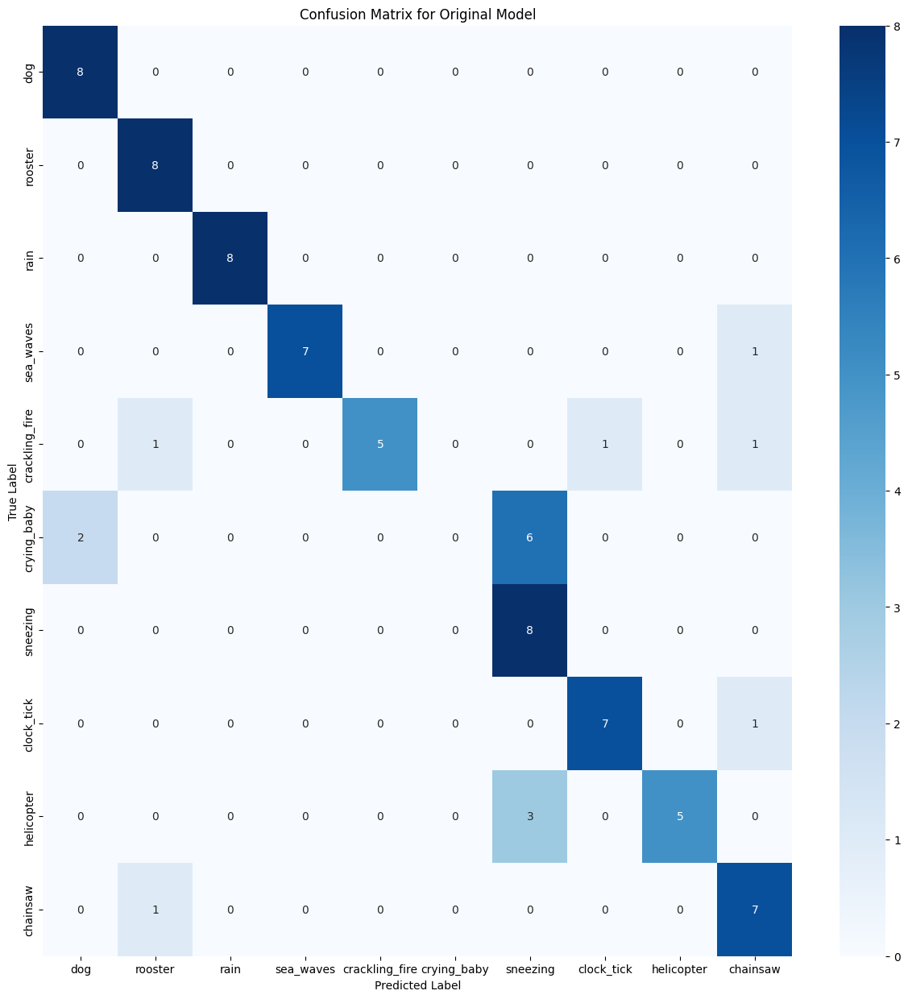

Testing augmented model for fold 1...


80it [00:00, 1281.23it/s]

loading sample at index: 0
loading sample at index: 66


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step
Classification report for augmented model:
                precision    recall  f1-score   support

           dog       1.00      1.00      1.00         8
       rooster       1.00      1.00      1.00         8
          rain       1.00      1.00      1.00         8
     sea_waves       1.00      1.00      1.00         8
crackling_fire       1.00      0.88      0.93         8
   crying_baby       1.00      0.62      0.77         8
      sneezing       0.67      1.00      0.80         8
    clock_tick       0.89      1.00      0.94         8
    helicopter       1.00      0.88      0.93         8
      chainsaw       1.00      1.00      1.00         8

      accuracy                           0.94        80
     macro avg       0.96      0.94      0.94        80
  weighted avg       0.96      0.94      0.94        80



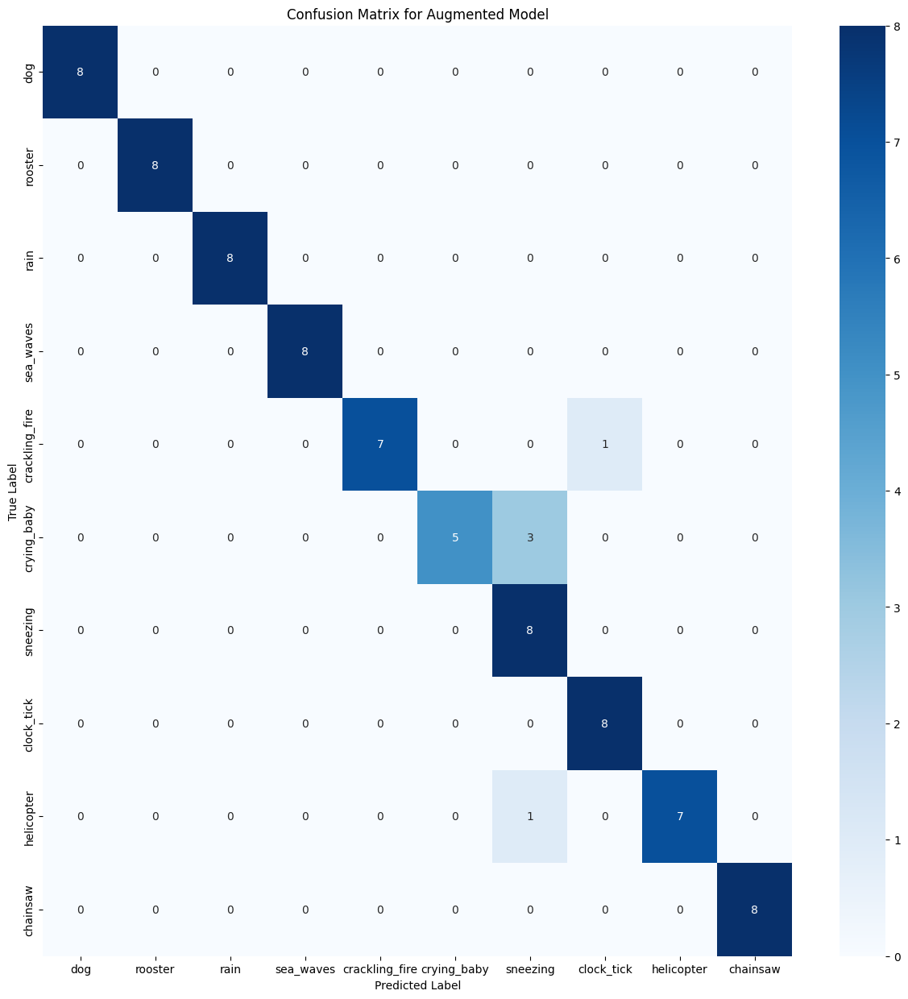

In [114]:
def compare_models(test_fold):
    print(f"\nComparison for fold {test_fold}:\n")
    
    test_original_model(test_fold)
    
    test_augmented_model(test_fold)

test_fold = 1 
compare_models(test_fold)